In [2]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score
import joblib
import os

# Set plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")
plt.rcParams['figure.figsize'] = (12, 8)

In [3]:
# Load the processed data
with open('../data/processed_oil_gas_data.pickle', 'rb') as f:
    processed_data = pickle.load(f)

# Extract the data
X_train = processed_data['X_train']
X_val = processed_data['X_val']
X_test = processed_data['X_test']
y_train = processed_data['y_train']
y_val = processed_data['y_val']
y_test = processed_data['y_test']
feature_names = processed_data['feature_names']

print(f"Training data shape: {X_train.shape}")
print(f"Validation data shape: {X_val.shape}")
print(f"Test data shape: {X_test.shape}")

# Also load the original data to access the date and hierarchical information if needed
df = pd.read_parquet('../data/oil_and_gas_dataset.parquet')

Training data shape: (541998, 744)
Validation data shape: (6389, 744)
Test data shape: (8114, 744)


In [4]:
# Define comprehensive evaluation function
def evaluate_regression_model(model, X, y, dataset_name=""):
    """
    Evaluate a regression model using multiple metrics
    
    Parameters:
    -----------
    model : trained model with predict method
    X : features
    y : target values
    dataset_name : string to identify the dataset in output
    
    Returns:
    --------
    dict : dictionary of metrics
    """
    y_pred = model.predict(X)
    
    # Calculate metrics
    mse = mean_squared_error(y, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    evs = explained_variance_score(y, y_pred)
    
    # Calculate MAPE (Mean Absolute Percentage Error)
    # Avoid division by zero by adding a small epsilon to y values
    epsilon = 1e-10
    mape = np.mean(np.abs((y - y_pred) / (y + epsilon))) * 100
    
    # Calculate median absolute error
    med_ae = np.median(np.abs(y - y_pred))
    
    # Print results
    print(f"\n{dataset_name} Evaluation Results:")
    print(f"MSE: {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE: {mae:.4f}")
    print(f"Median AE: {med_ae:.4f}")
    print(f"MAPE: {mape:.2f}%")
    print(f"R²: {r2:.4f}")
    print(f"Explained Variance Score: {evs:.4f}")
    
    return {
        'mse': mse,
        'rmse': rmse,
        'mae': mae,
        'median_ae': med_ae,
        'mape': mape,
        'r2': r2,
        'evs': evs,
        'predictions': y_pred
    }

In [5]:
# Load the best model
model_path = '../models/best_model.pkl'

if os.path.exists(model_path):
    with open(model_path, 'rb') as f:
        best_model = pickle.load(f)

    print(f"Successfully loaded model from {model_path}")
    print(f"Model type: {type(best_model).__name__}")
else:
    # Try to find any model in the models directory
    models_dir = '../models/'
    model_files = [f for f in os.listdir(models_dir) if f.endswith('.pkl')]
    
    if model_files:
        model_path = os.path.join(models_dir, model_files[0])
        with open(model_path, 'rb') as f:
            best_model = pickle.load(f)
        print(f"Loaded alternative model from {model_path}")
        print(f"Model type: {type(best_model).__name__}")
    else:
        raise FileNotFoundError("No model files found in the models directory")

Successfully loaded model from ../models/best_model.pkl
Model type: RandomForestRegressor


In [6]:
# Evaluate the model on validation and test sets
val_results = evaluate_regression_model(best_model, X_val, y_val, "Validation Set")
test_results = evaluate_regression_model(best_model, X_test, y_test, "Test Set")

# Create a comparison dataframe
comparison_df = pd.DataFrame({
    'Metric': ['MSE', 'RMSE', 'MAE', 'Median AE', 'MAPE (%)', 'R²', 'Explained Variance'],
    'Validation Set': [val_results['mse'], val_results['rmse'], val_results['mae'], 
                       val_results['median_ae'], val_results['mape'], 
                       val_results['r2'], val_results['evs']],
    'Test Set': [test_results['mse'], test_results['rmse'], test_results['mae'], 
                test_results['median_ae'], test_results['mape'], 
                test_results['r2'], test_results['evs']]
})

print("\nMetrics Comparison:")
display(comparison_df)


Validation Set Evaluation Results:
MSE: 0.8806
RMSE: 0.9384
MAE: 0.8218
Median AE: 0.8725
MAPE: 14.58%
R²: -0.0048
Explained Variance Score: 0.6659

Test Set Evaluation Results:
MSE: 1.0557
RMSE: 1.0275
MAE: 0.9111
Median AE: 0.9693
MAPE: 15.87%
R²: -0.2517
Explained Variance Score: 0.6710

Metrics Comparison:


,Metric,Validation Set,Test Set
0,MSE,0.880551,1.055676
1,RMSE,0.938377,1.027461
2,MAE,0.821808,0.911094
3,Median AE,0.872481,0.969319
4,MAPE (%),14.575392,15.874976
5,R²,-0.004754,-0.251706
6,Explained Variance,0.665889,0.670995


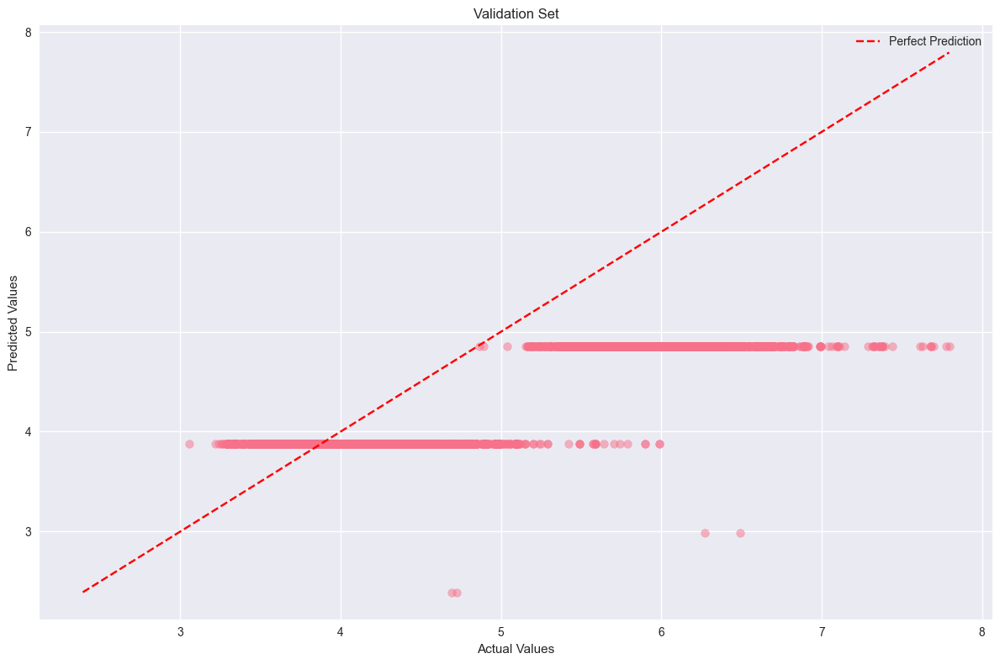

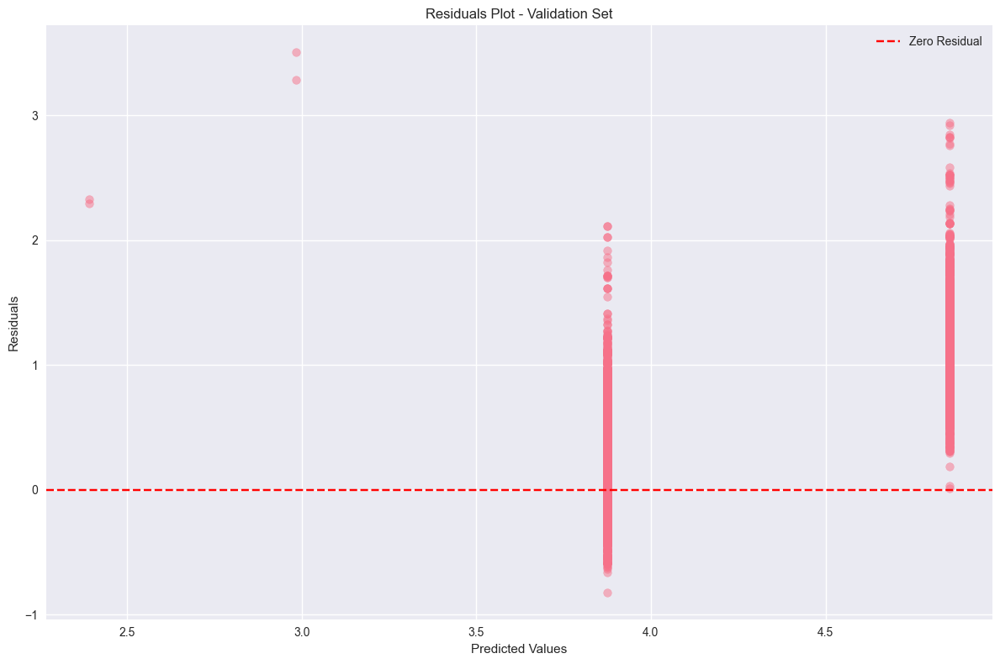

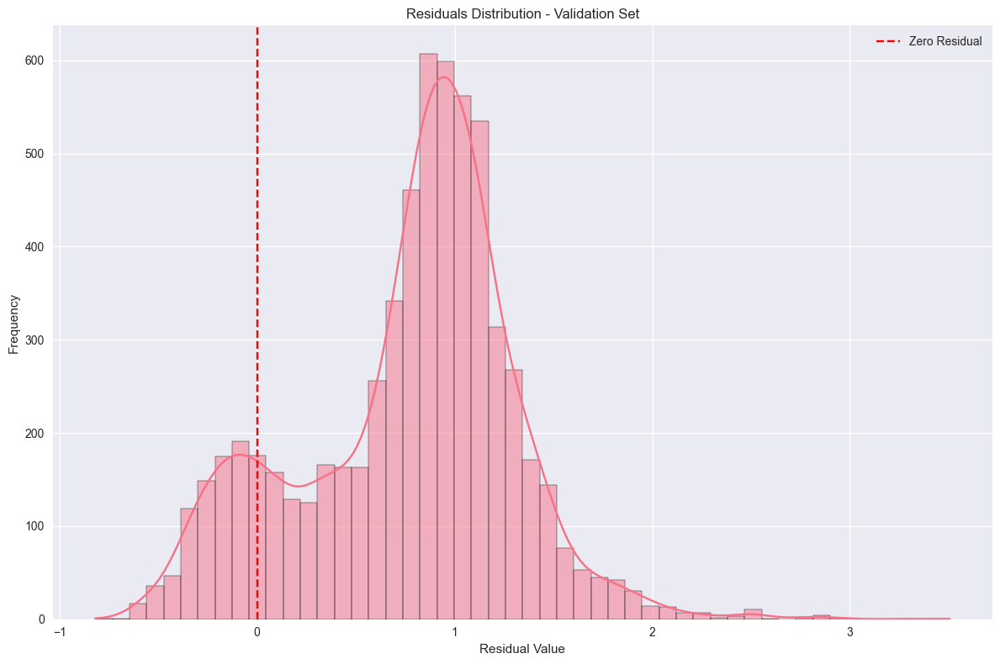

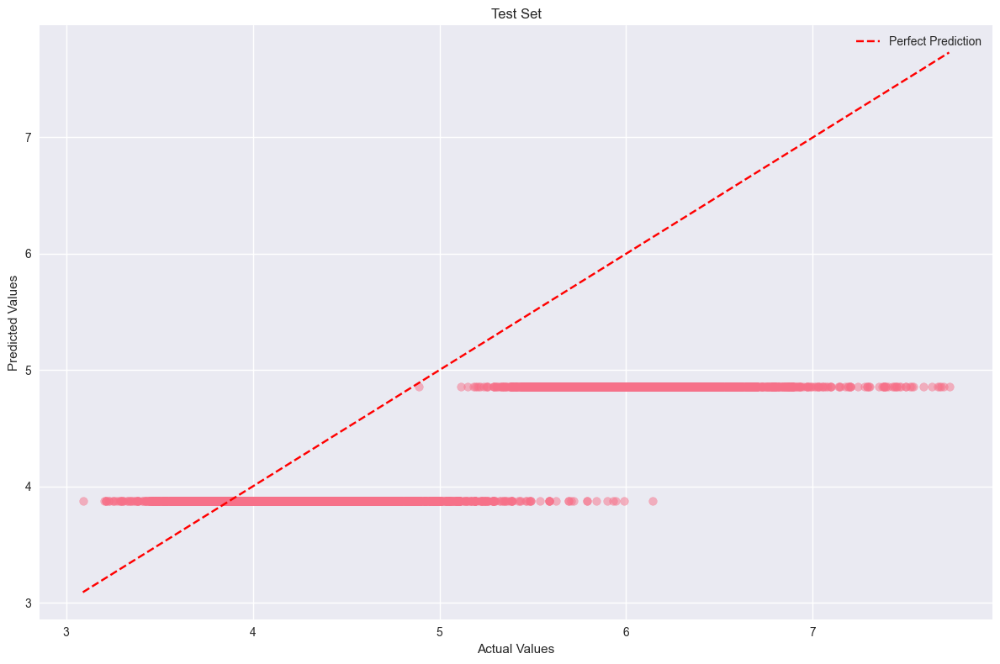

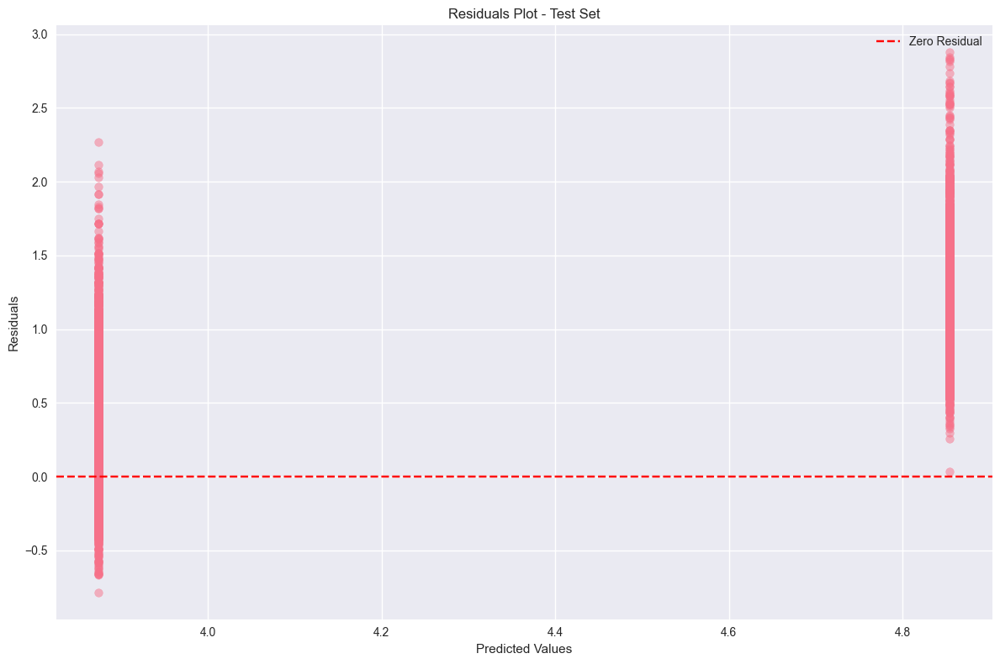

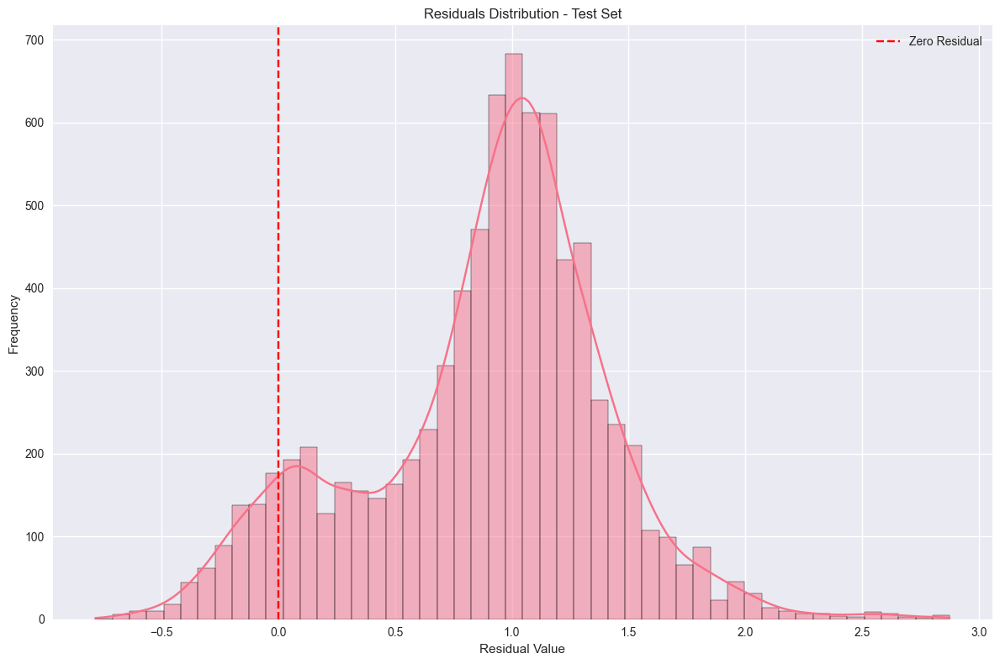

In [7]:
# Visualize actual vs predicted values
def plot_predictions(y_true, y_pred, title="Actual vs Predicted"):
    plt.figure(figsize=(12, 8))
    
    # Create scatter plot
    plt.scatter(y_true, y_pred, alpha=0.5)
    
    # Add perfect prediction line
    min_val = min(min(y_true), min(y_pred))
    max_val = max(max(y_true), max(y_pred))
    plt.plot([min_val, max_val], [min_val, max_val], 'r--', label='Perfect Prediction')
    
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title(title)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # Plot residuals
    residuals = y_true - y_pred
    plt.figure(figsize=(12, 8))
    plt.scatter(y_pred, residuals, alpha=0.5)
    plt.axhline(y=0, color='r', linestyle='--', label='Zero Residual')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title(f'Residuals Plot - {title}')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()
    
    # Plot residuals distribution
    plt.figure(figsize=(12, 8))
    sns.histplot(residuals, kde=True, bins=50)
    plt.axvline(x=0, color='r', linestyle='--', label='Zero Residual')
    plt.xlabel('Residual Value')
    plt.ylabel('Frequency')
    plt.title(f'Residuals Distribution - {title}')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Plot validation set predictions
plot_predictions(y_val, val_results['predictions'], "Validation Set")

# Plot test set predictions
plot_predictions(y_test, test_results['predictions'], "Test Set")

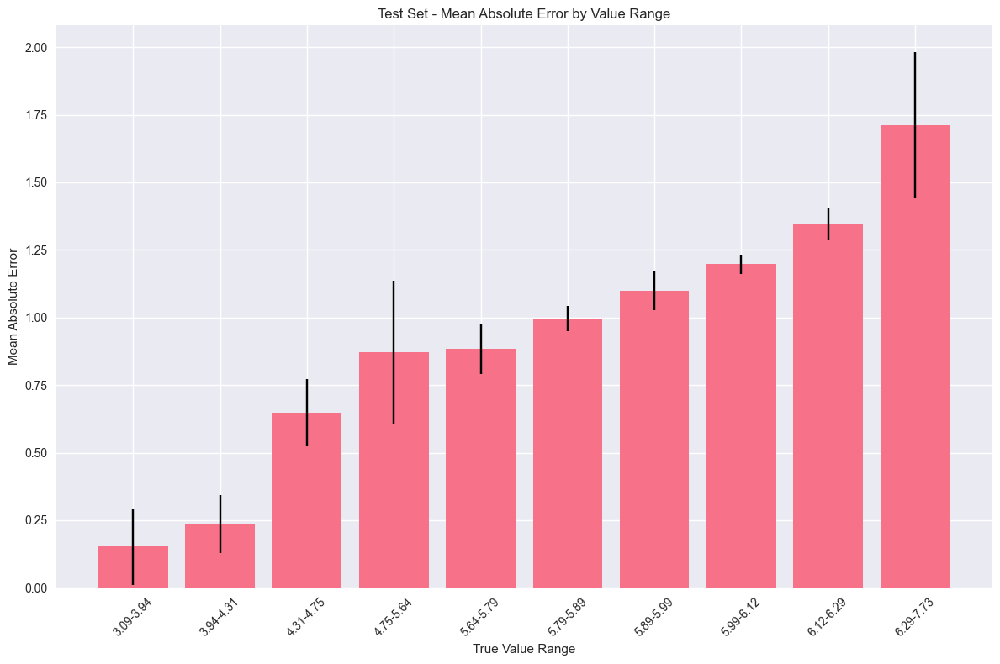

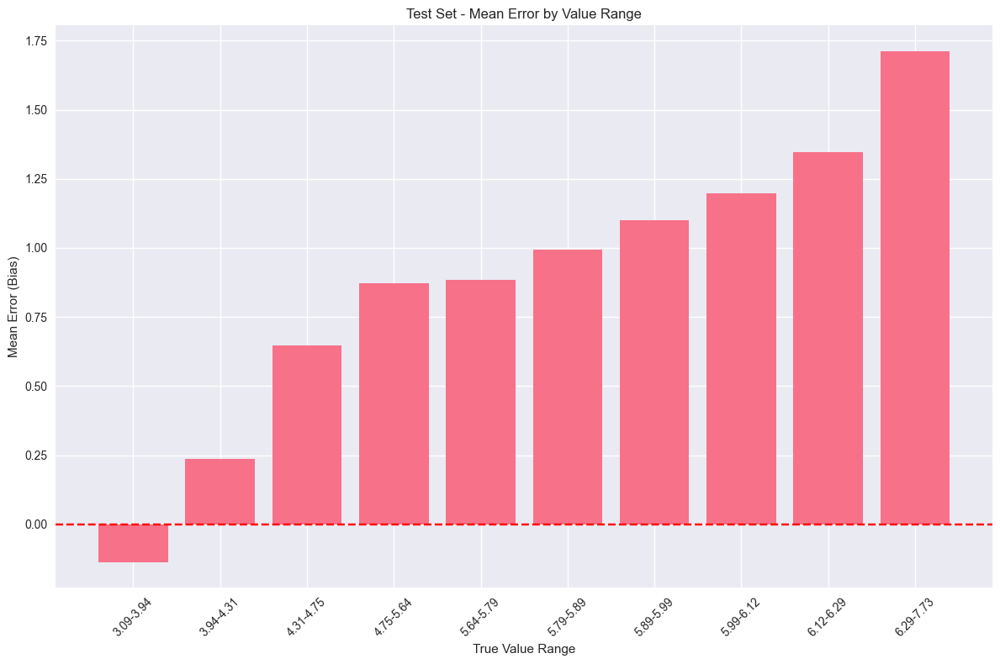

In [8]:
# Error analysis by prediction magnitude
def analyze_errors_by_magnitude(y_true, y_pred, n_bins=10, title="Error Analysis by Magnitude"):
    # Create bins based on true values
    bins = pd.qcut(y_true, n_bins, duplicates='drop')
    
    # Calculate errors
    errors = y_true - y_pred
    abs_errors = np.abs(errors)
    
    # Group by bins and calculate statistics
    error_analysis = pd.DataFrame({
        'true_value': y_true,
        'predicted': y_pred,
        'error': errors,
        'abs_error': abs_errors,
        'bin': bins
    })
    
    bin_stats = error_analysis.groupby('bin').agg({
        'true_value': ['mean', 'count'],
        'abs_error': ['mean', 'median', 'std'],
        'error': ['mean']
    })
    
    bin_stats.columns = ['_'.join(col).strip() for col in bin_stats.columns.values]
    bin_stats = bin_stats.reset_index()
    
    # Plot mean absolute error by bin
    plt.figure(figsize=(12, 8))
    plt.bar(range(len(bin_stats)), bin_stats['abs_error_mean'], yerr=bin_stats['abs_error_std'])
    plt.xticks(range(len(bin_stats)), [f"{b.left:.2f}-{b.right:.2f}" for b in bin_stats['bin']], rotation=45)
    plt.xlabel('True Value Range')
    plt.ylabel('Mean Absolute Error')
    plt.title(f'{title} - Mean Absolute Error by Value Range')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()
    
    # Plot bias (mean error) by bin
    plt.figure(figsize=(12, 8))
    plt.bar(range(len(bin_stats)), bin_stats['error_mean'])
    plt.xticks(range(len(bin_stats)), [f"{b.left:.2f}-{b.right:.2f}" for b in bin_stats['bin']], rotation=45)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('True Value Range')
    plt.ylabel('Mean Error (Bias)')
    plt.title(f'{title} - Mean Error by Value Range')
    plt.grid(True, axis='y')
    plt.tight_layout()
    plt.show()
    
    return bin_stats

# Analyze errors by magnitude for test set
test_error_analysis = analyze_errors_by_magnitude(y_test, test_results['predictions'], 
                                                 title="Test Set")


Feature Importance for Estimator 1 (DecisionTreeRegressor):


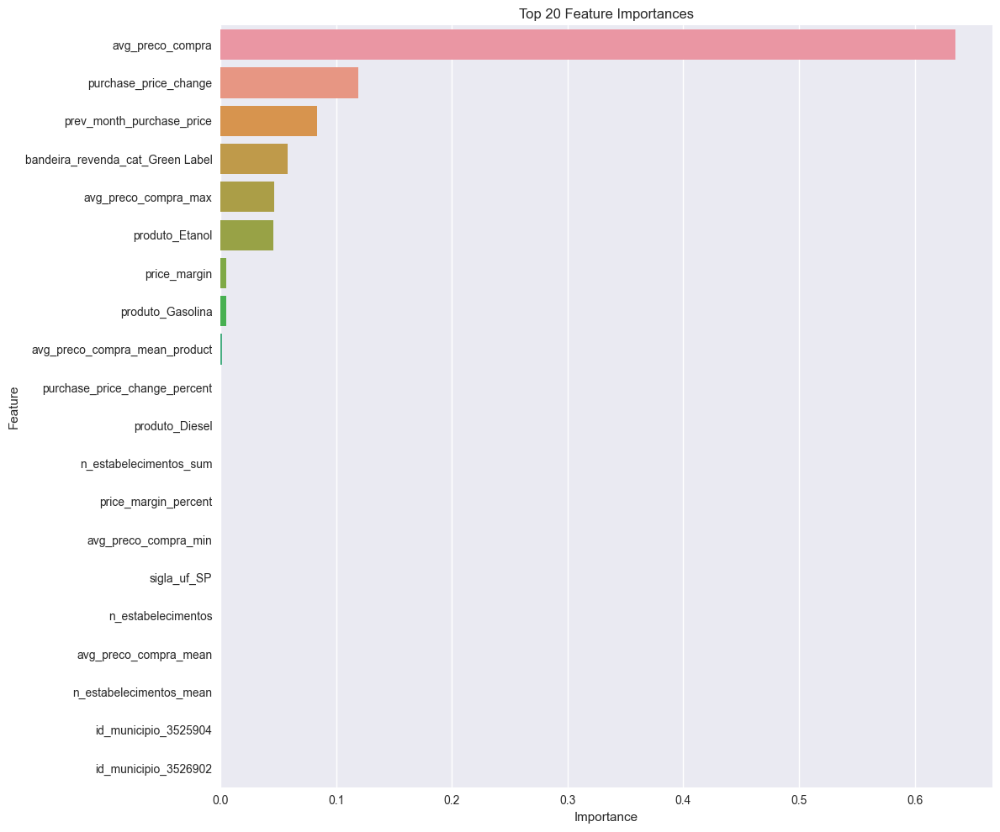


Feature Importance for Estimator 2 (DecisionTreeRegressor):


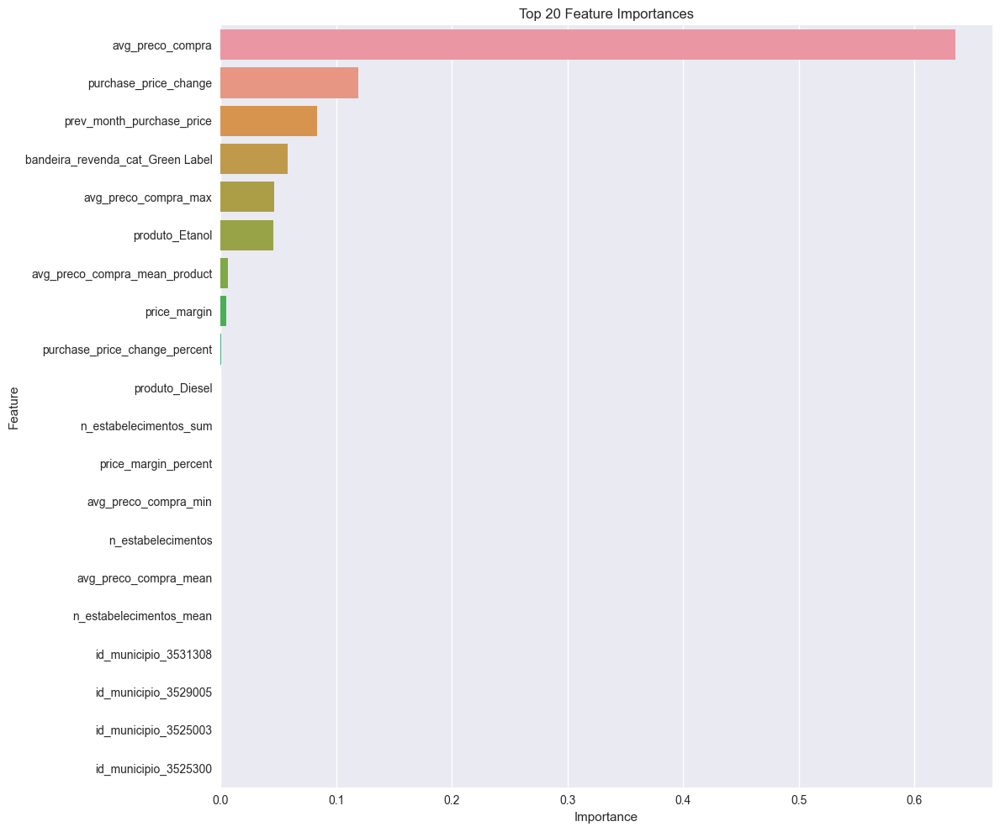


Feature Importance for Estimator 3 (DecisionTreeRegressor):


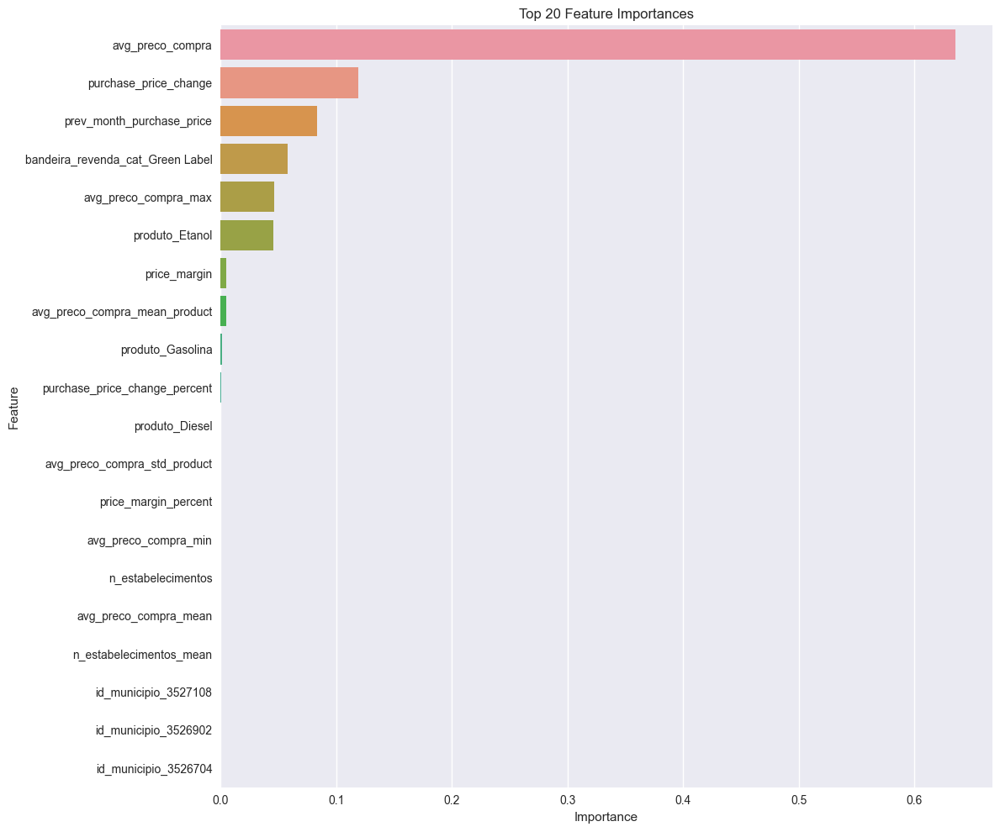


Feature Importance for Estimator 4 (DecisionTreeRegressor):


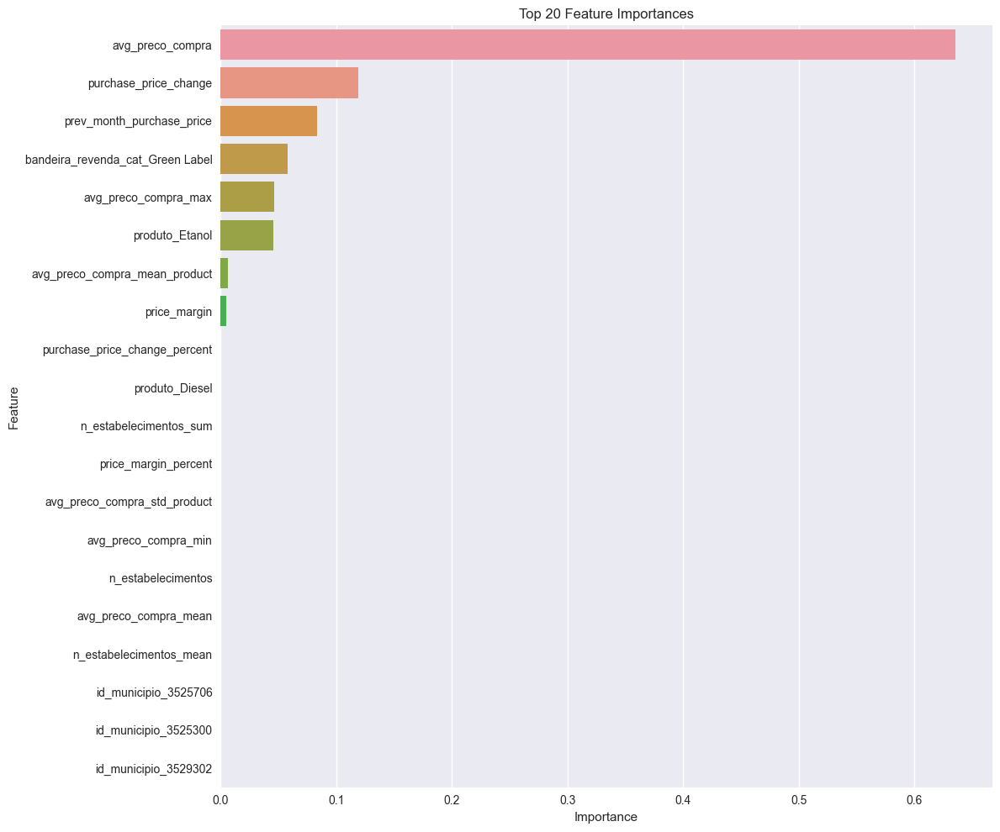


Feature Importance for Estimator 5 (DecisionTreeRegressor):


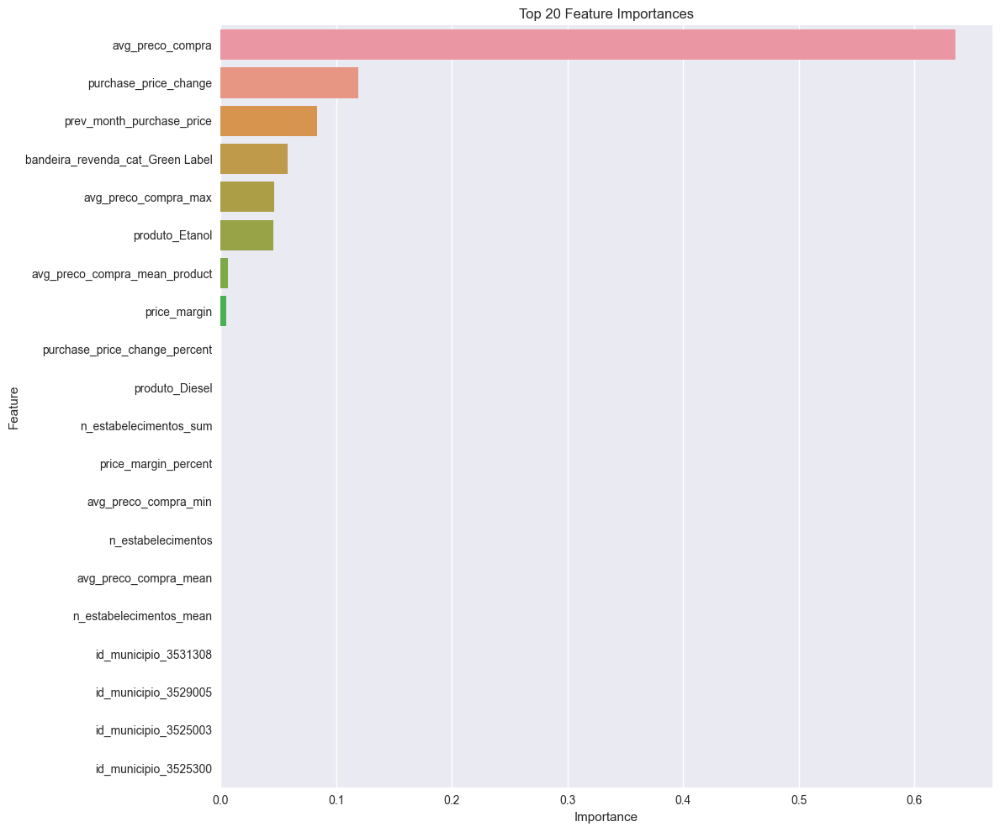


Feature Importance for Estimator 6 (DecisionTreeRegressor):


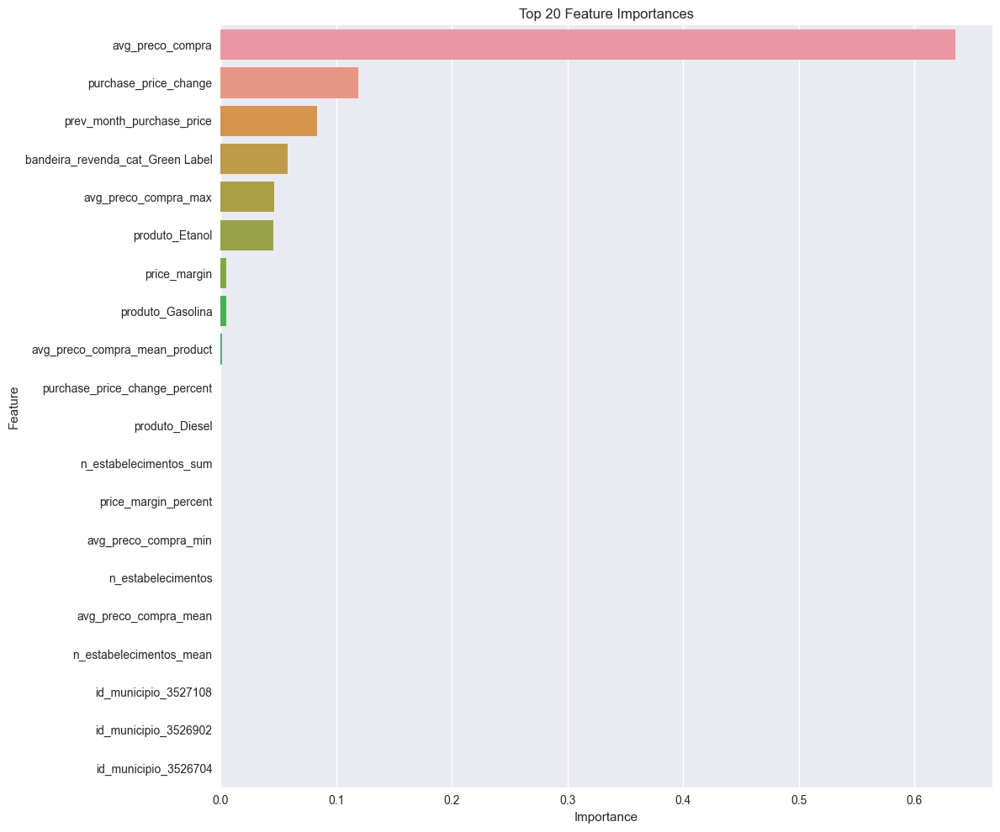


Feature Importance for Estimator 7 (DecisionTreeRegressor):


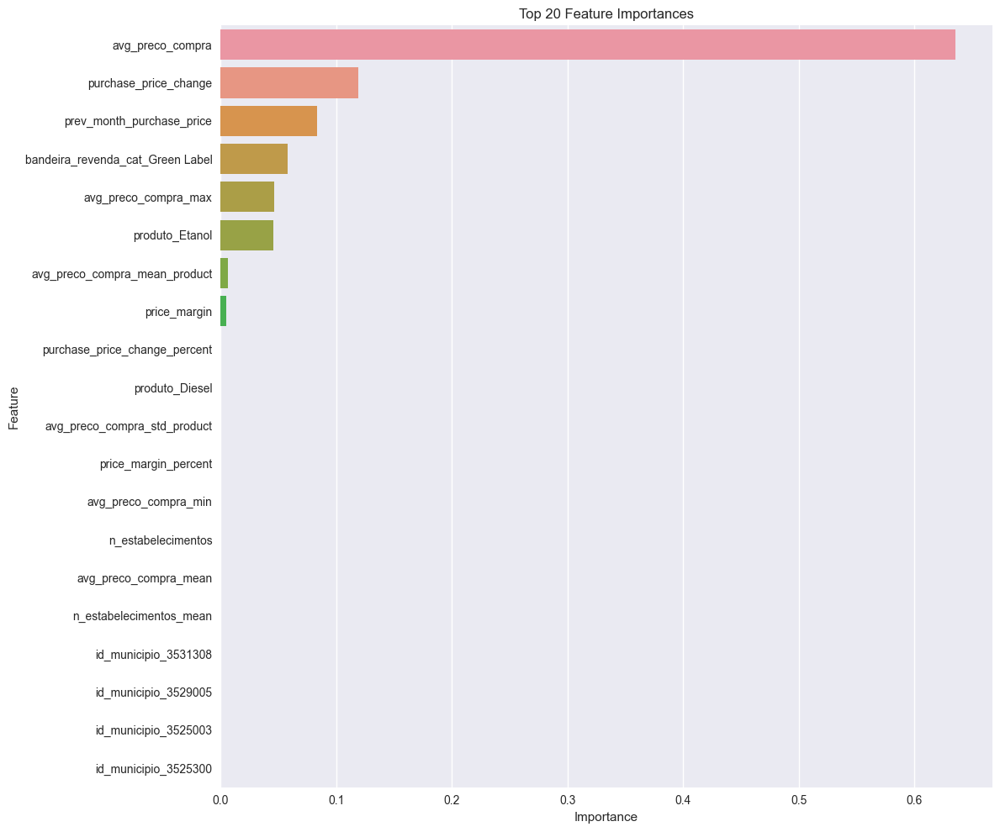


Feature Importance for Estimator 8 (DecisionTreeRegressor):


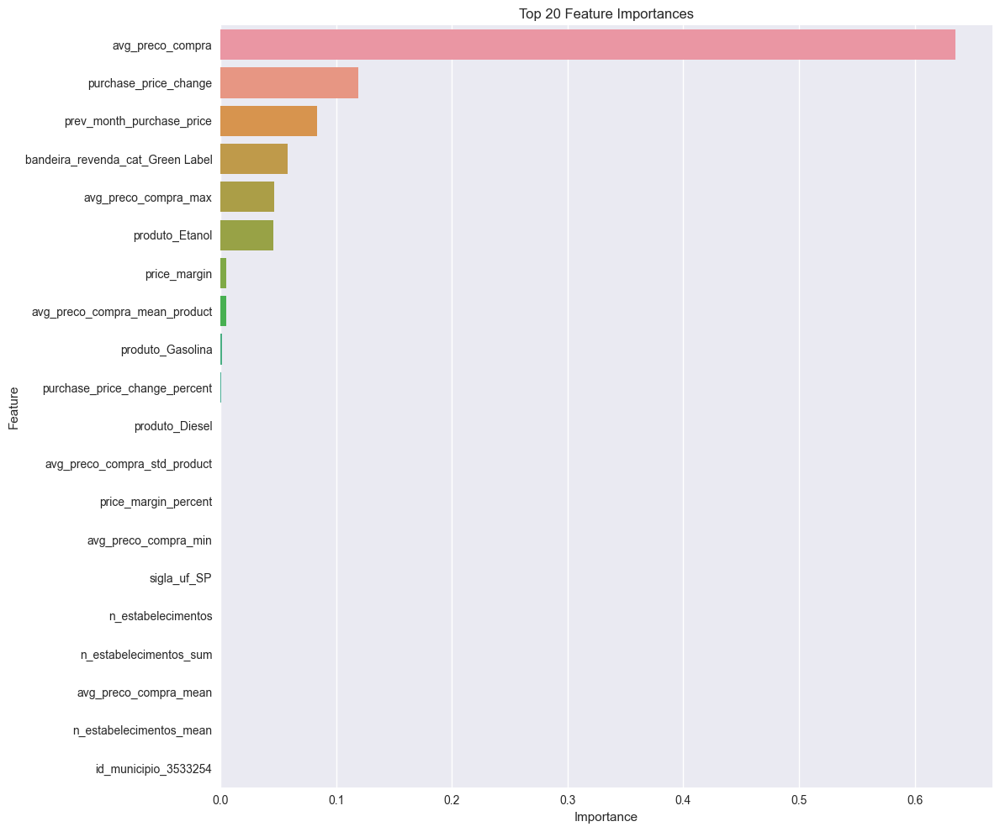


Feature Importance for Estimator 9 (DecisionTreeRegressor):


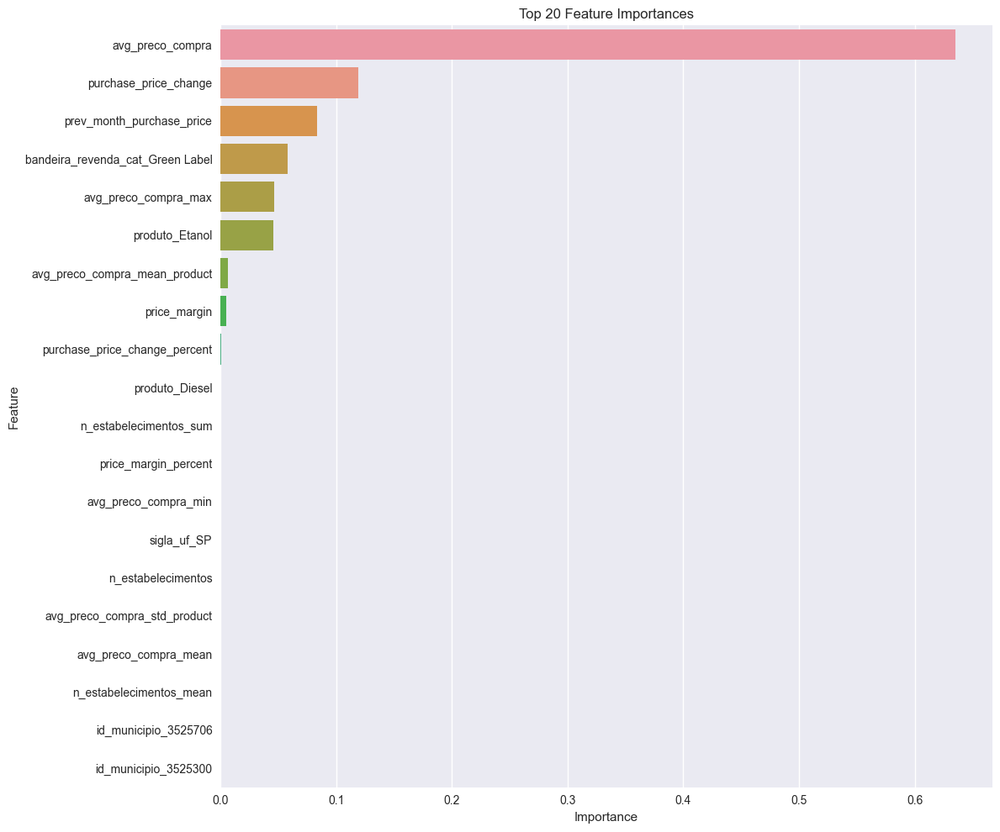


Feature Importance for Estimator 10 (DecisionTreeRegressor):


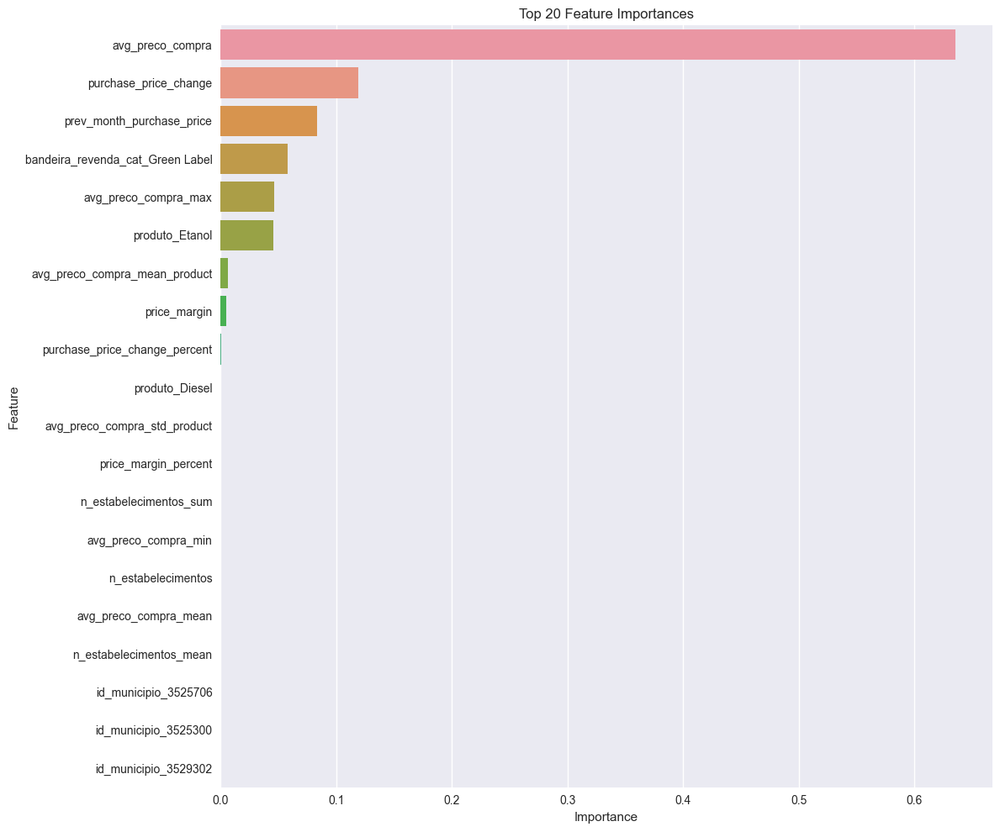


Feature Importance for Estimator 11 (DecisionTreeRegressor):


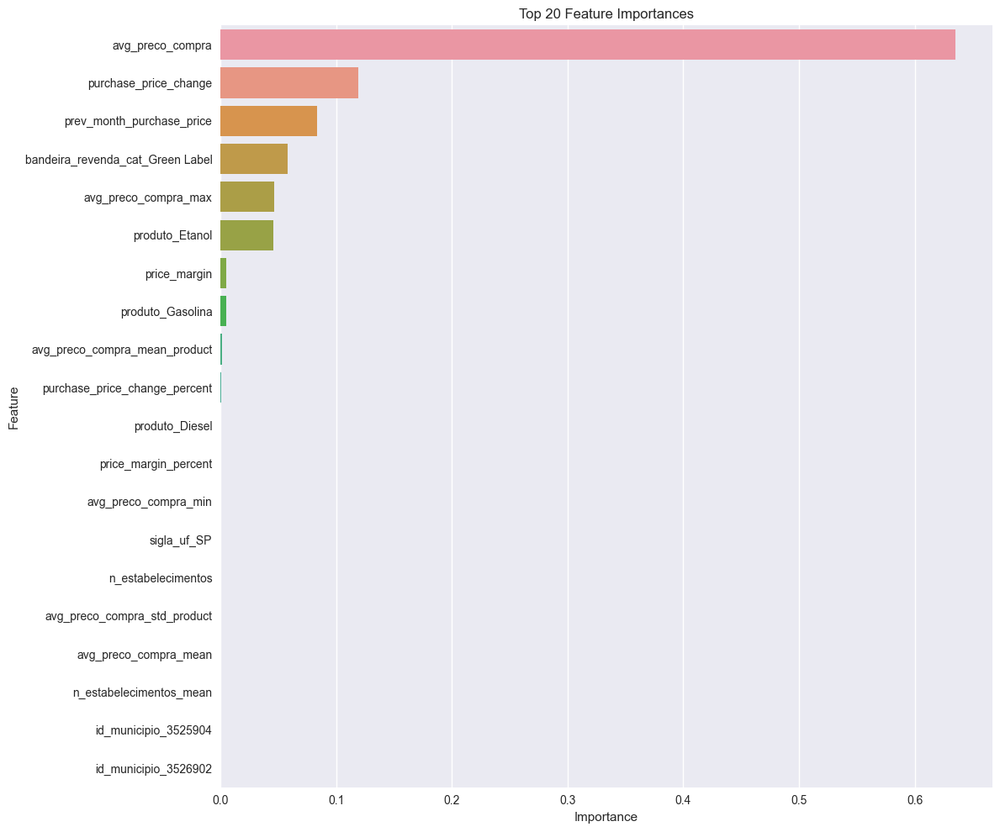


Feature Importance for Estimator 12 (DecisionTreeRegressor):


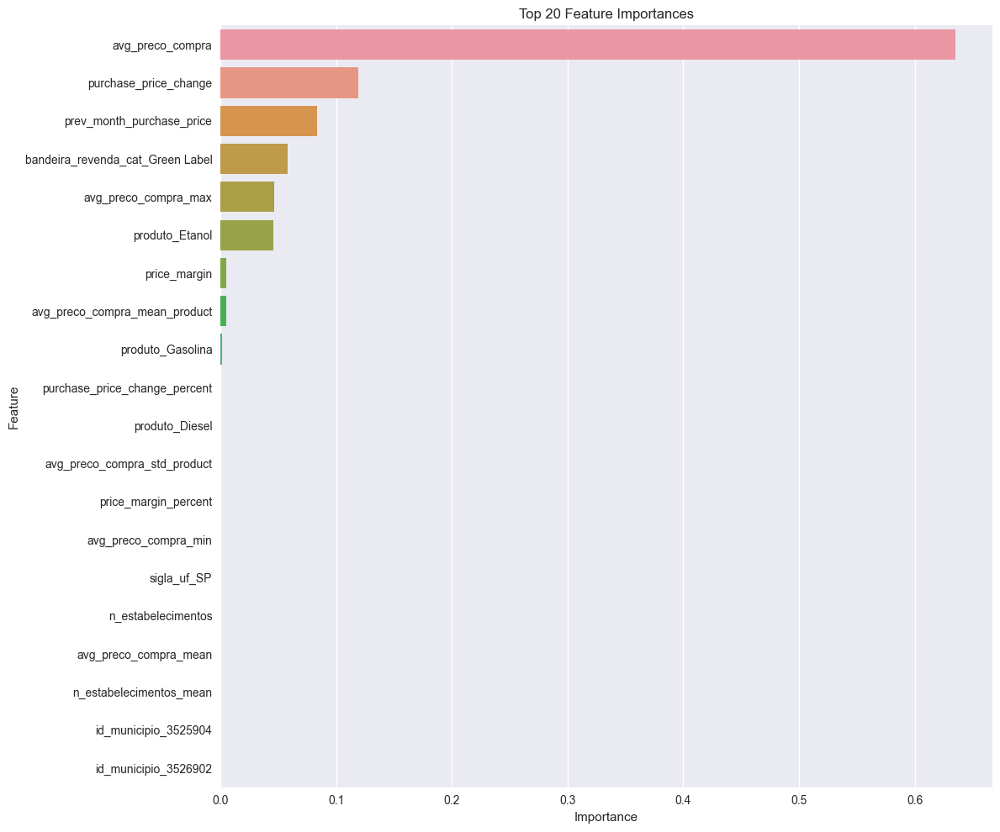


Feature Importance for Estimator 13 (DecisionTreeRegressor):


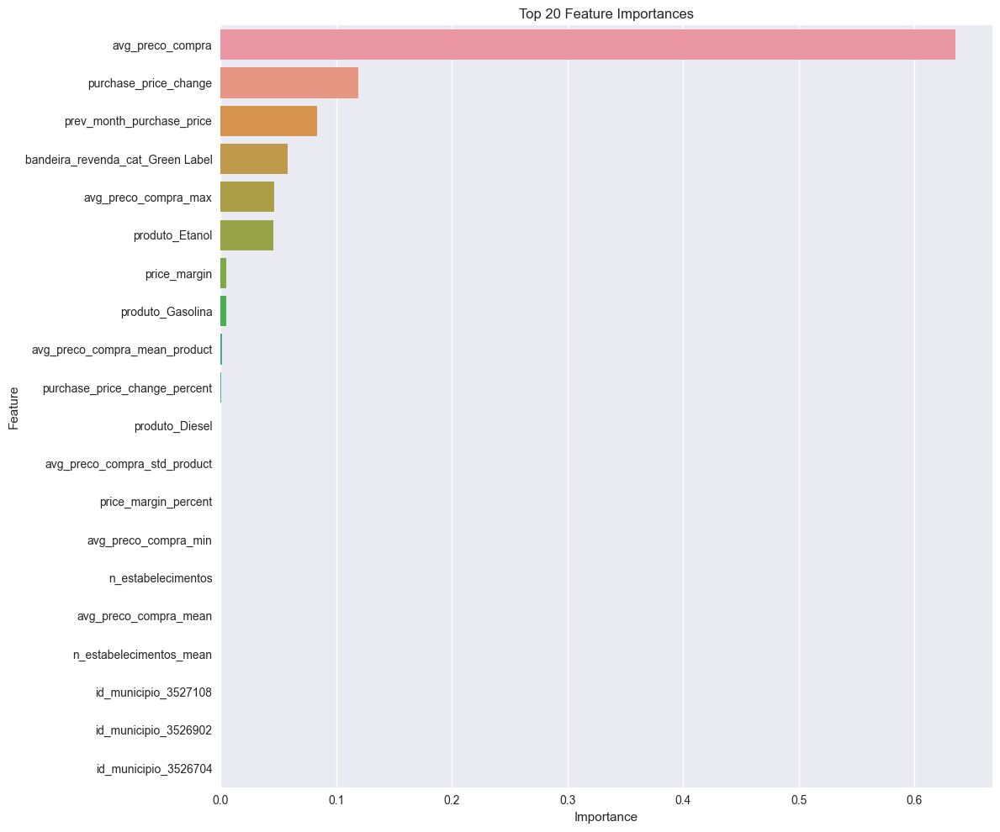


Feature Importance for Estimator 14 (DecisionTreeRegressor):


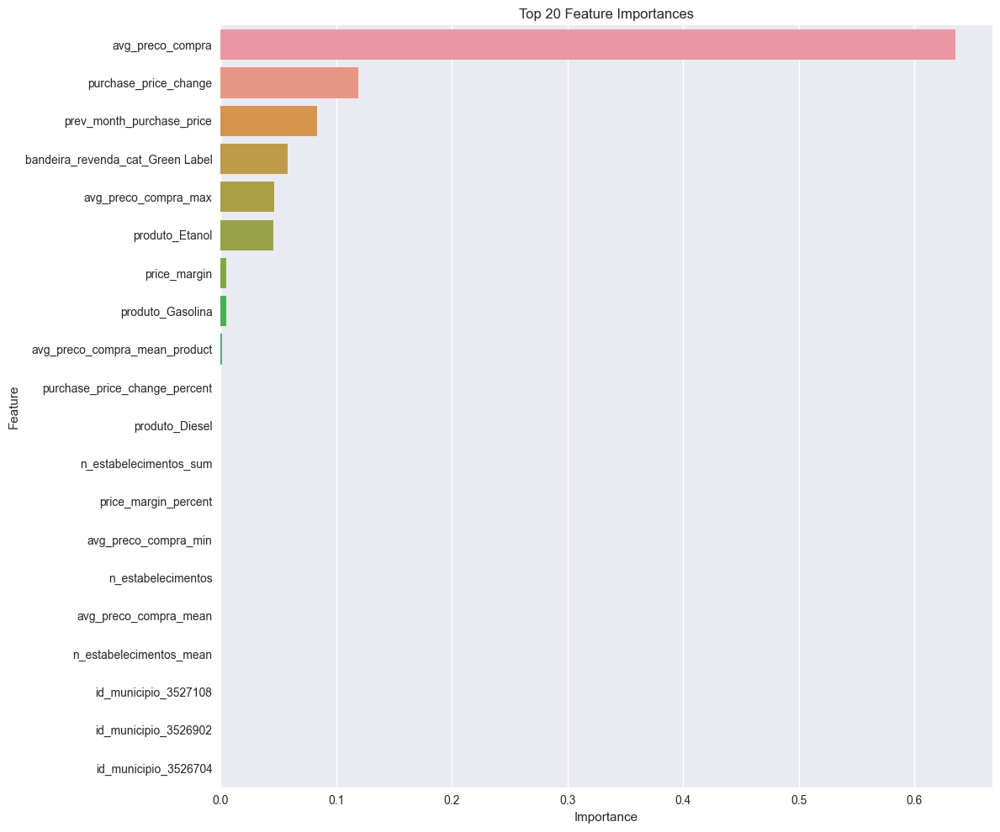


Feature Importance for Estimator 15 (DecisionTreeRegressor):


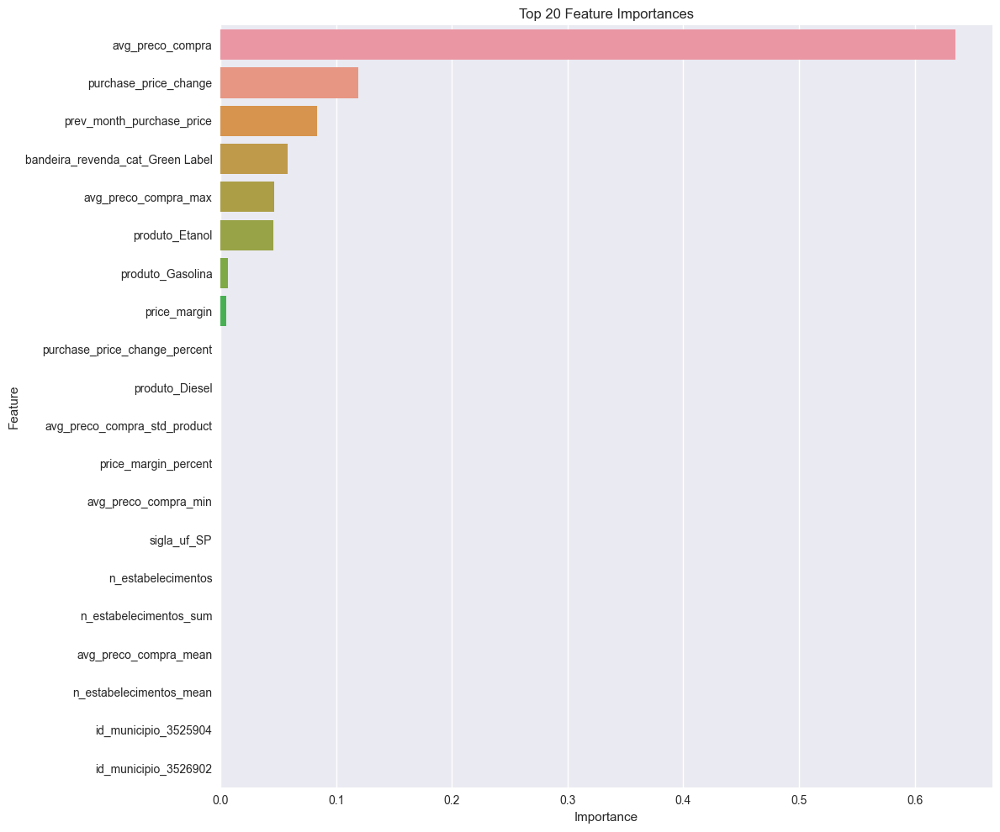


Feature Importance for Estimator 16 (DecisionTreeRegressor):


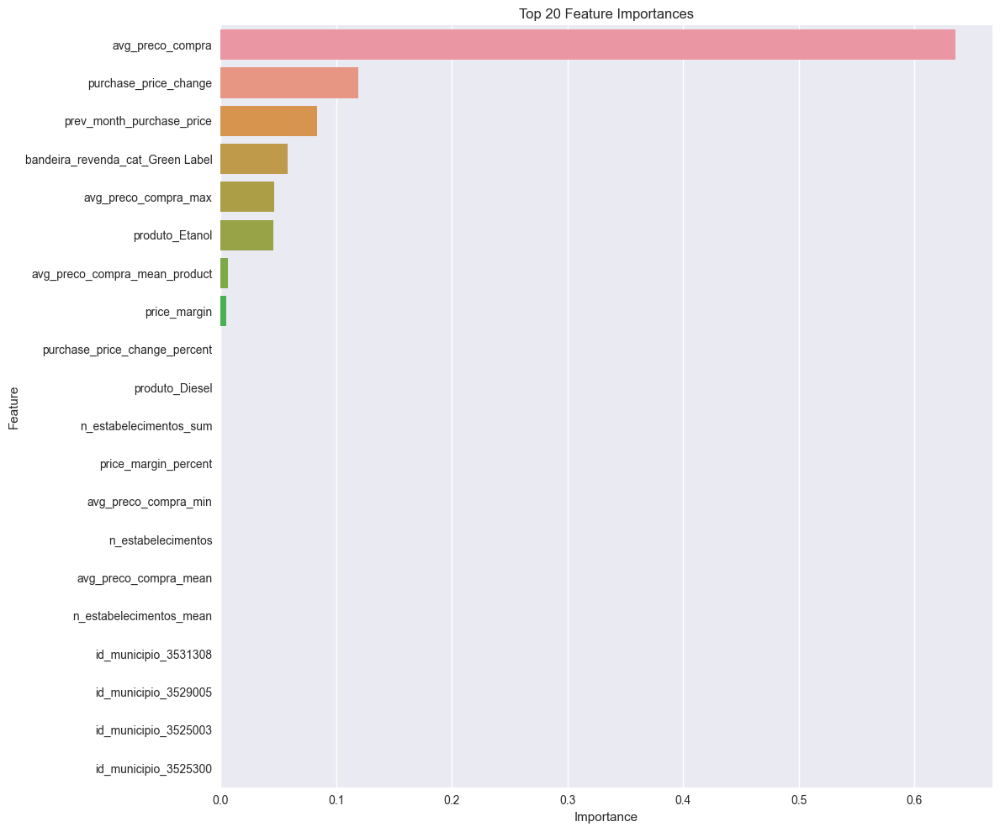


Feature Importance for Estimator 17 (DecisionTreeRegressor):


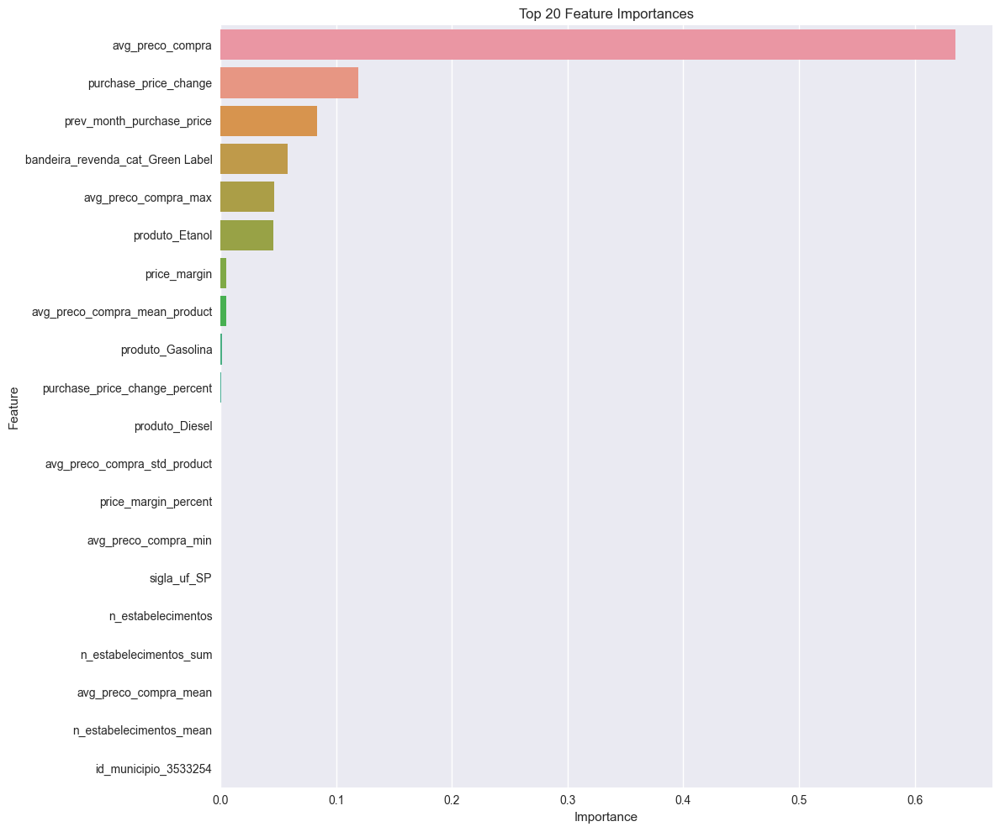


Feature Importance for Estimator 18 (DecisionTreeRegressor):


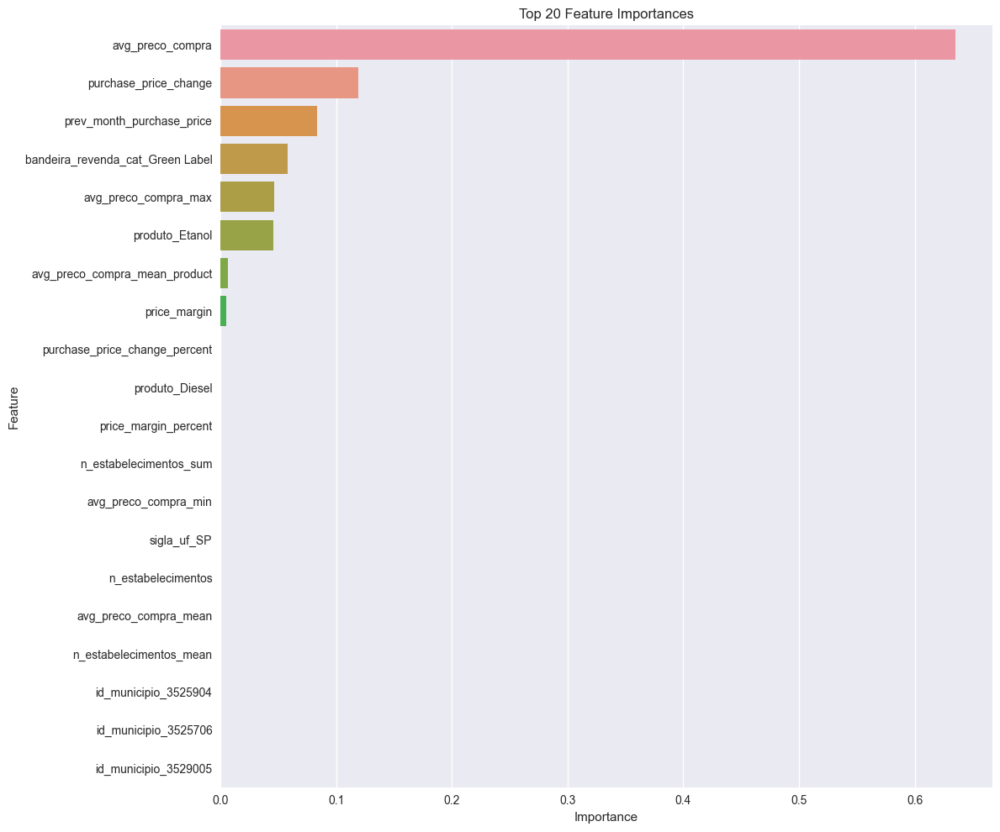


Feature Importance for Estimator 19 (DecisionTreeRegressor):


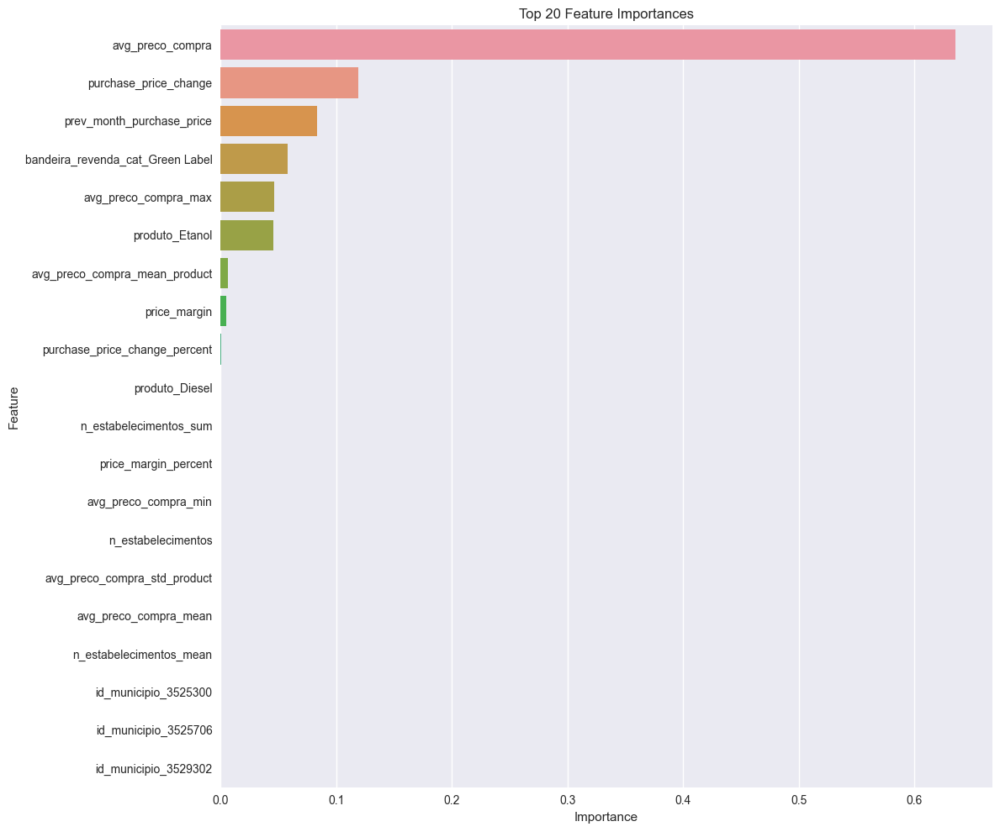


Feature Importance for Estimator 20 (DecisionTreeRegressor):


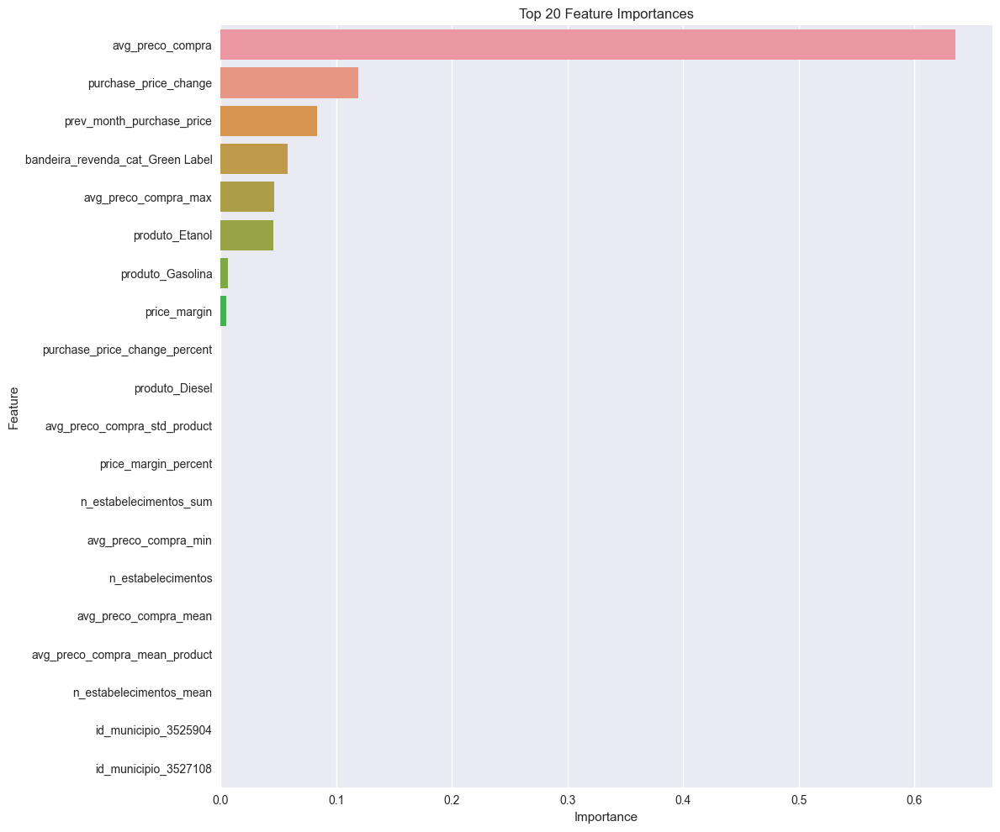


Feature Importance for Estimator 21 (DecisionTreeRegressor):


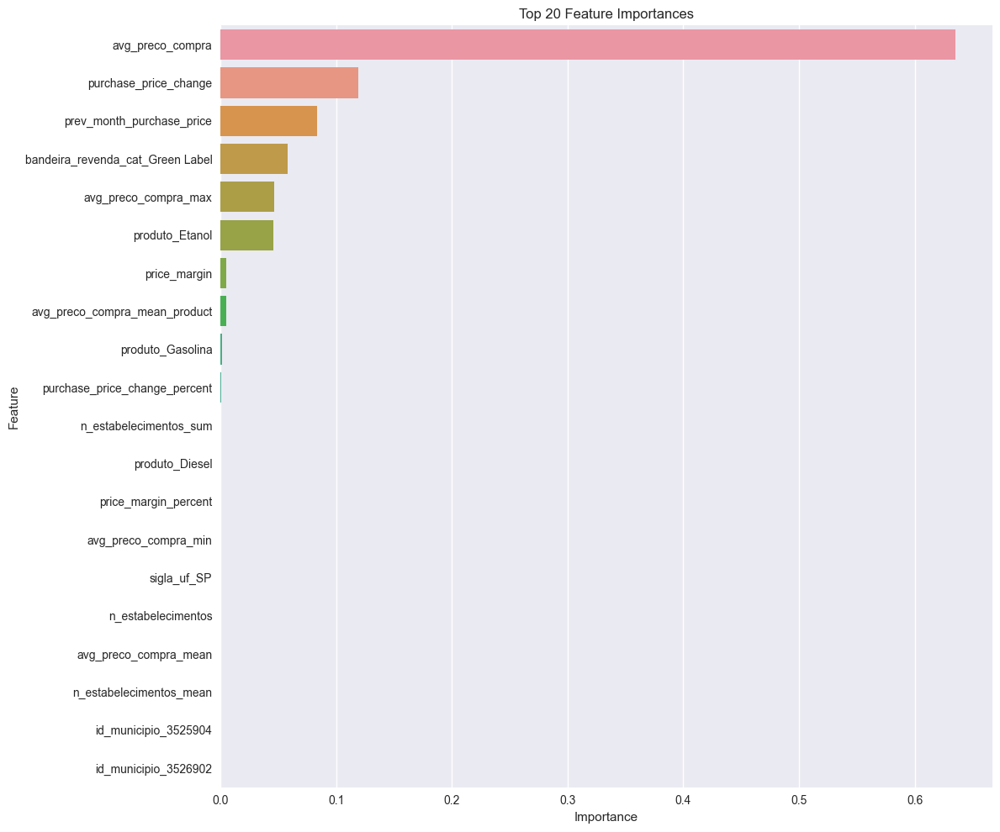


Feature Importance for Estimator 22 (DecisionTreeRegressor):


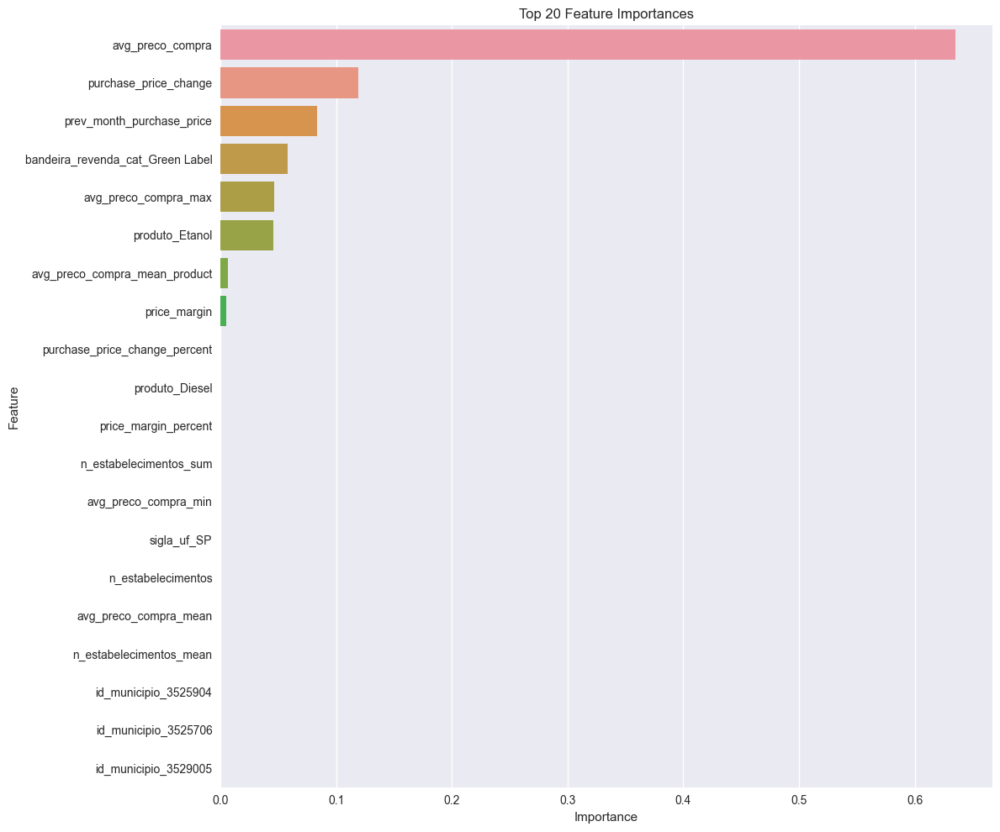


Feature Importance for Estimator 23 (DecisionTreeRegressor):


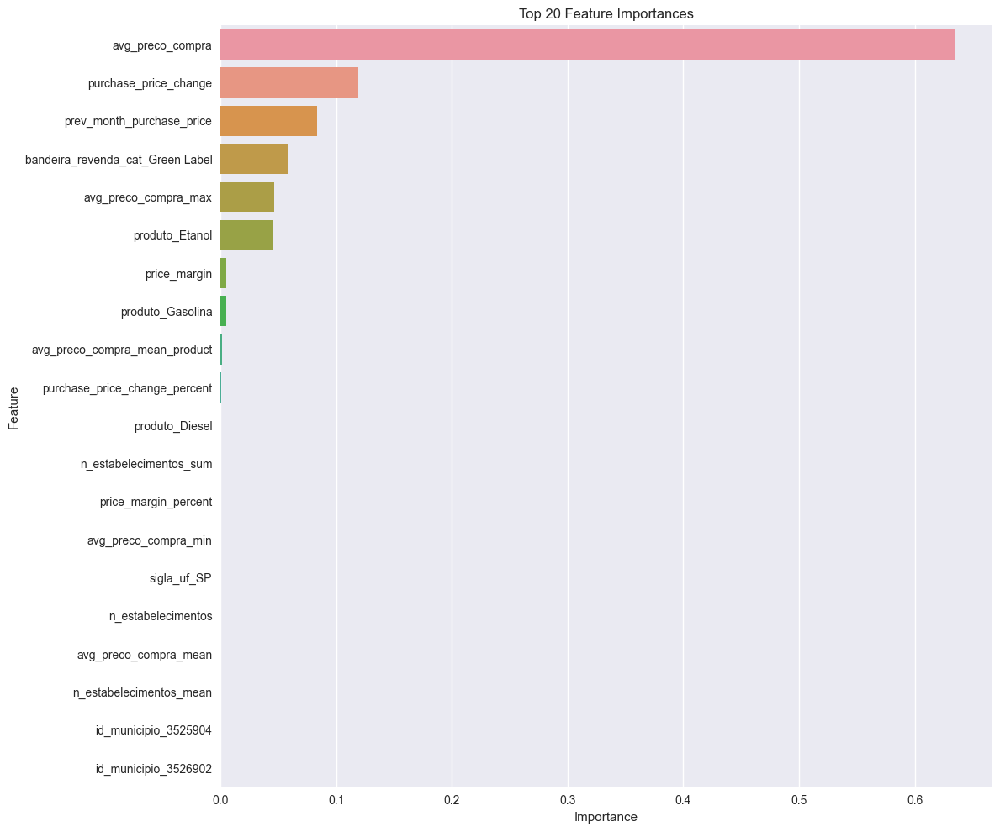


Feature Importance for Estimator 24 (DecisionTreeRegressor):


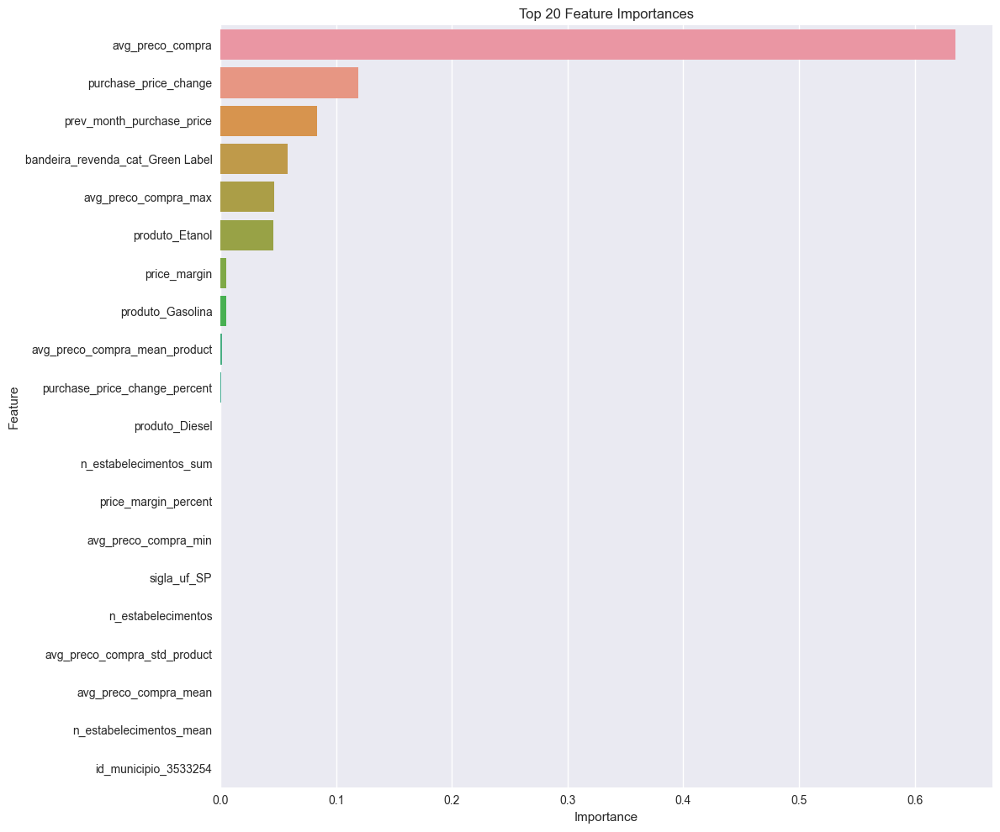


Feature Importance for Estimator 25 (DecisionTreeRegressor):


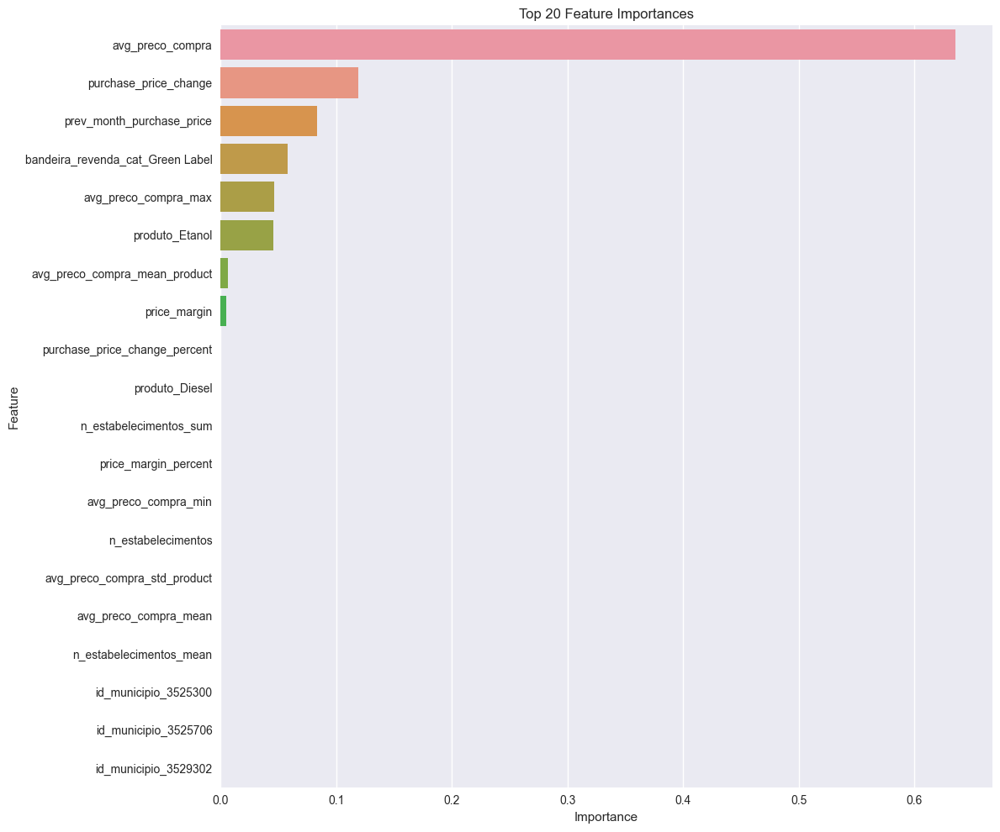


Feature Importance for Estimator 26 (DecisionTreeRegressor):


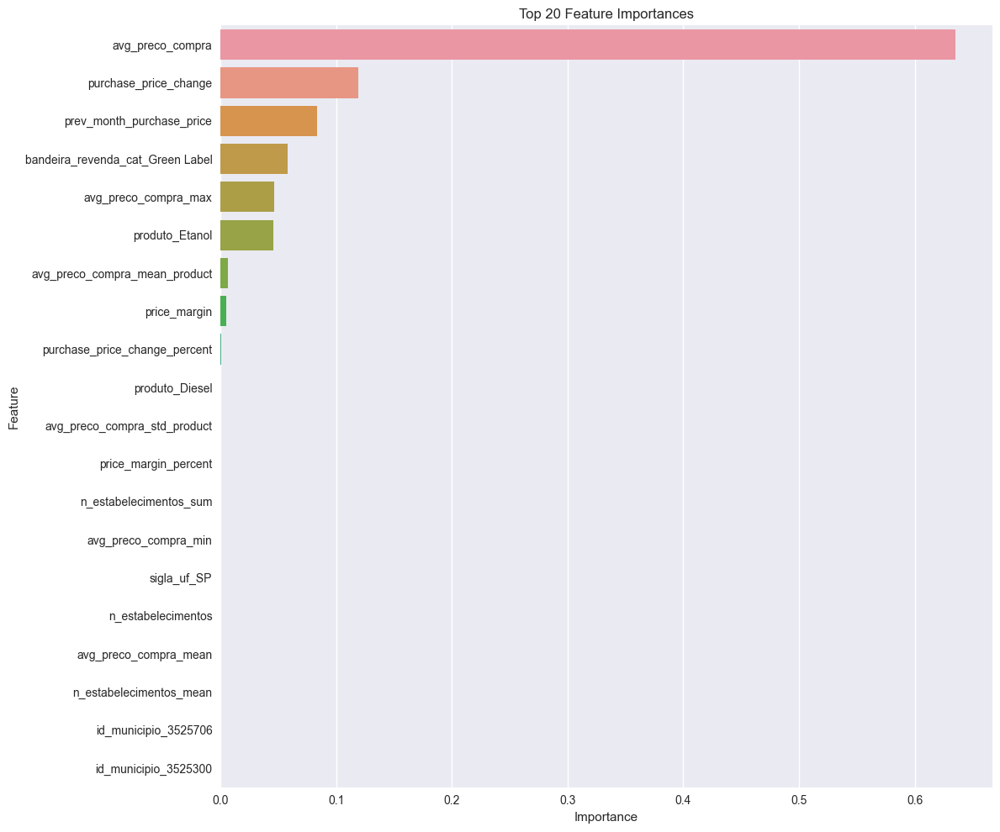


Feature Importance for Estimator 27 (DecisionTreeRegressor):


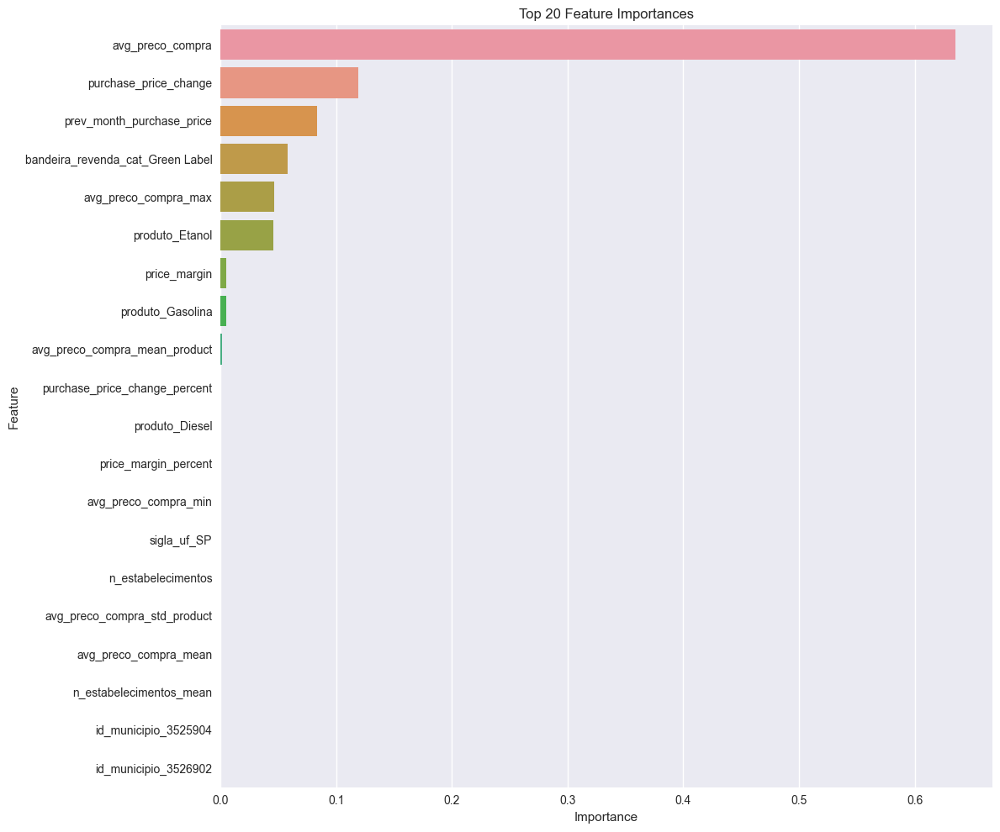


Feature Importance for Estimator 28 (DecisionTreeRegressor):


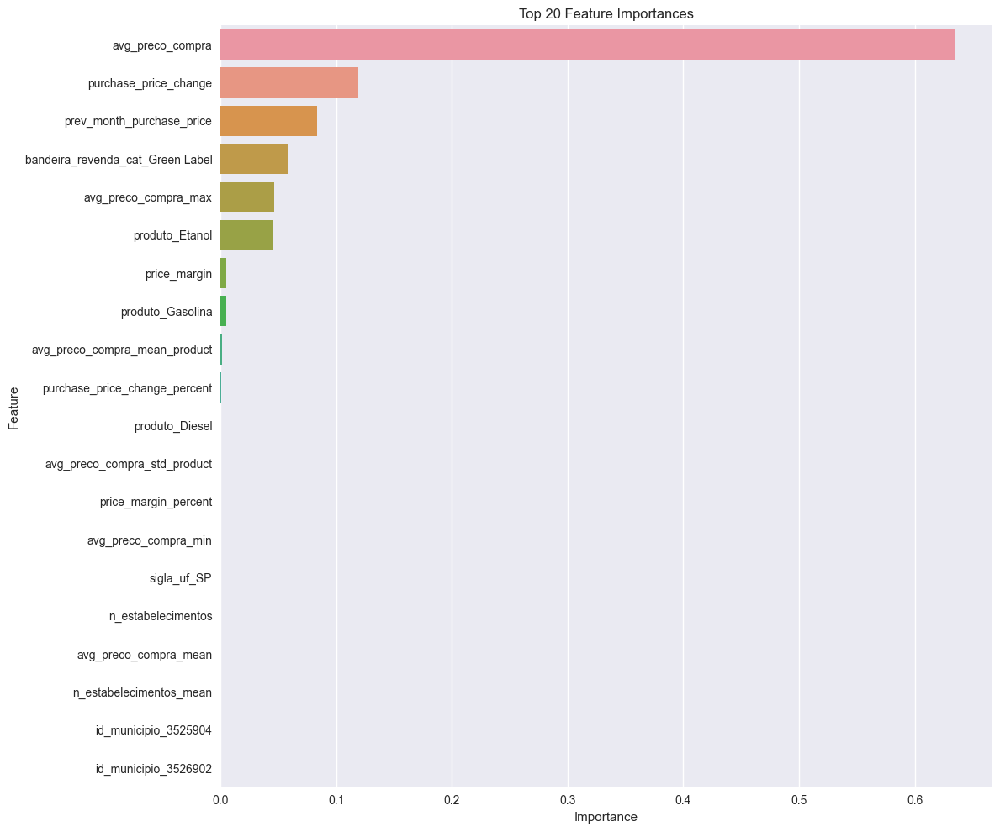


Feature Importance for Estimator 29 (DecisionTreeRegressor):


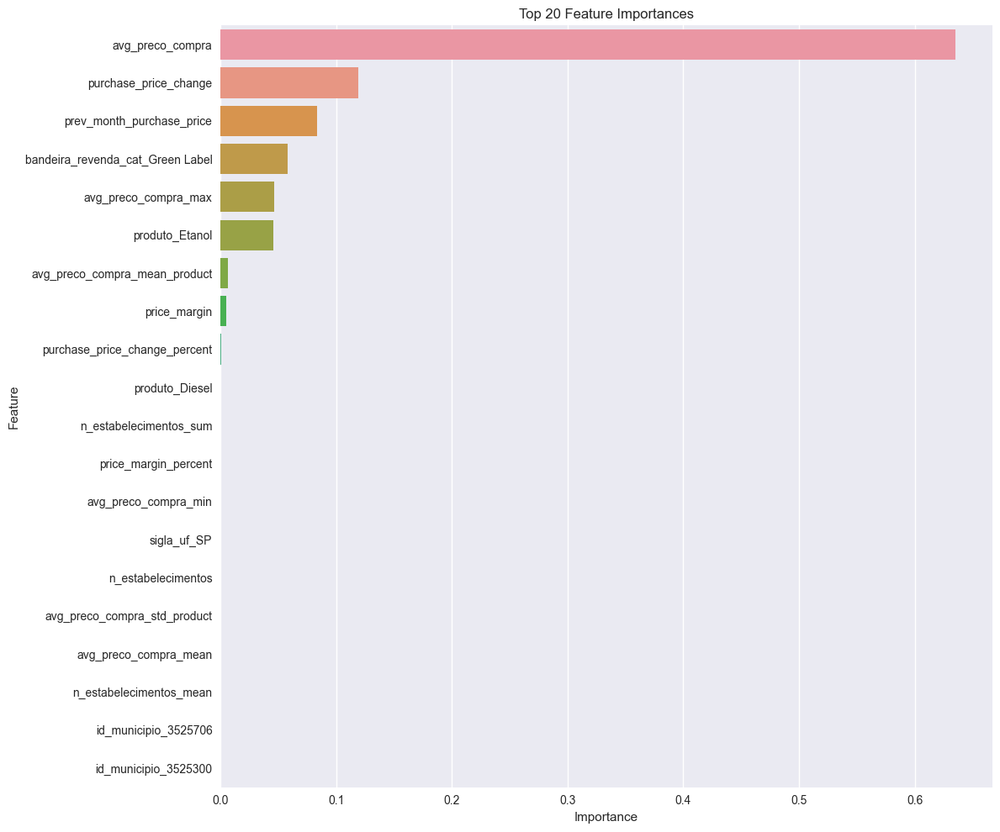


Feature Importance for Estimator 30 (DecisionTreeRegressor):


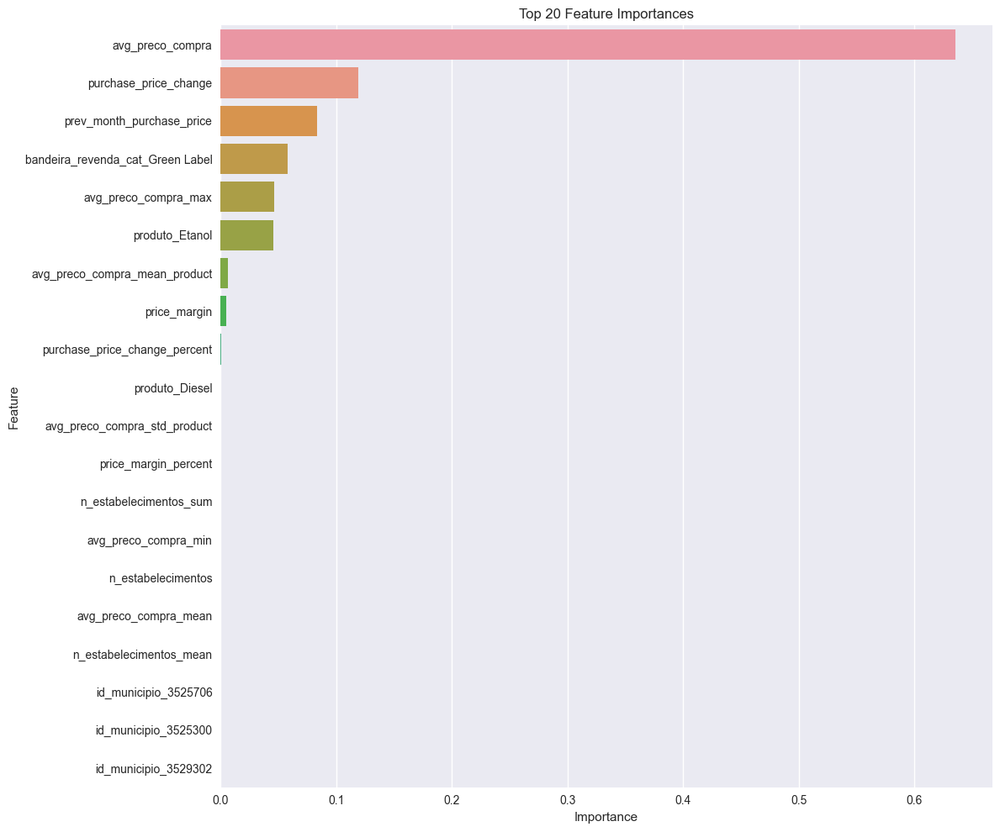


Feature Importance for Estimator 31 (DecisionTreeRegressor):


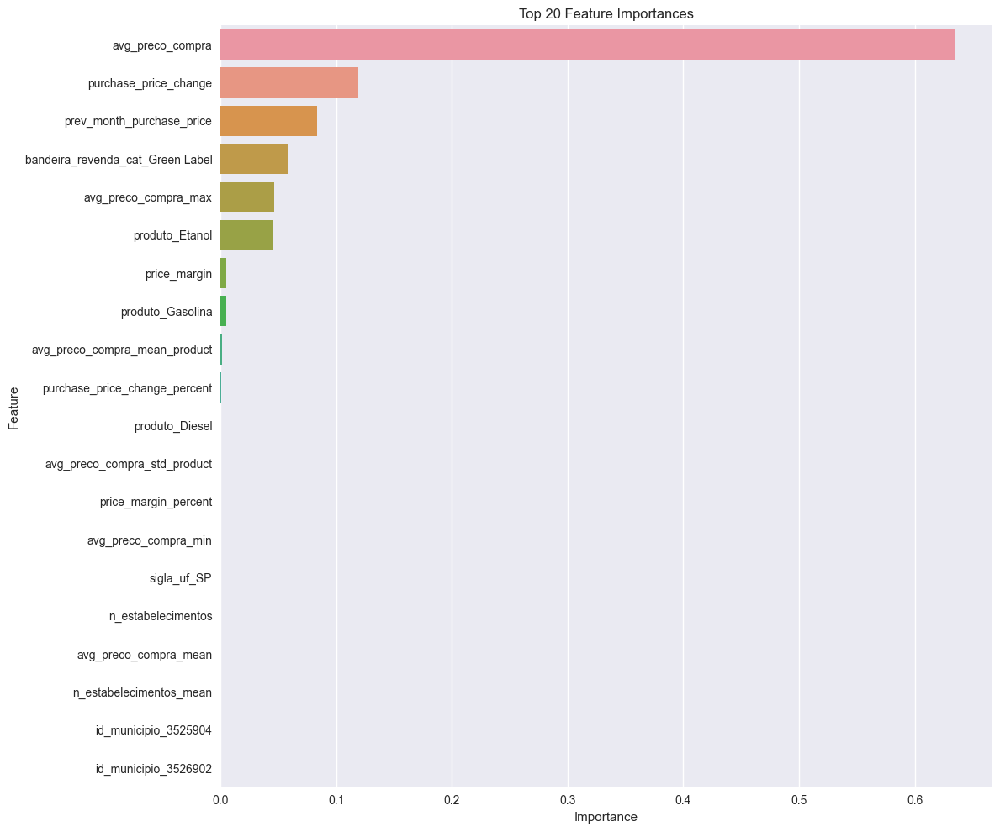


Feature Importance for Estimator 32 (DecisionTreeRegressor):


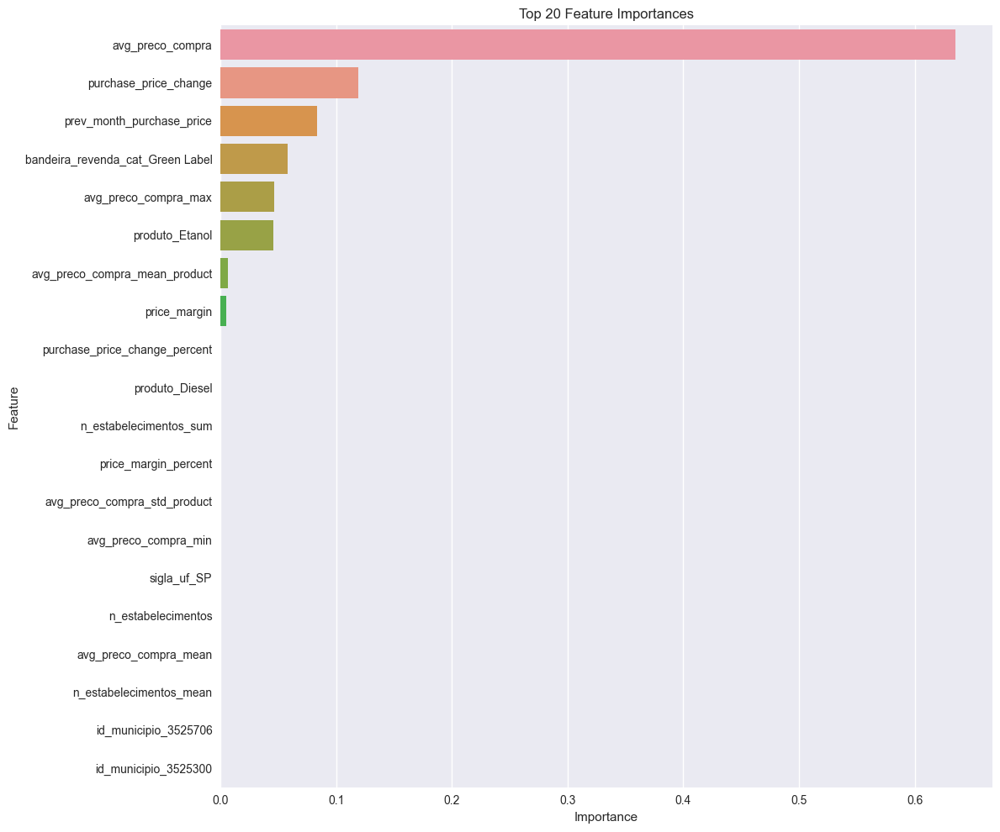


Feature Importance for Estimator 33 (DecisionTreeRegressor):


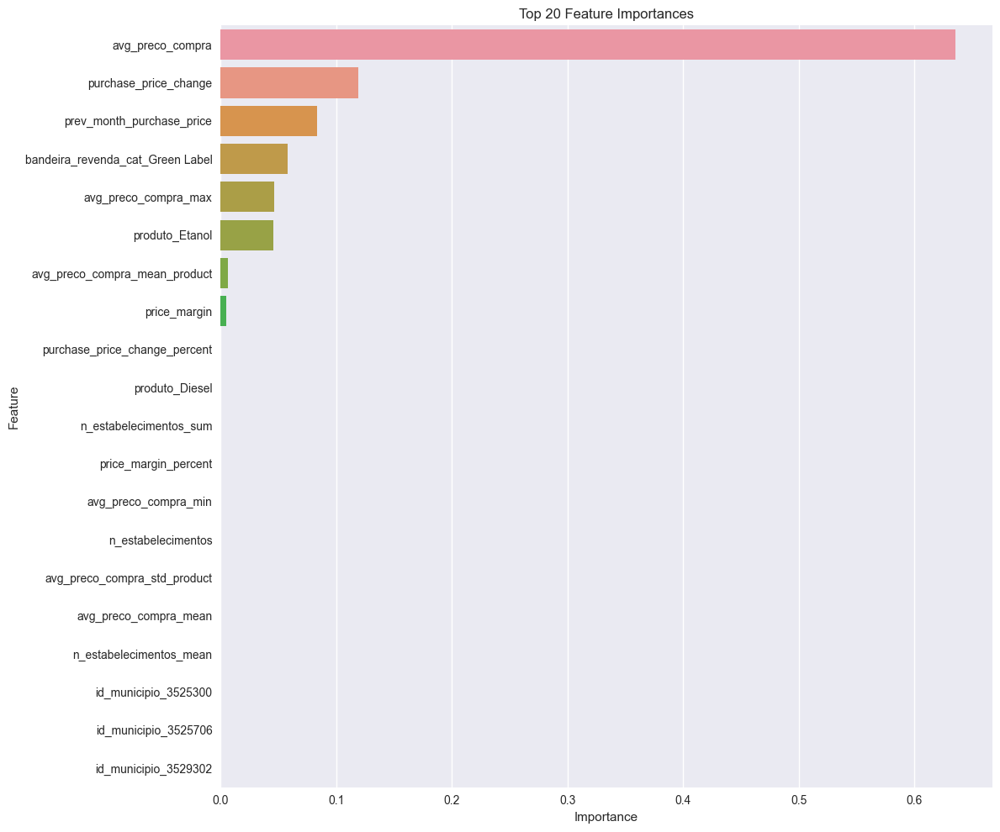


Feature Importance for Estimator 34 (DecisionTreeRegressor):


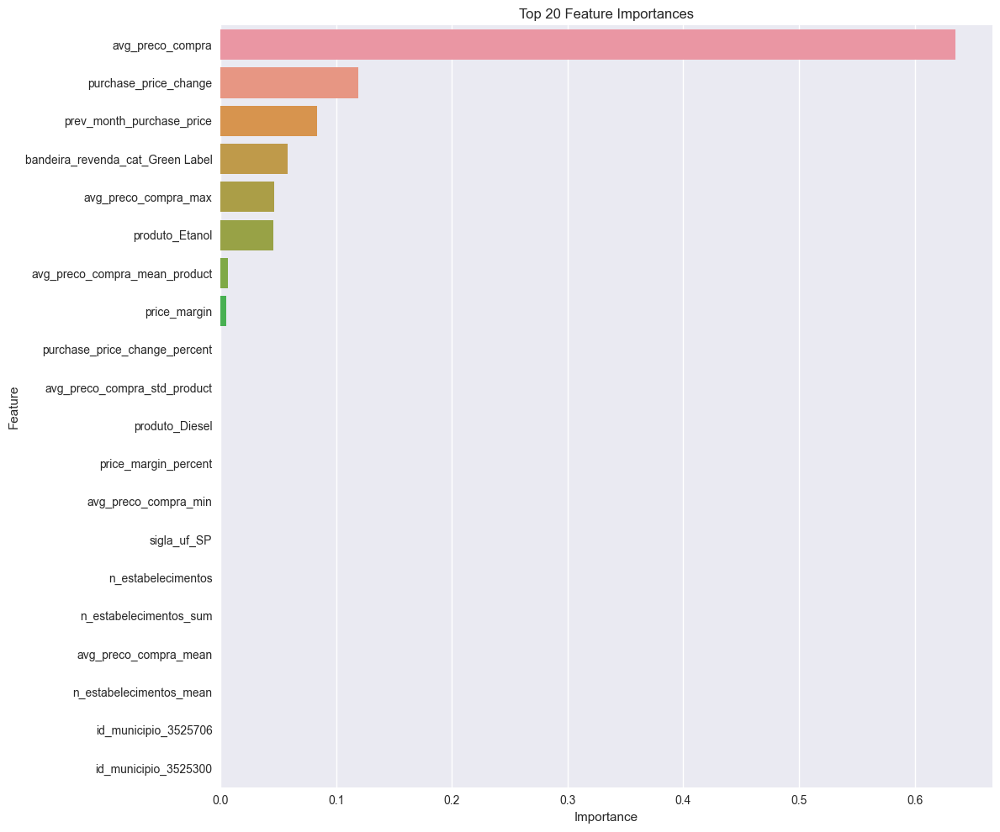


Feature Importance for Estimator 35 (DecisionTreeRegressor):


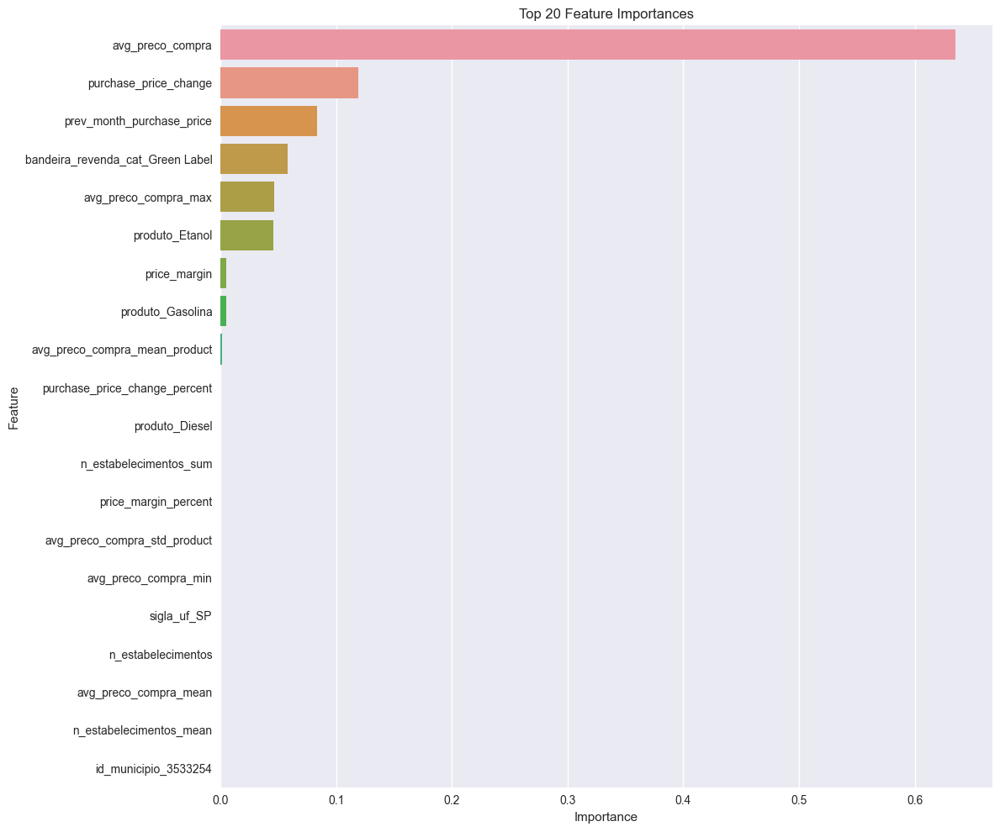


Feature Importance for Estimator 36 (DecisionTreeRegressor):


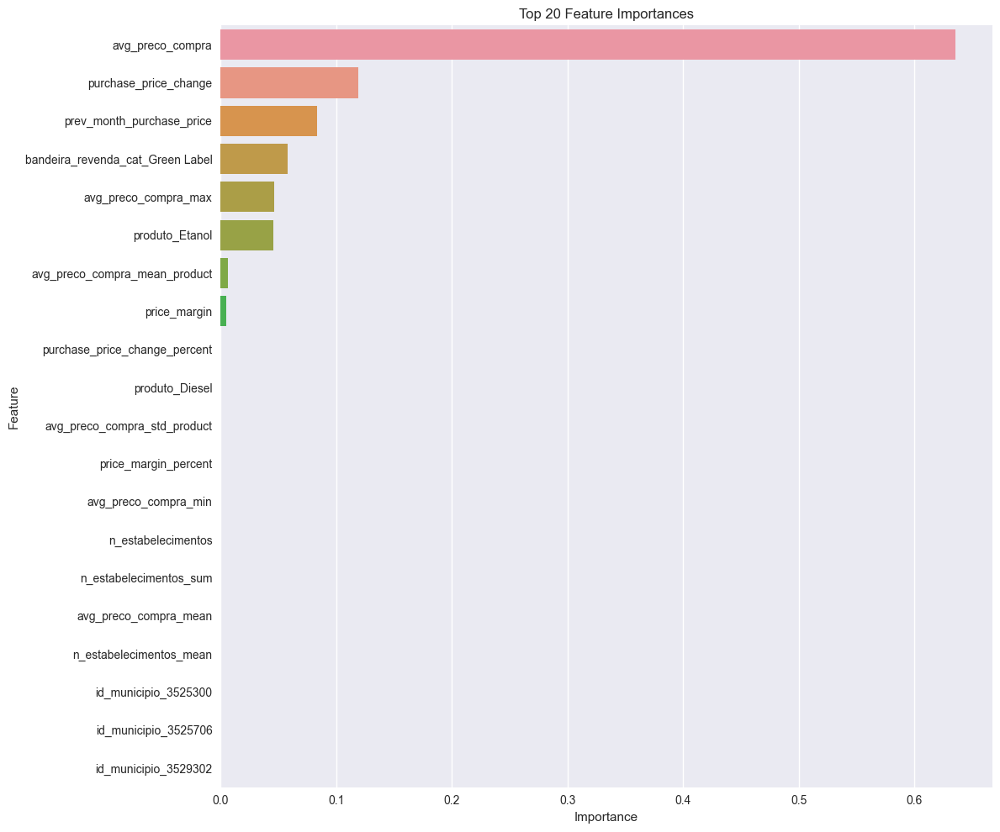


Feature Importance for Estimator 37 (DecisionTreeRegressor):


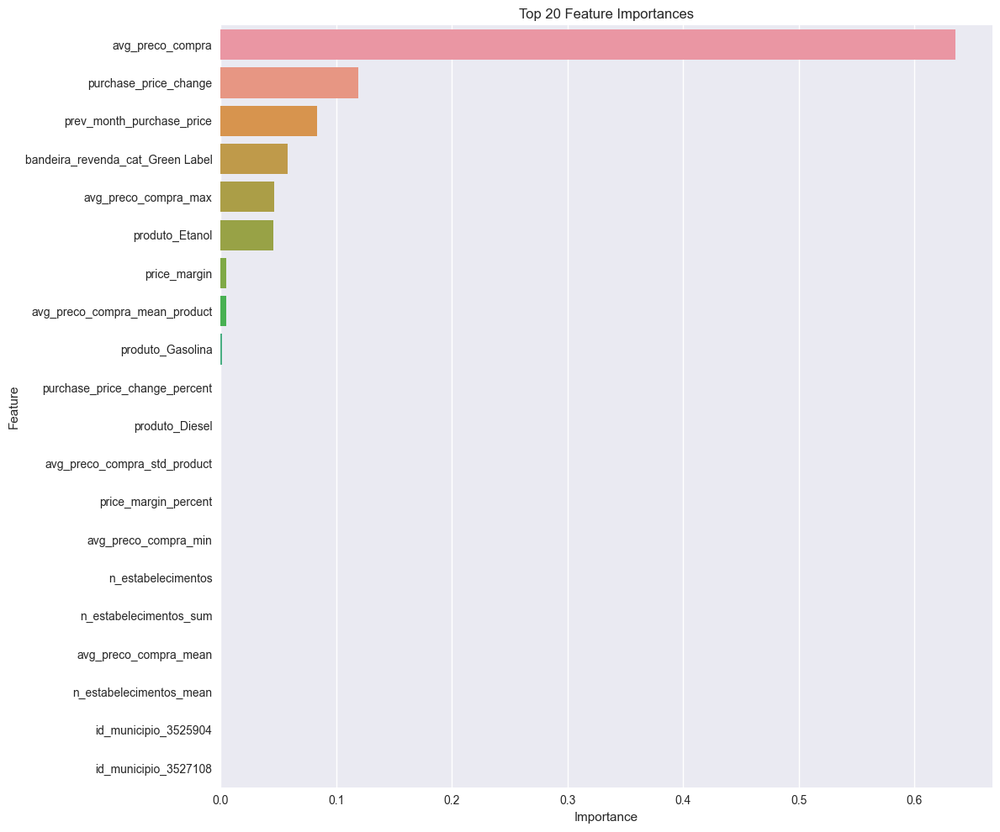


Feature Importance for Estimator 38 (DecisionTreeRegressor):


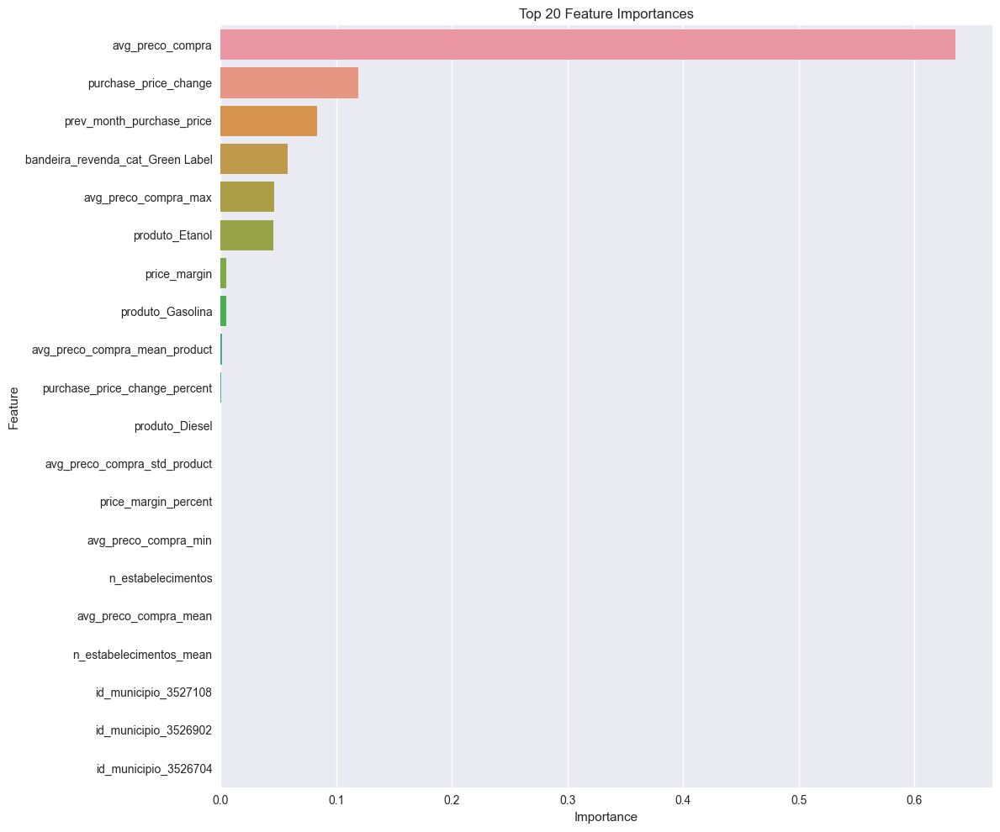


Feature Importance for Estimator 39 (DecisionTreeRegressor):


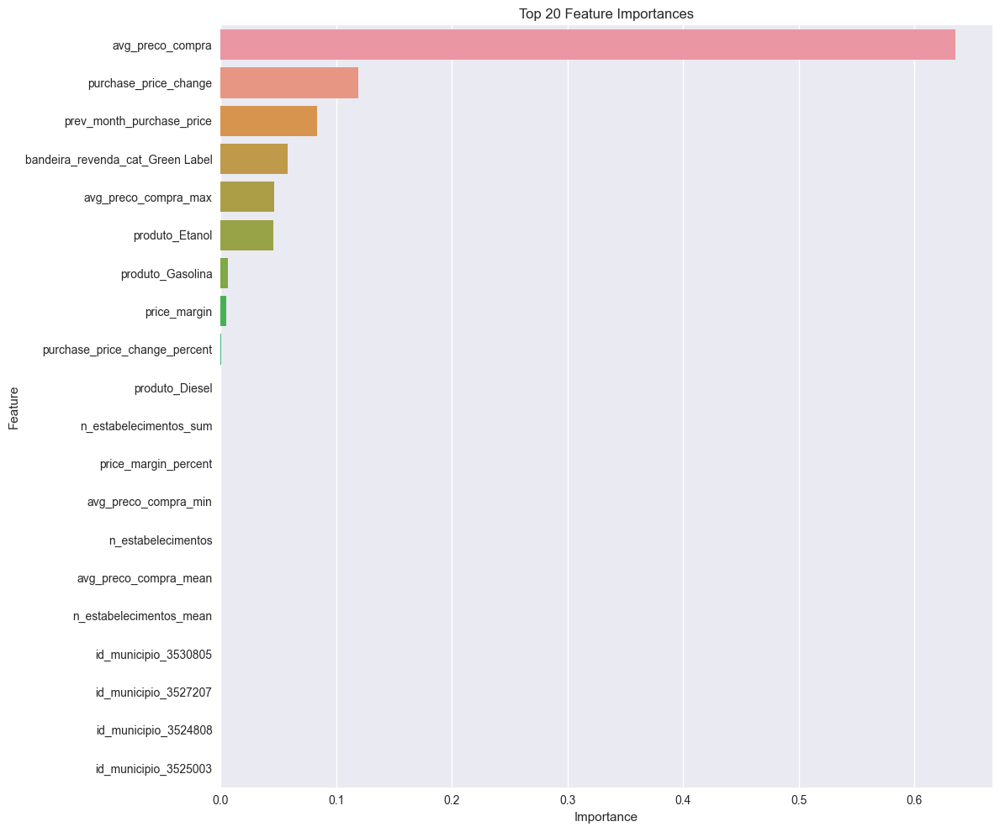


Feature Importance for Estimator 40 (DecisionTreeRegressor):


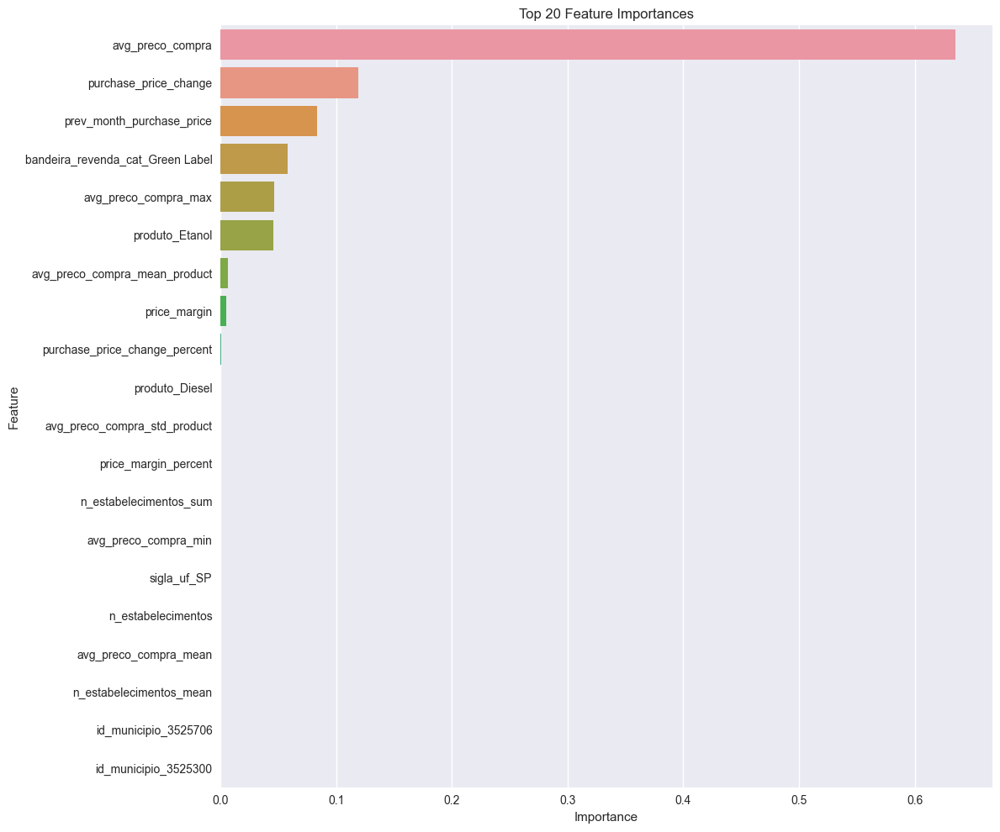


Feature Importance for Estimator 41 (DecisionTreeRegressor):


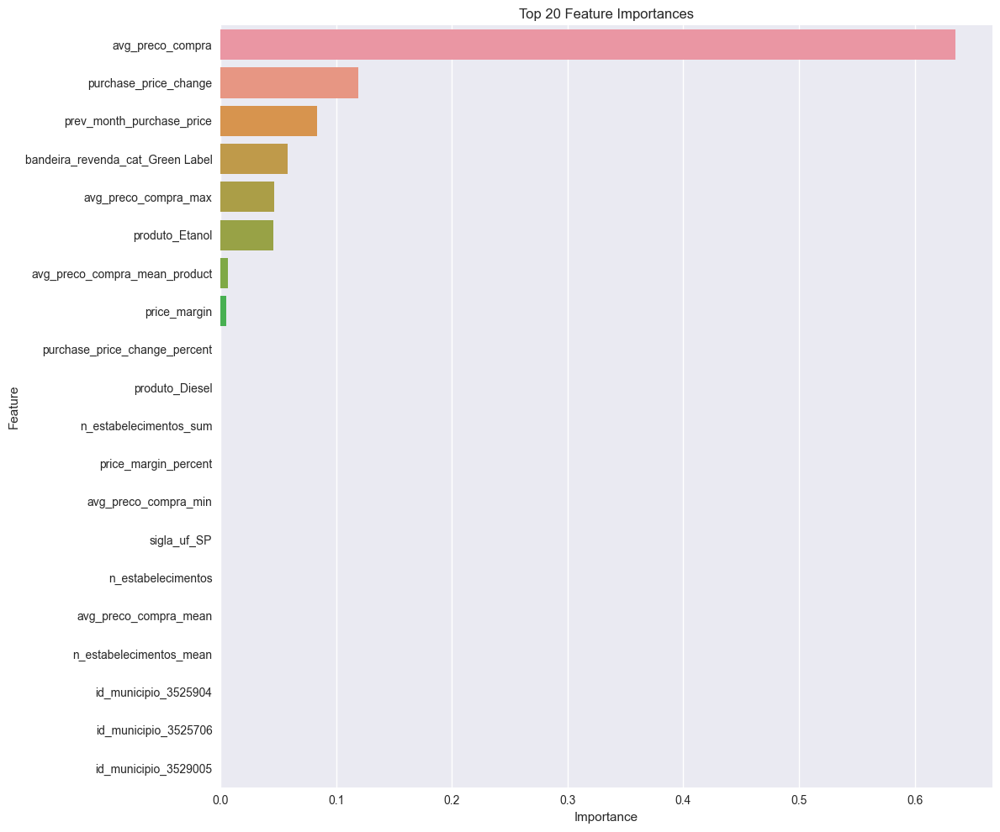


Feature Importance for Estimator 42 (DecisionTreeRegressor):


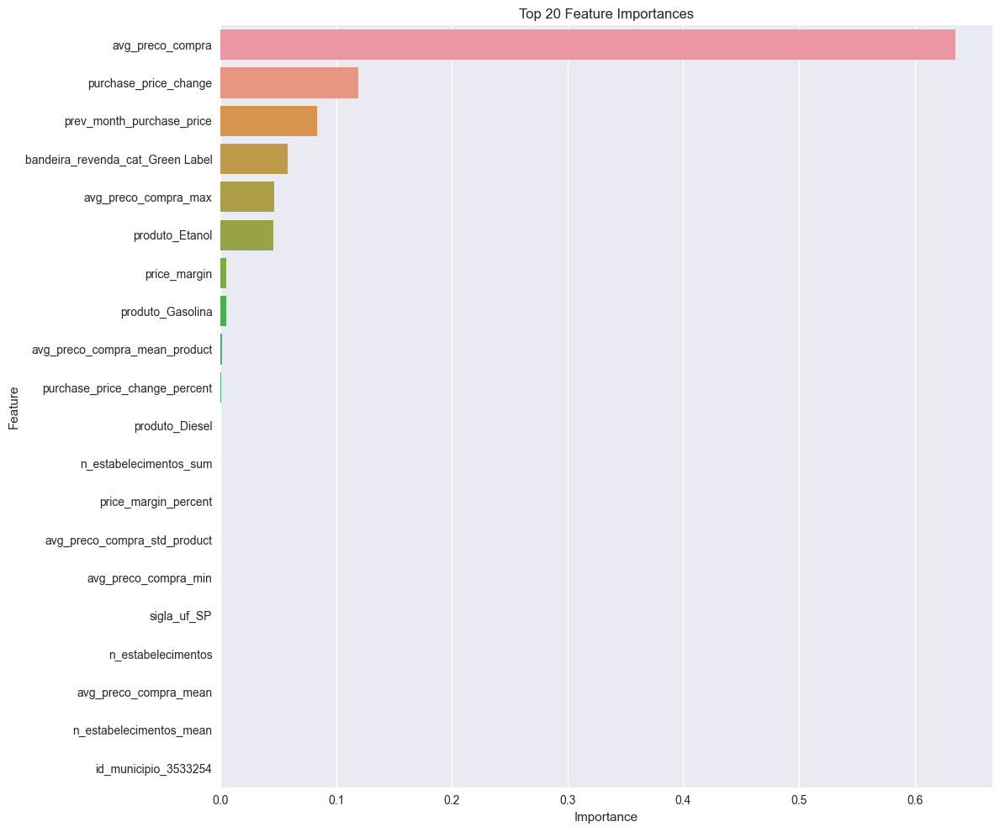


Feature Importance for Estimator 43 (DecisionTreeRegressor):


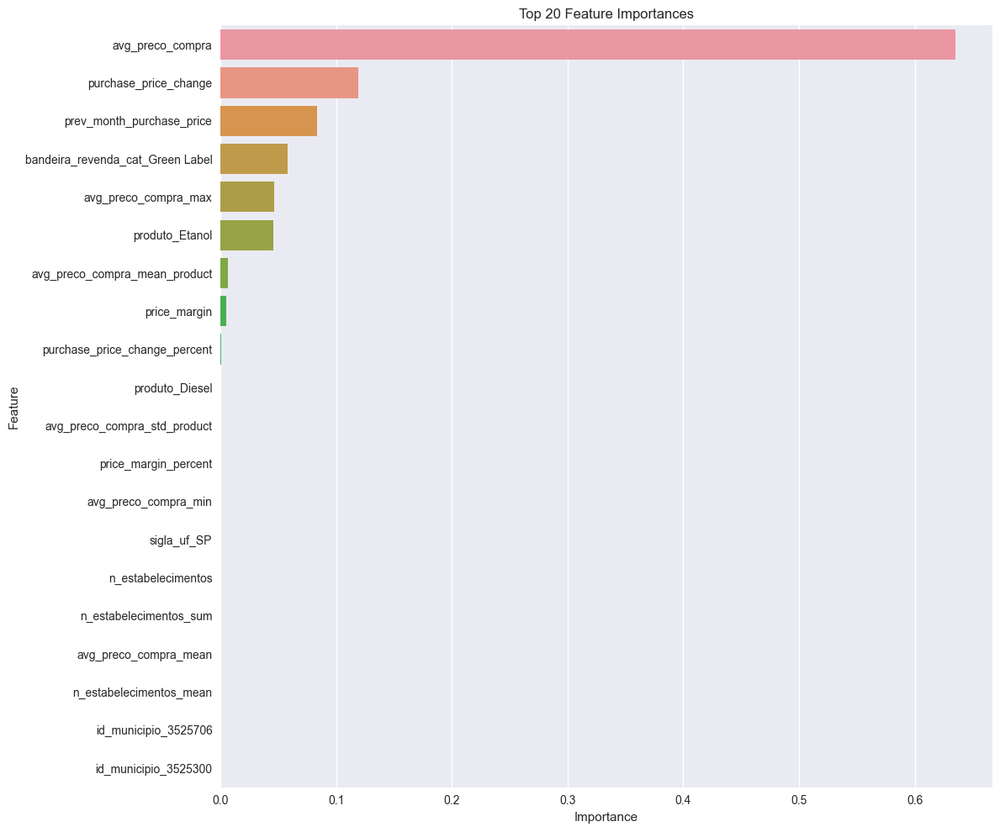


Feature Importance for Estimator 44 (DecisionTreeRegressor):


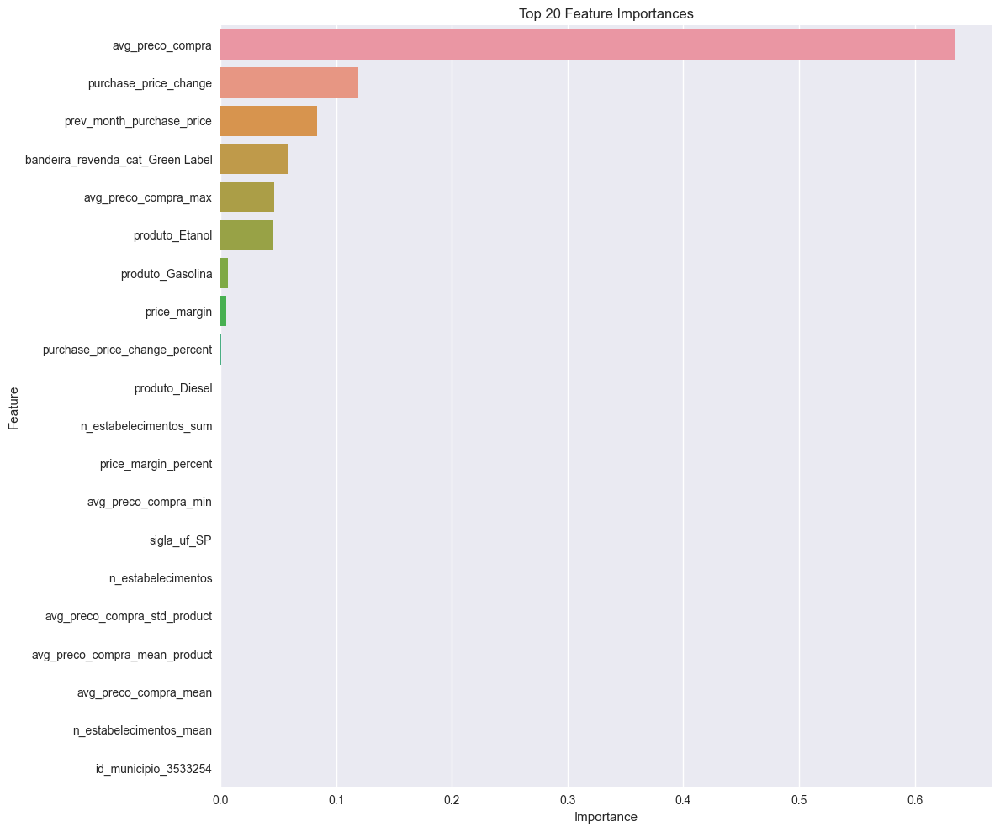


Feature Importance for Estimator 45 (DecisionTreeRegressor):


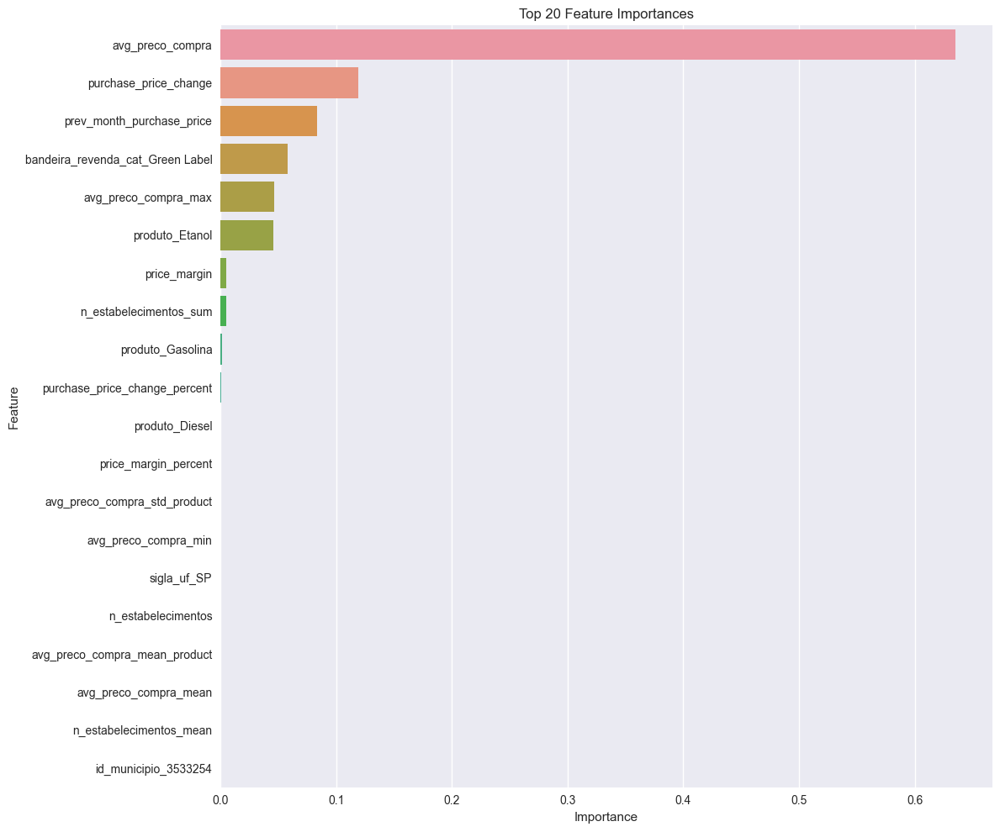


Feature Importance for Estimator 46 (DecisionTreeRegressor):


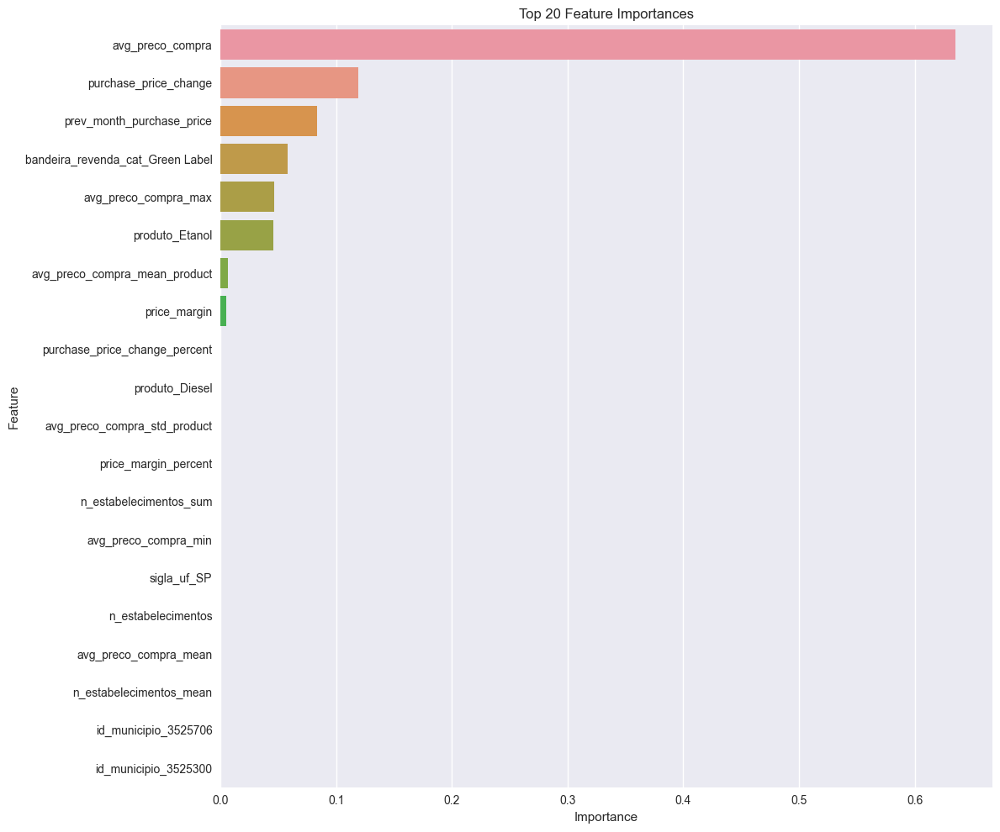


Feature Importance for Estimator 47 (DecisionTreeRegressor):


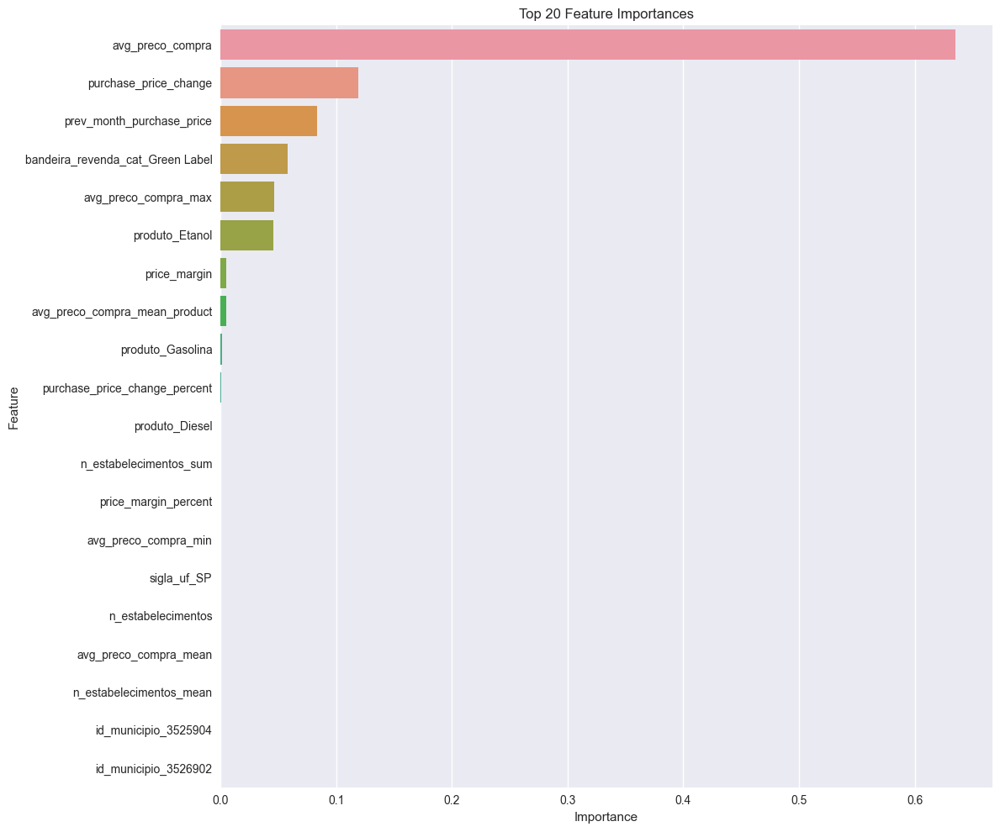


Feature Importance for Estimator 48 (DecisionTreeRegressor):


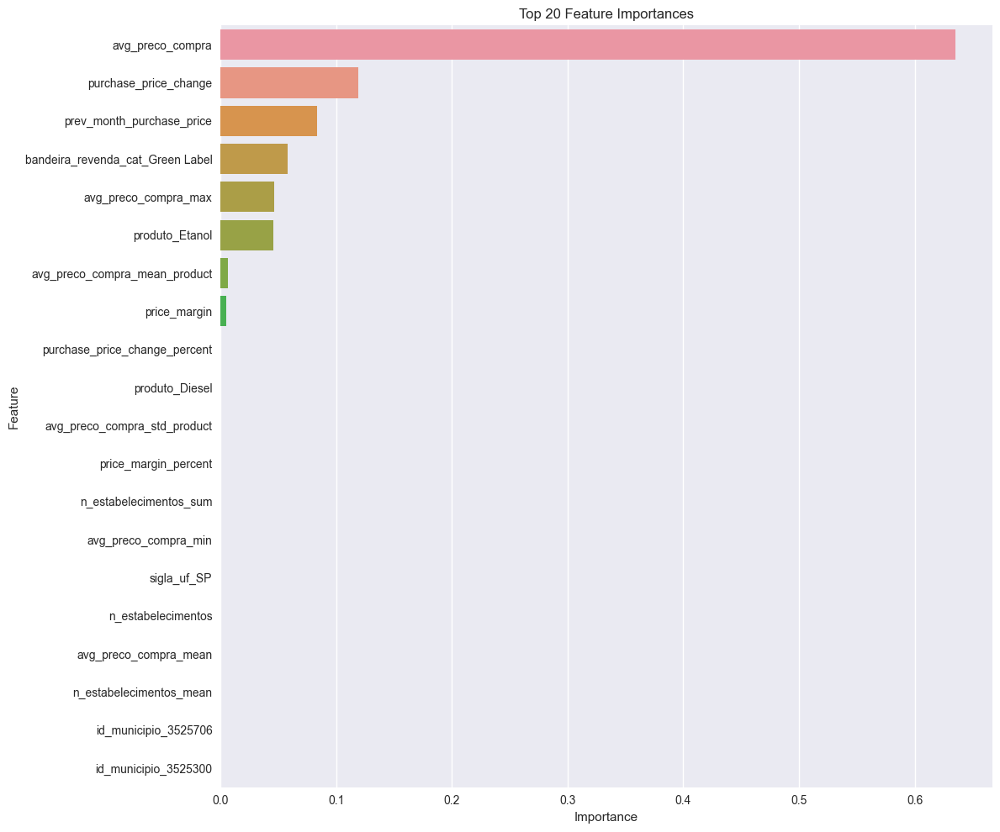


Feature Importance for Estimator 49 (DecisionTreeRegressor):


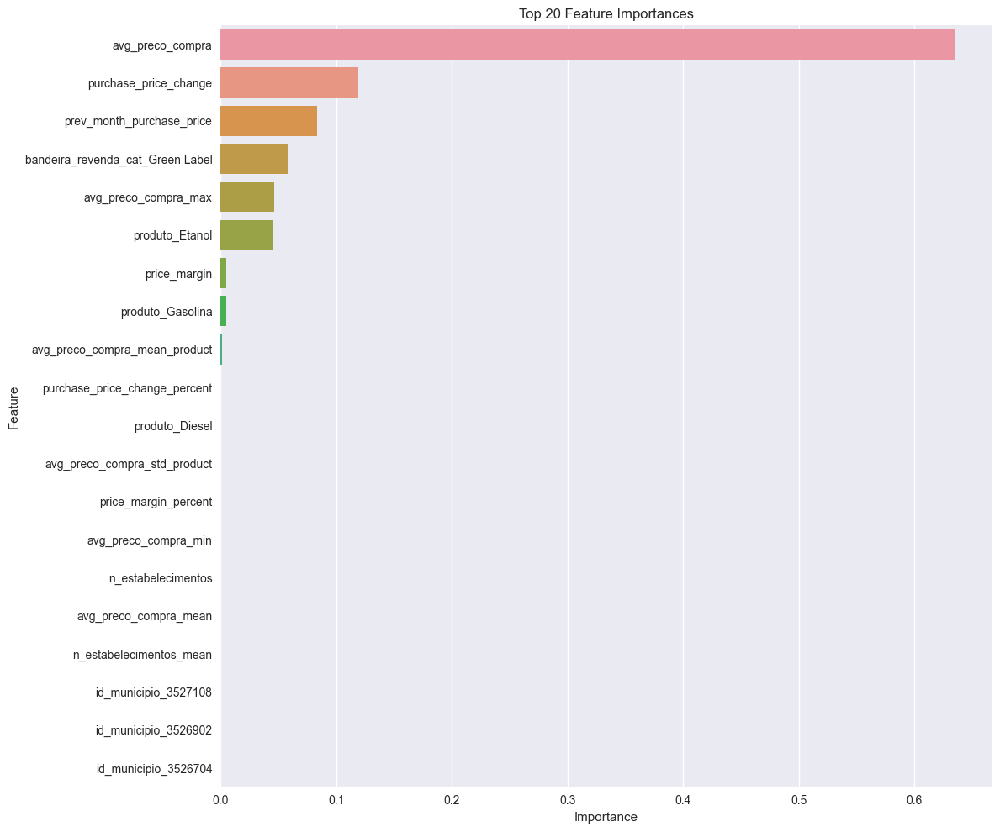


Feature Importance for Estimator 50 (DecisionTreeRegressor):


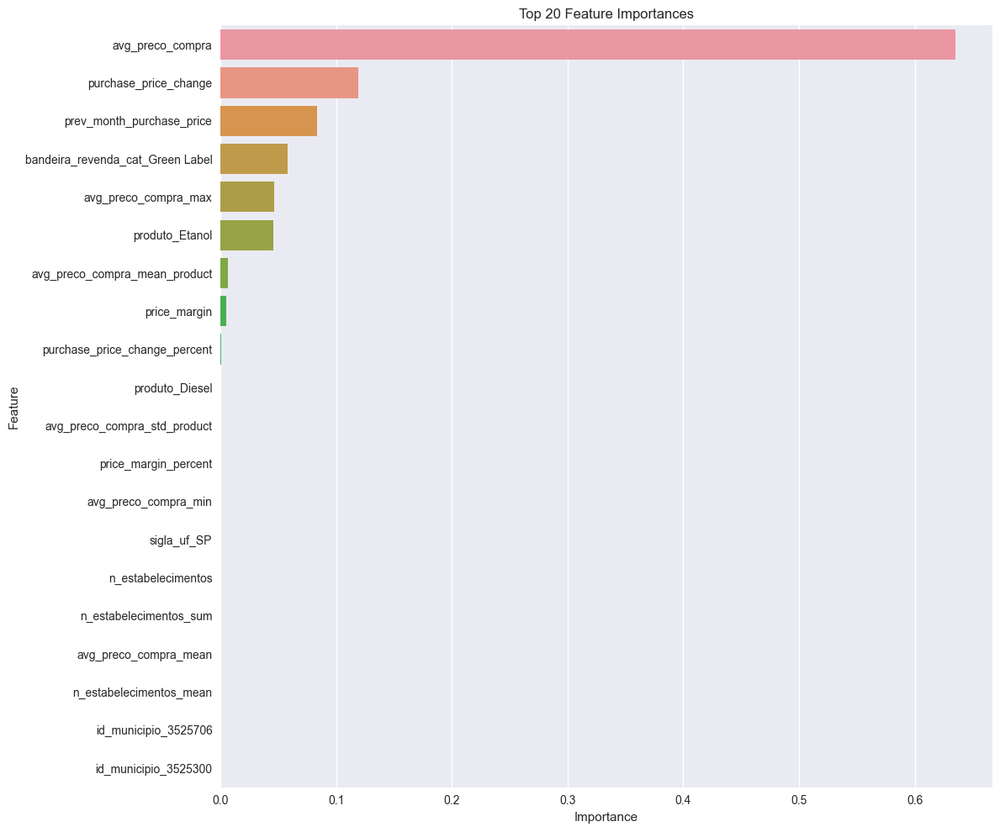


Feature Importance for Estimator 51 (DecisionTreeRegressor):


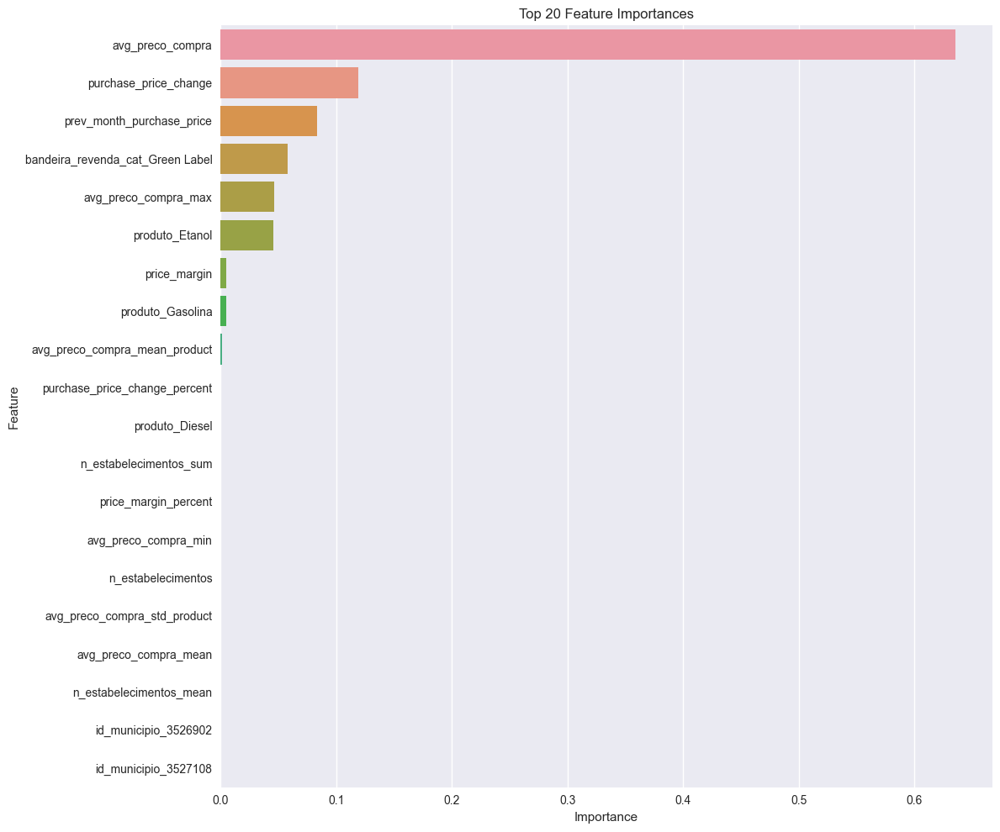


Feature Importance for Estimator 52 (DecisionTreeRegressor):


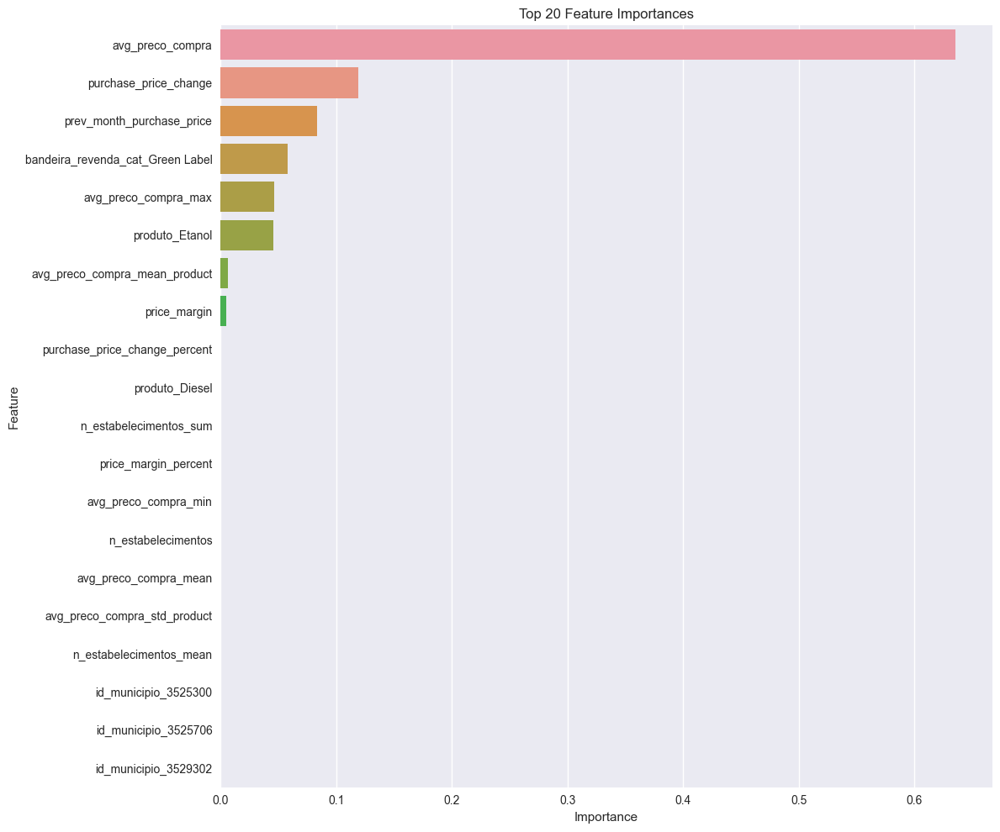


Feature Importance for Estimator 53 (DecisionTreeRegressor):


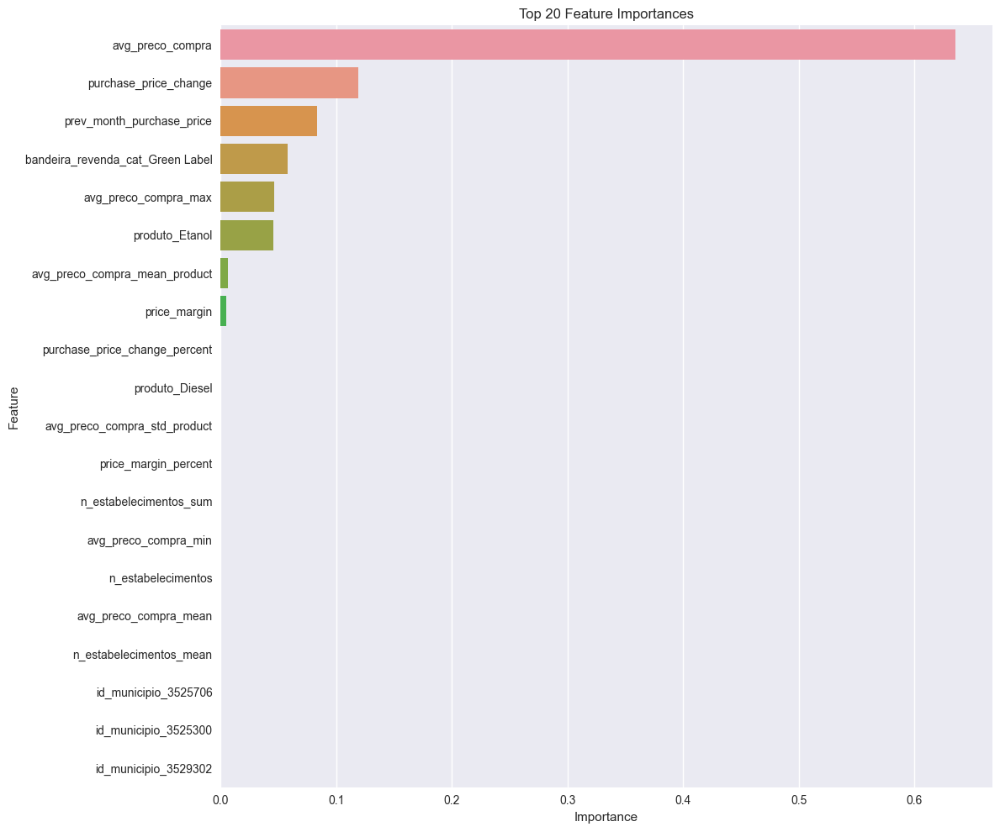


Feature Importance for Estimator 54 (DecisionTreeRegressor):


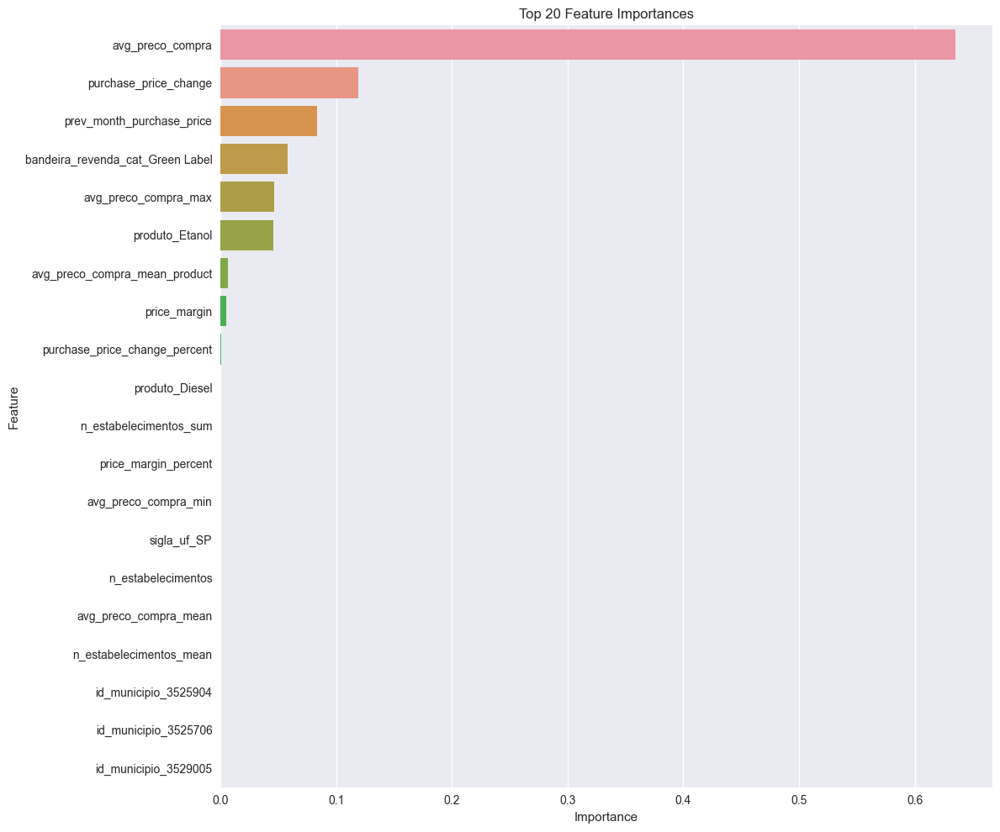


Feature Importance for Estimator 55 (DecisionTreeRegressor):


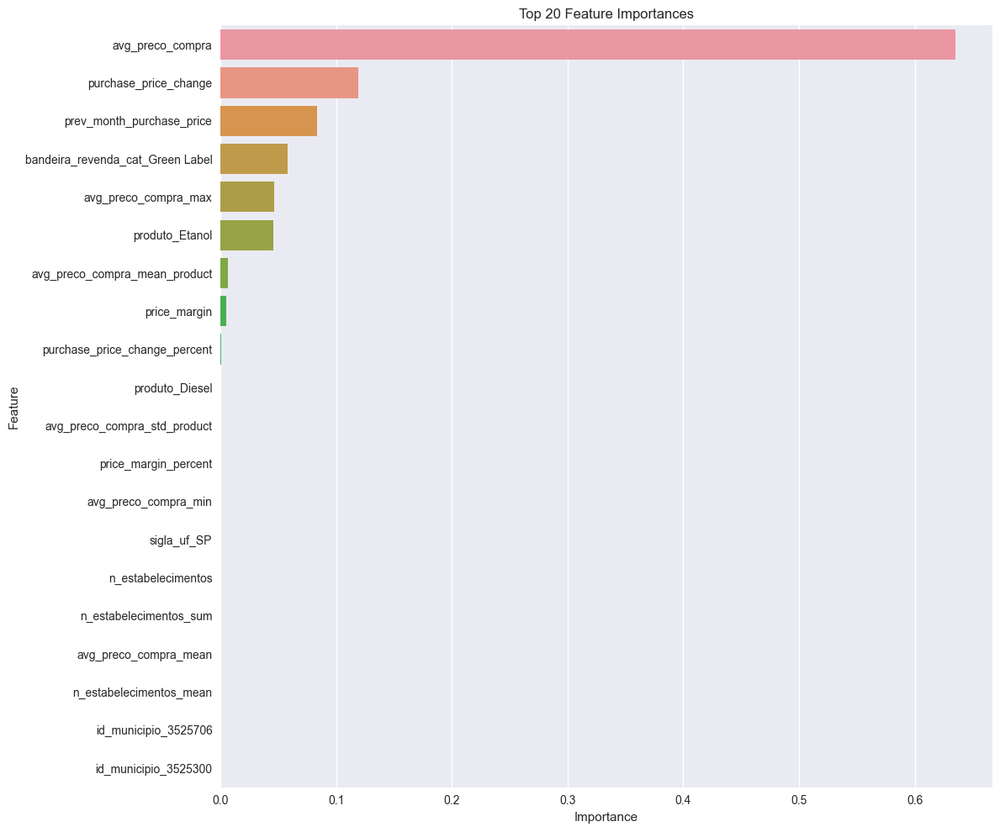


Feature Importance for Estimator 56 (DecisionTreeRegressor):


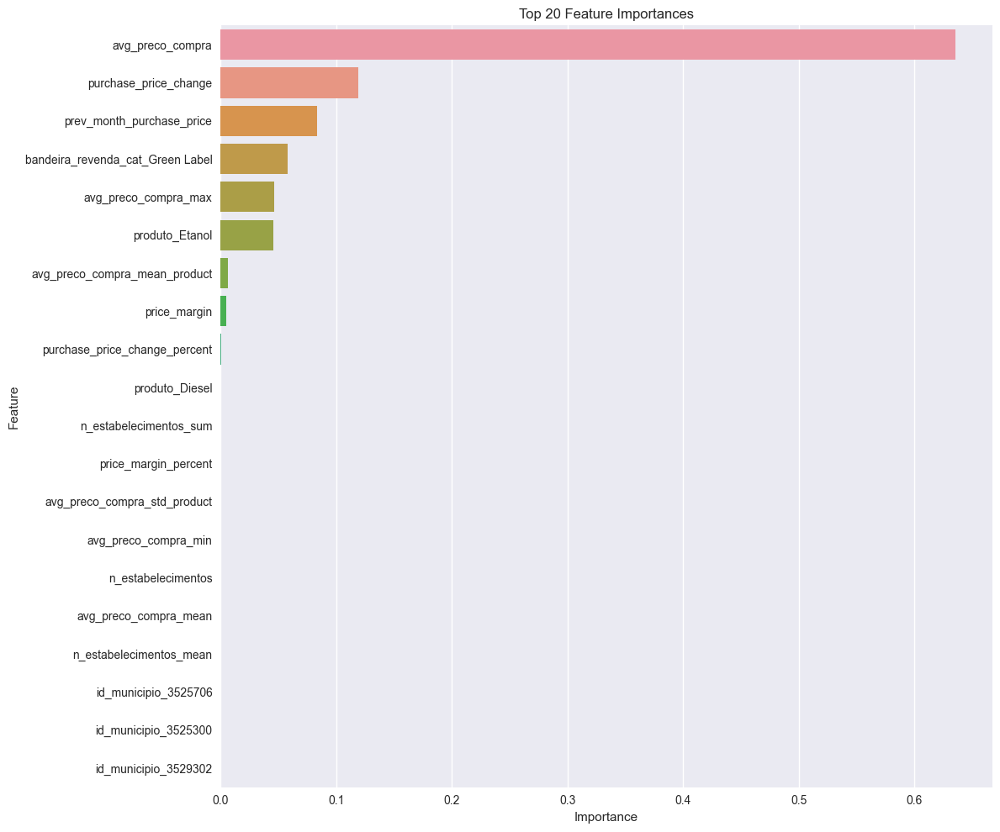


Feature Importance for Estimator 57 (DecisionTreeRegressor):


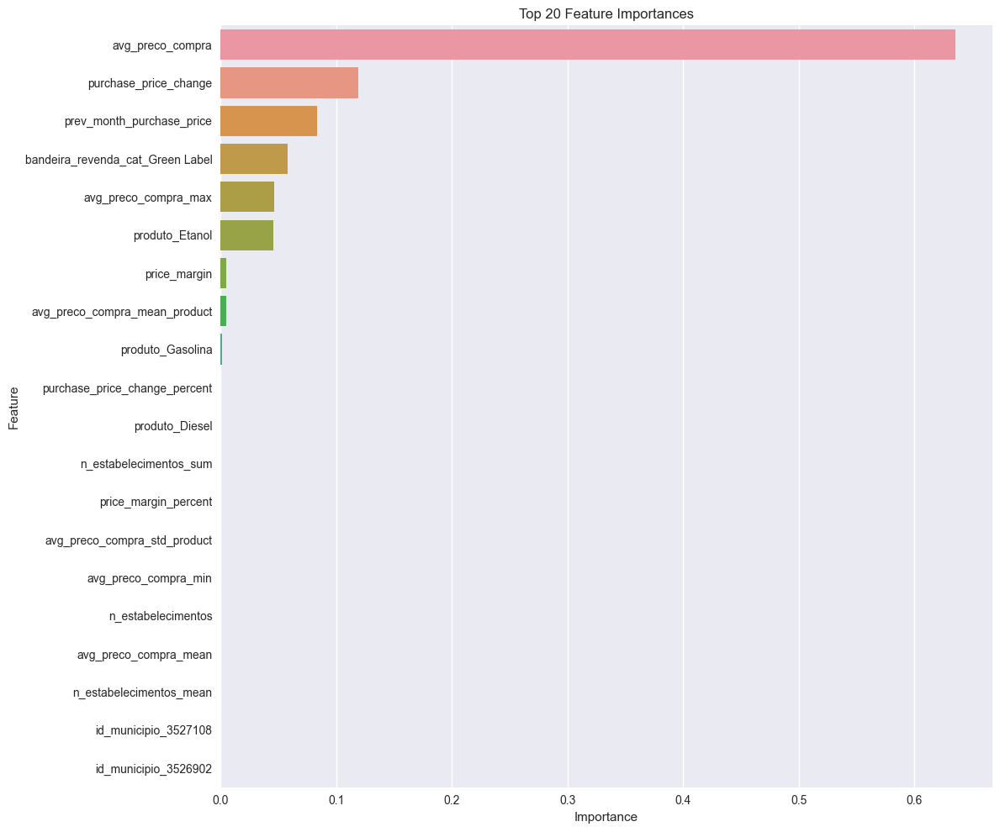


Feature Importance for Estimator 58 (DecisionTreeRegressor):


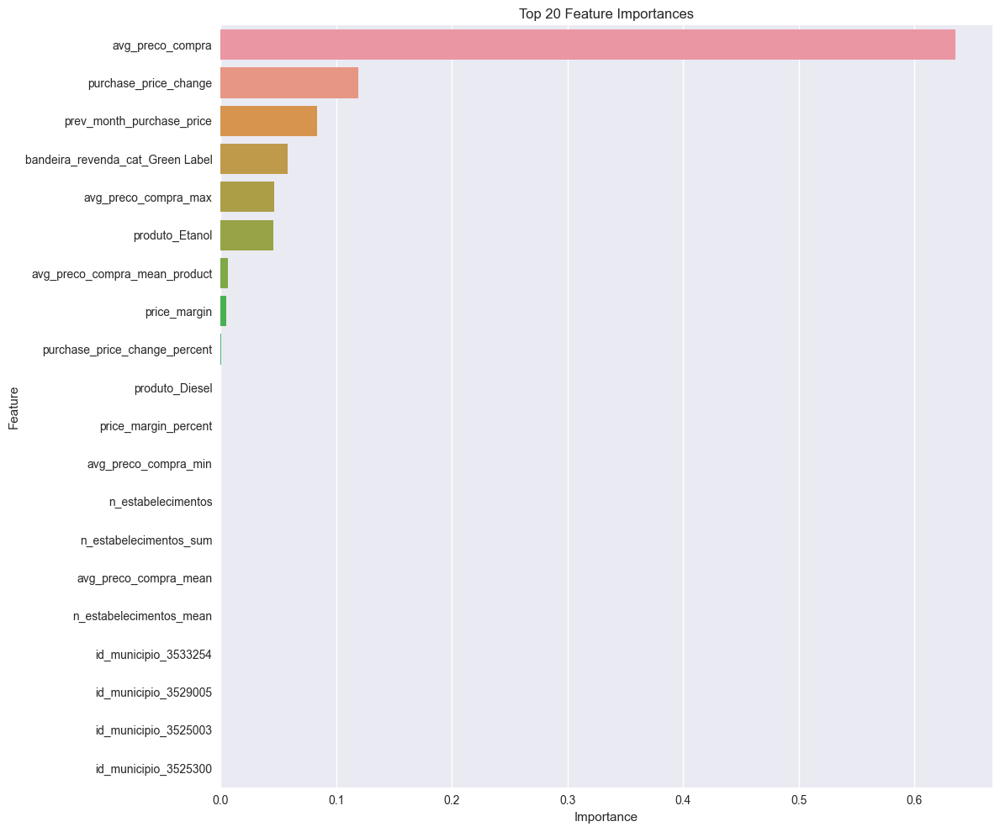


Feature Importance for Estimator 59 (DecisionTreeRegressor):


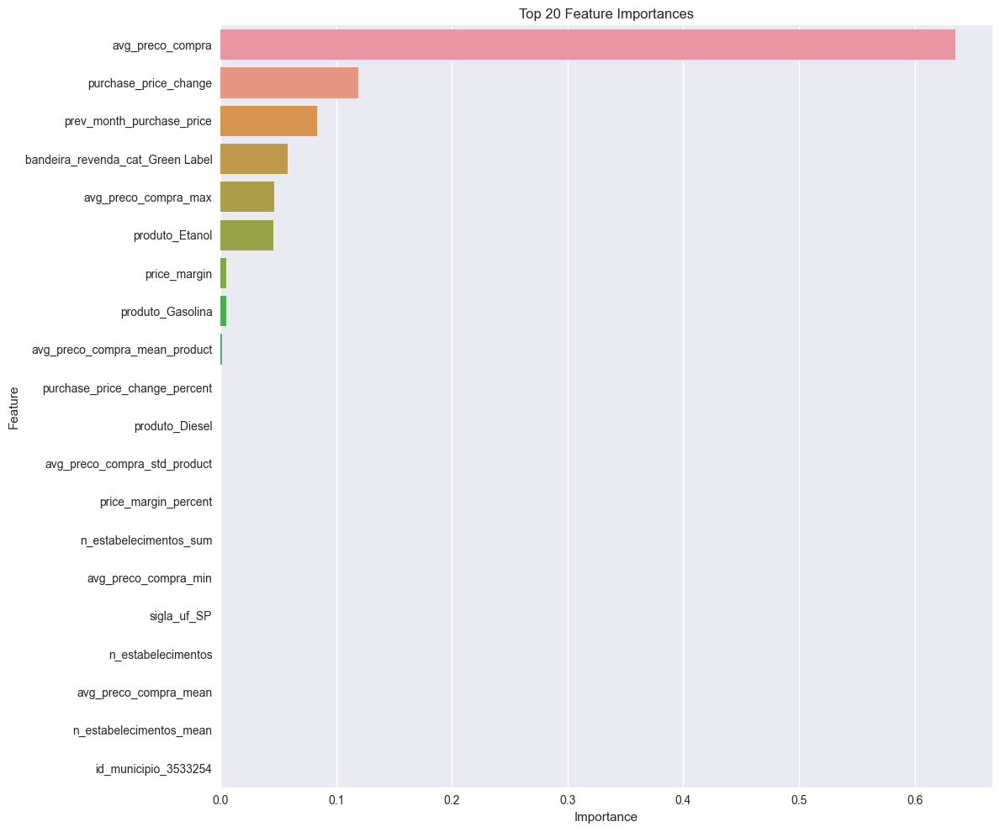


Feature Importance for Estimator 60 (DecisionTreeRegressor):


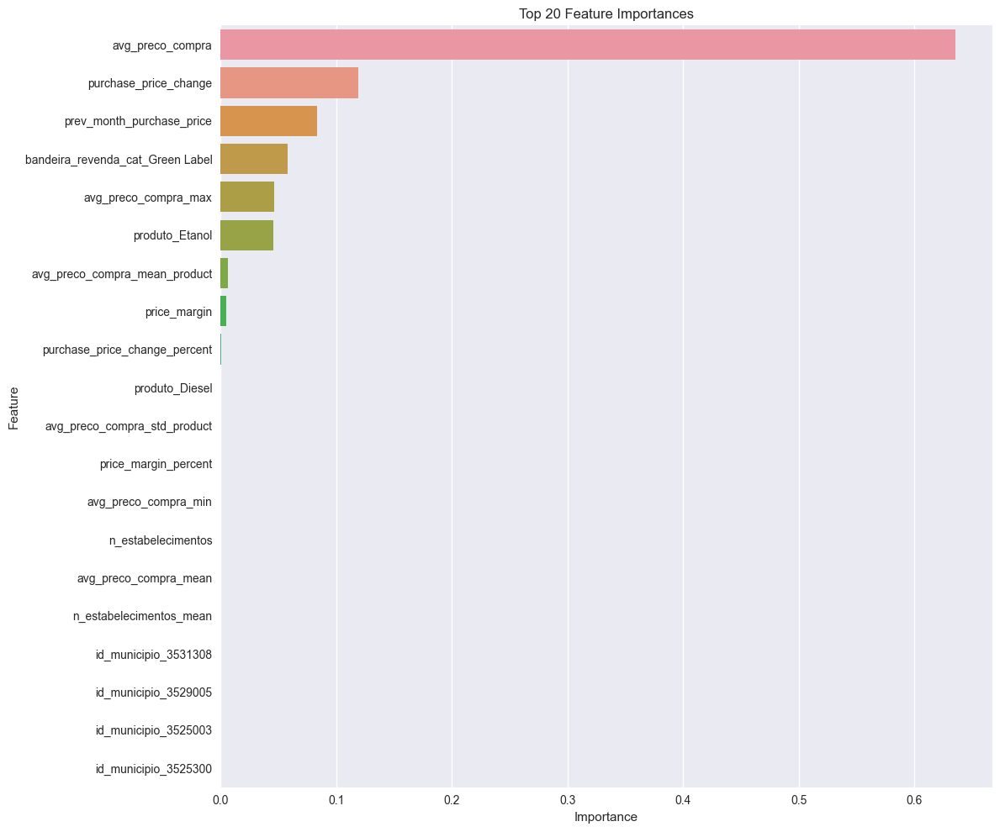


Feature Importance for Estimator 61 (DecisionTreeRegressor):


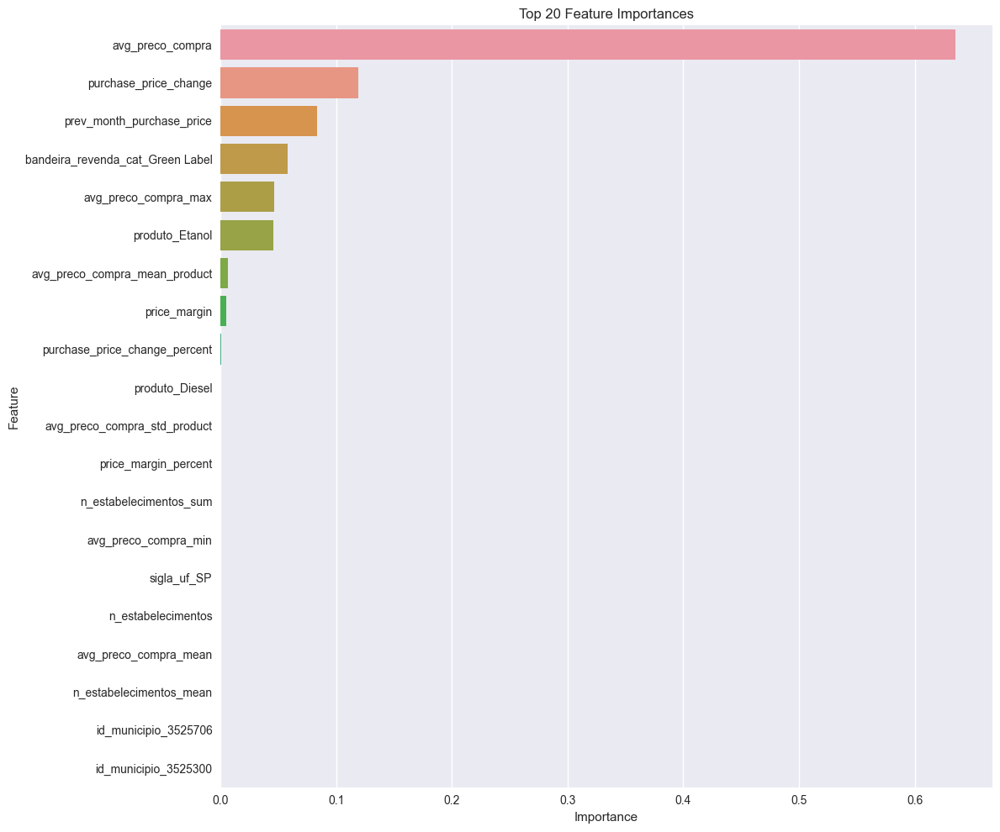


Feature Importance for Estimator 62 (DecisionTreeRegressor):


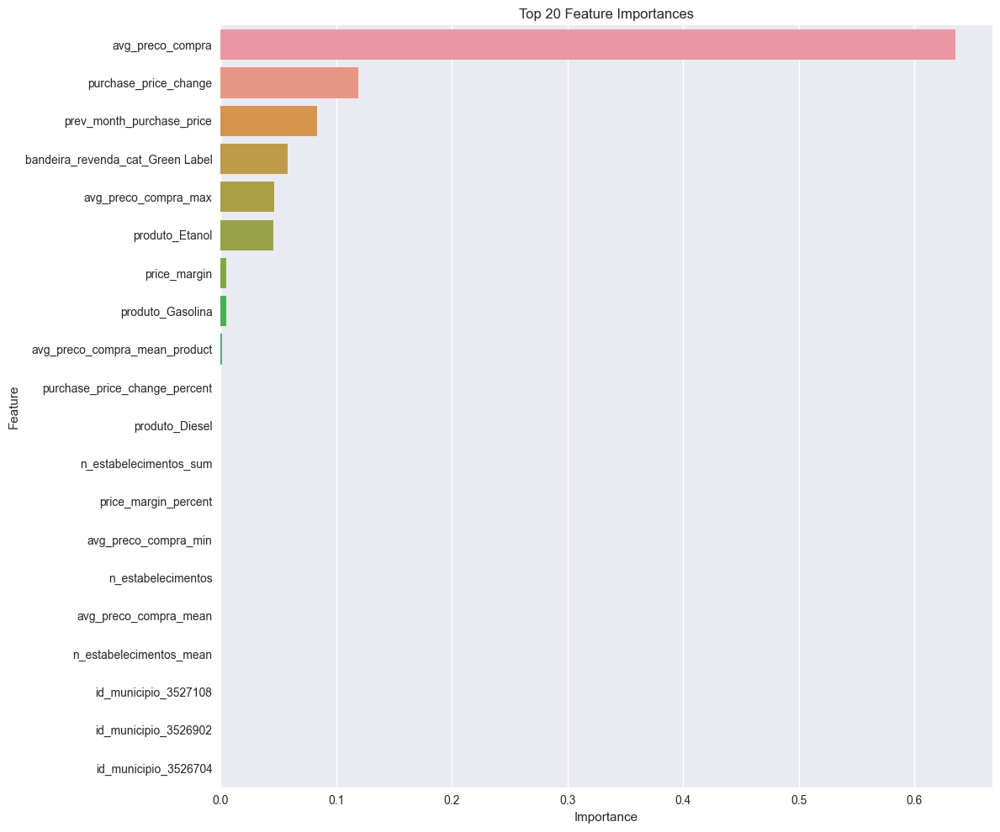


Feature Importance for Estimator 63 (DecisionTreeRegressor):


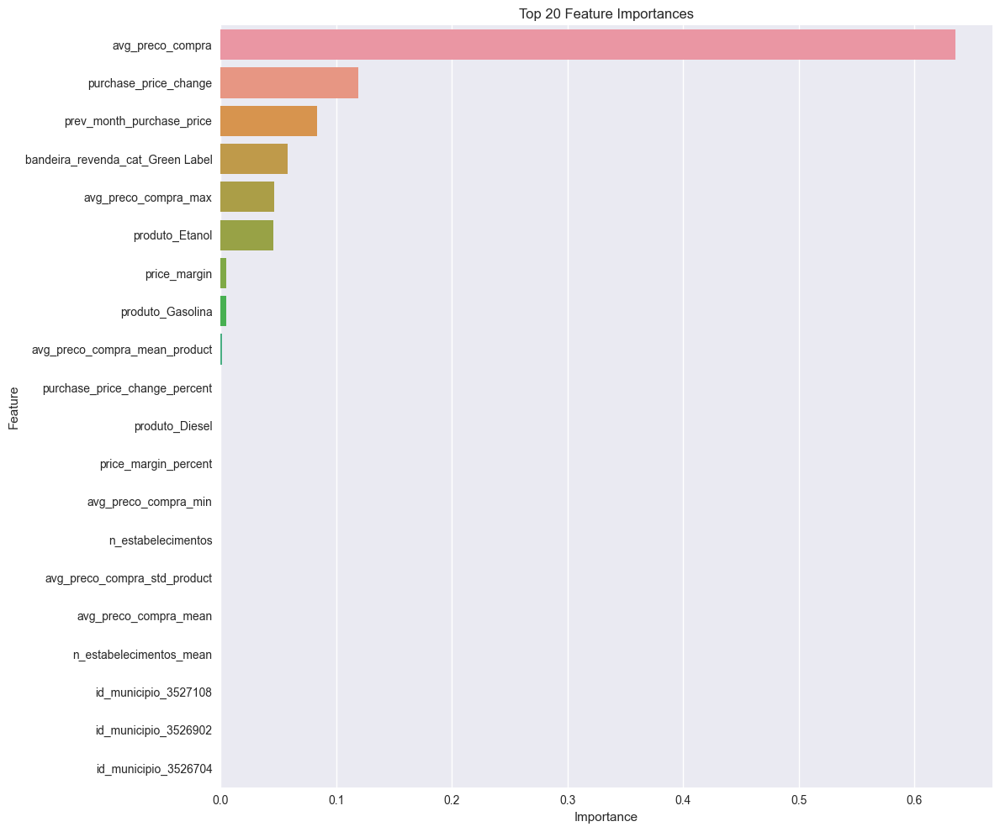


Feature Importance for Estimator 64 (DecisionTreeRegressor):


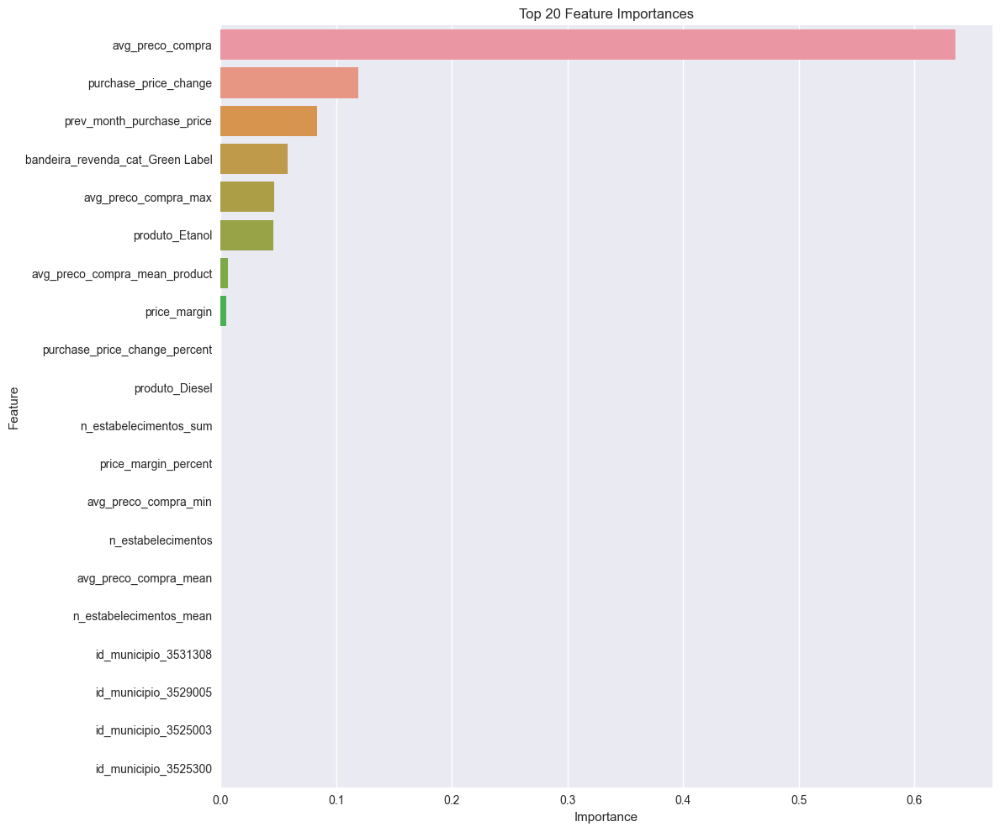


Feature Importance for Estimator 65 (DecisionTreeRegressor):


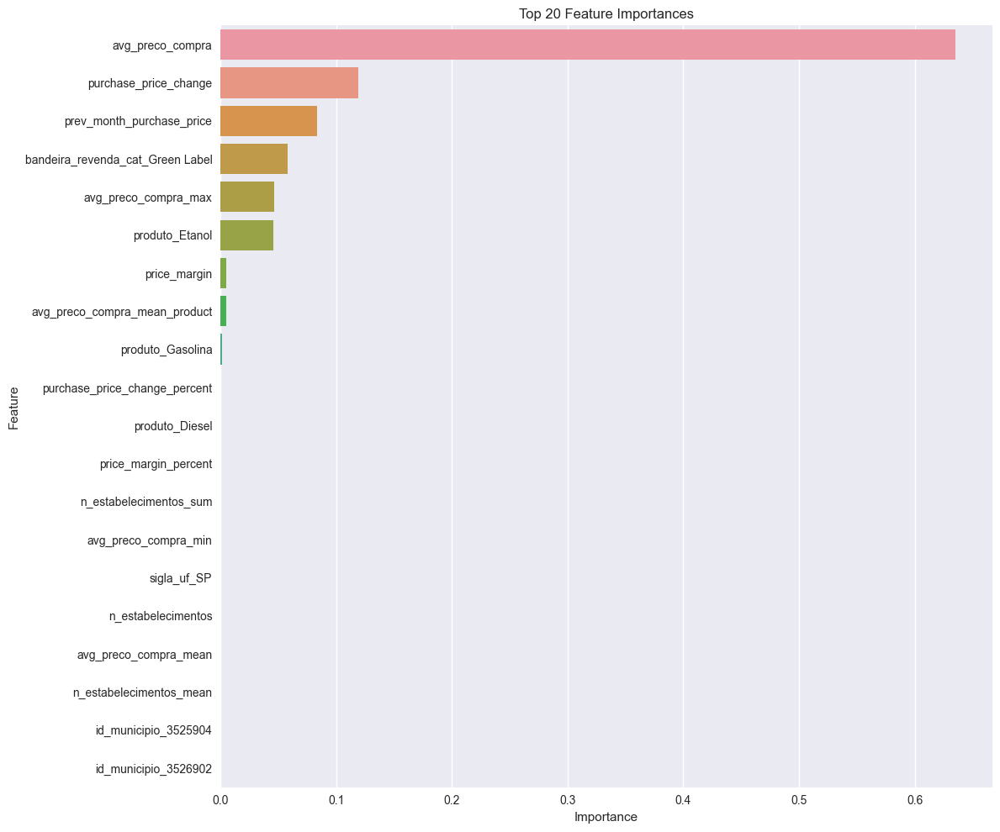


Feature Importance for Estimator 66 (DecisionTreeRegressor):


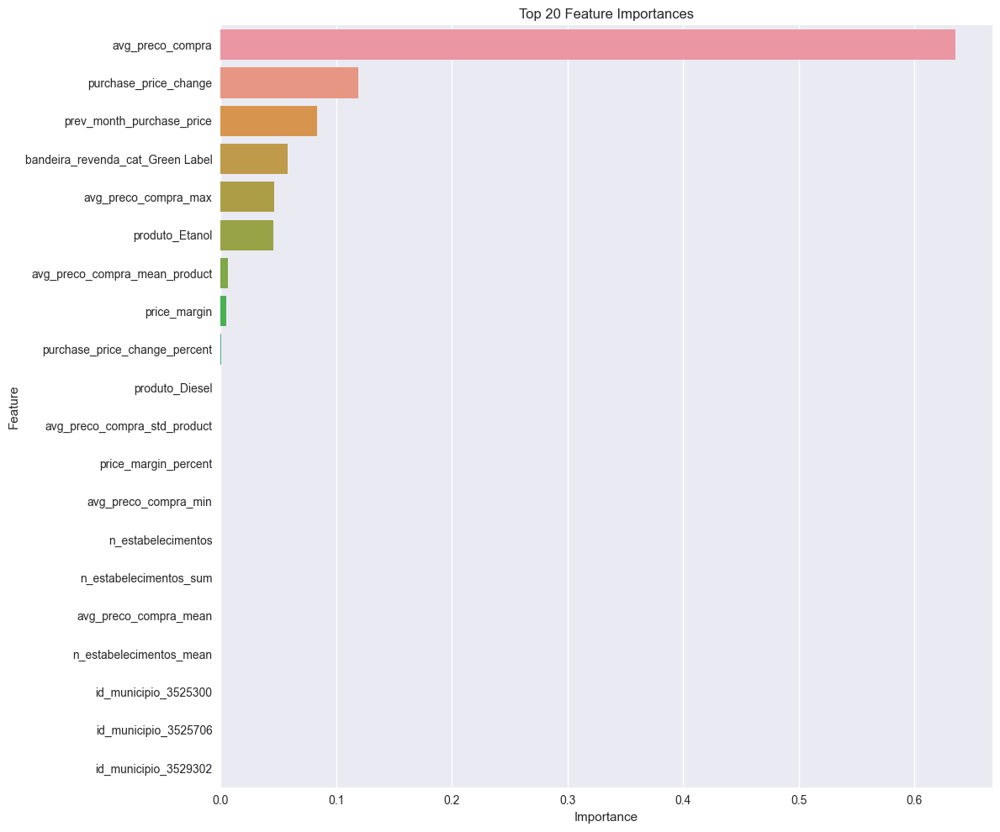


Feature Importance for Estimator 67 (DecisionTreeRegressor):


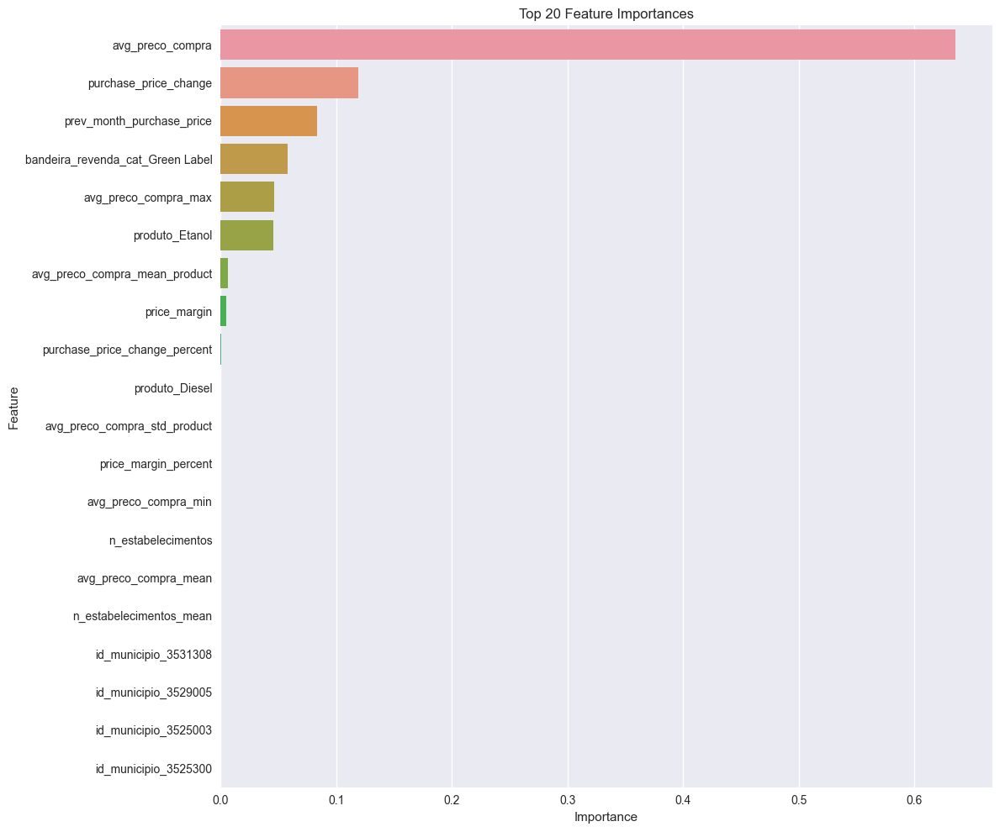


Feature Importance for Estimator 68 (DecisionTreeRegressor):


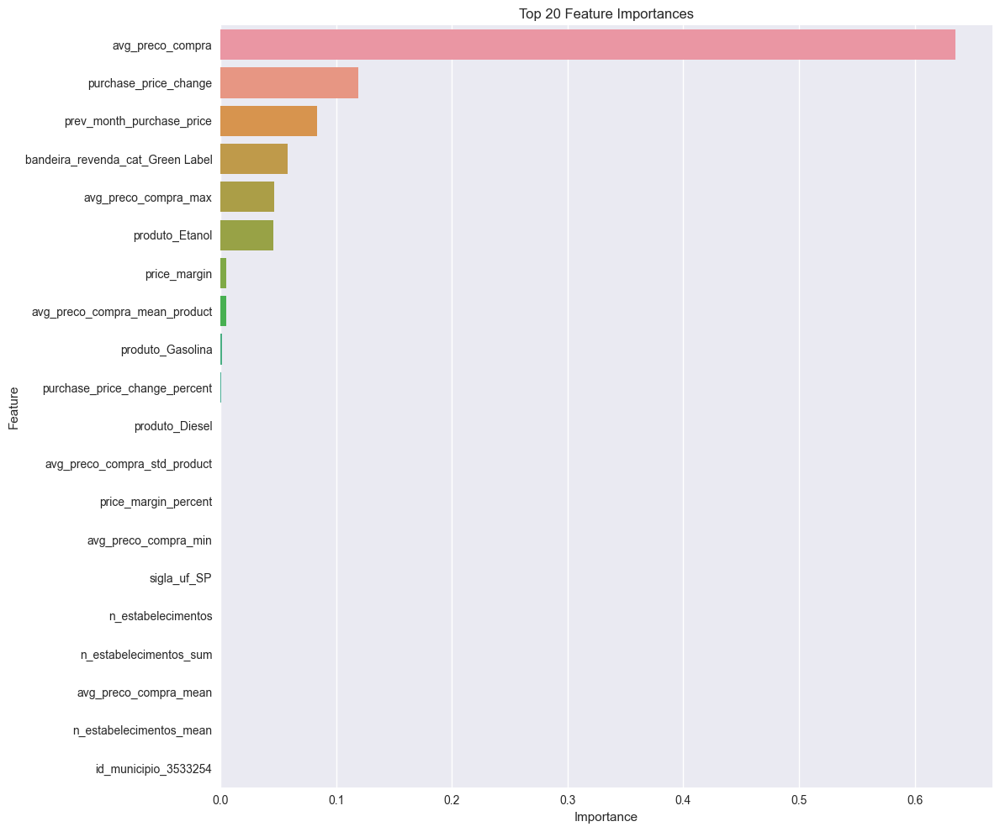


Feature Importance for Estimator 69 (DecisionTreeRegressor):


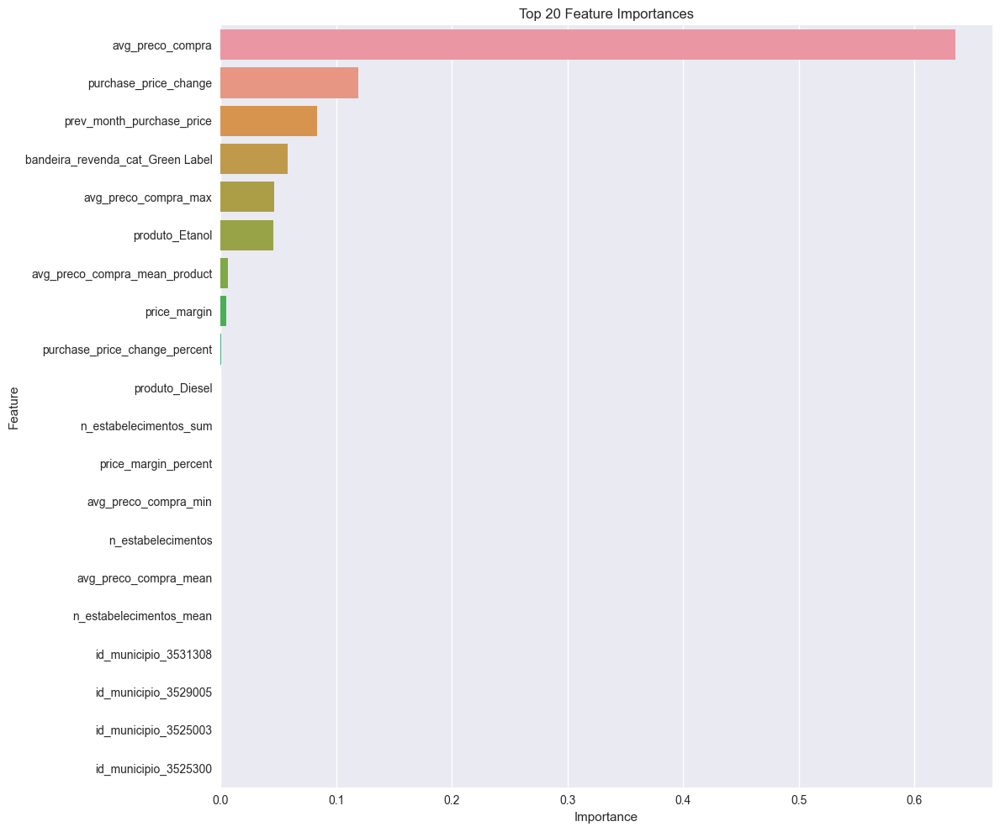


Feature Importance for Estimator 70 (DecisionTreeRegressor):


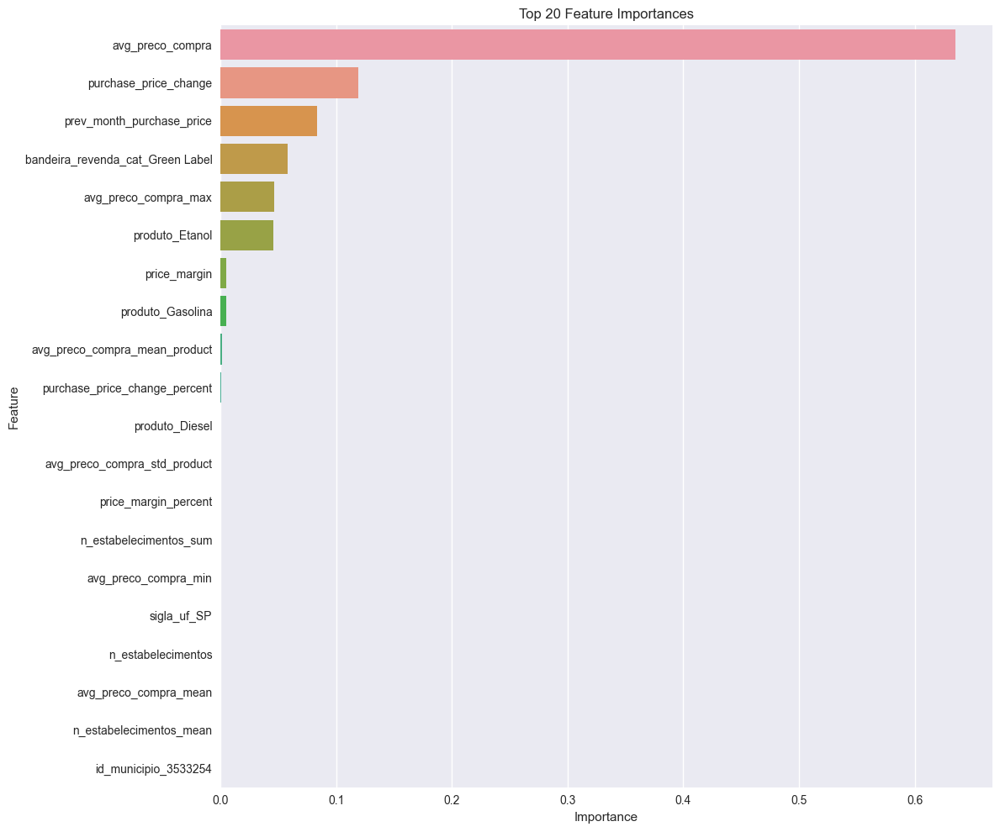


Feature Importance for Estimator 71 (DecisionTreeRegressor):


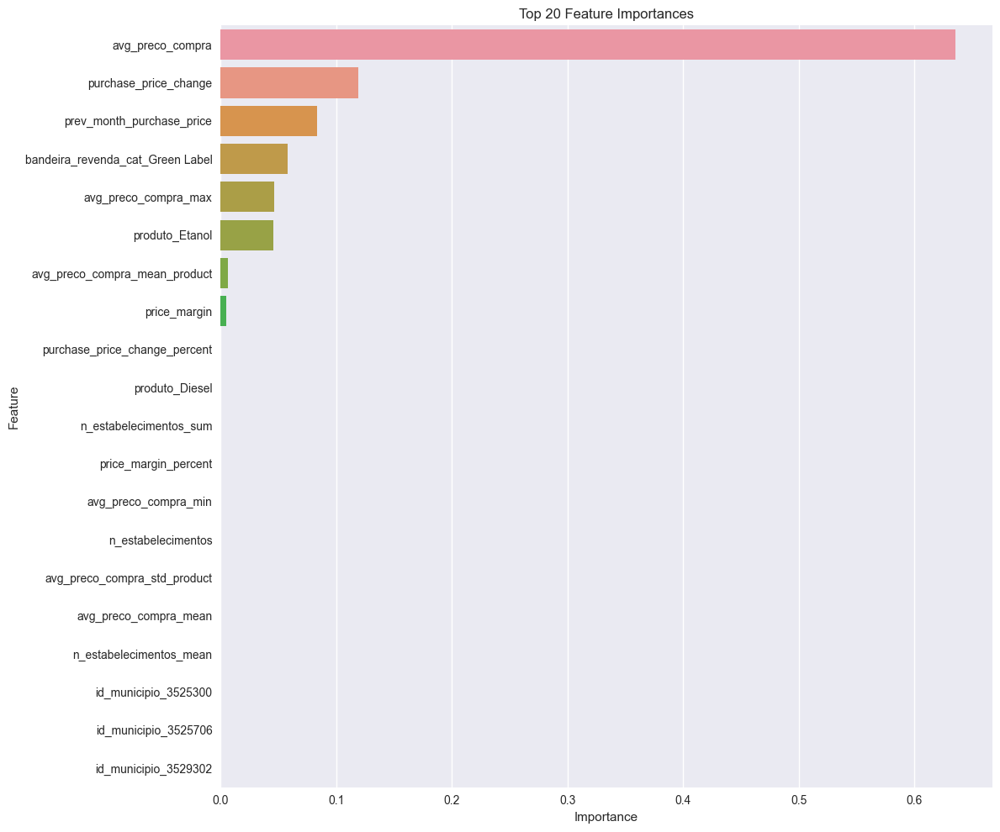


Feature Importance for Estimator 72 (DecisionTreeRegressor):


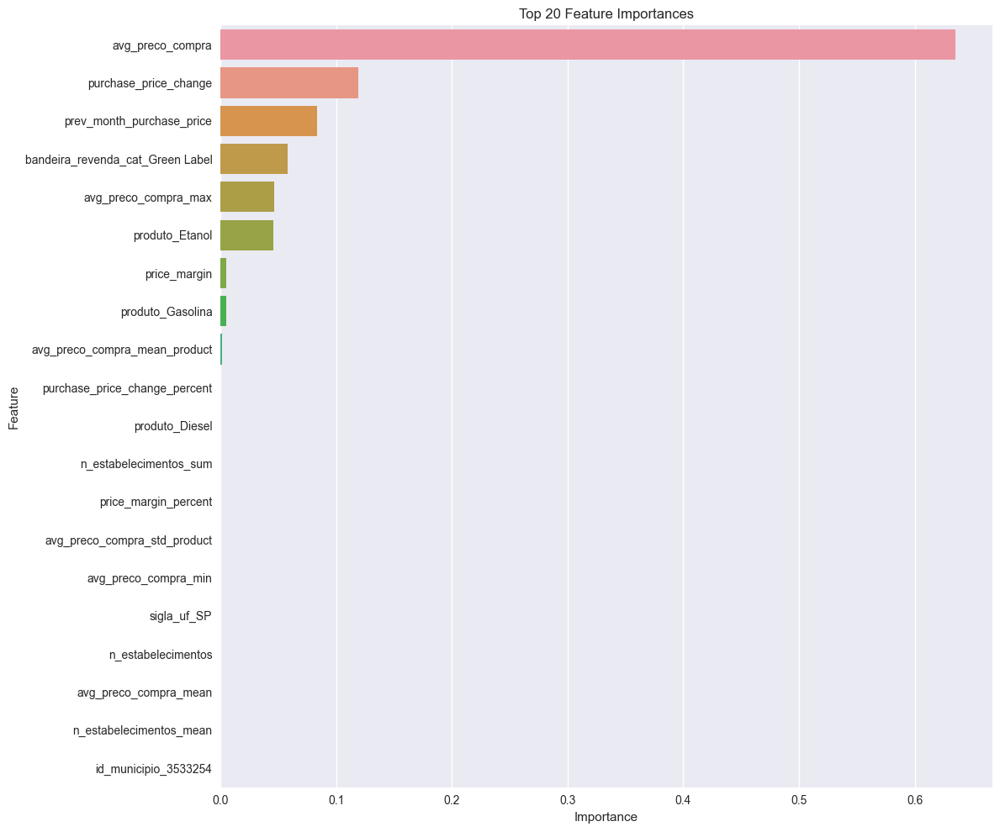


Feature Importance for Estimator 73 (DecisionTreeRegressor):


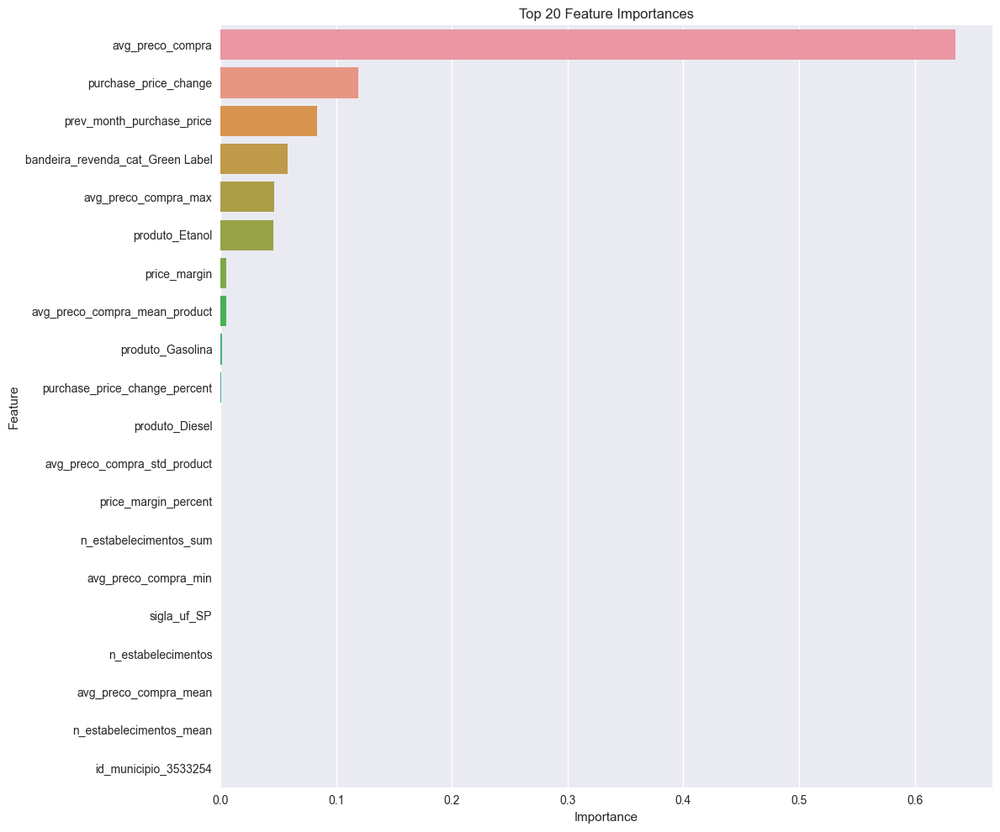


Feature Importance for Estimator 74 (DecisionTreeRegressor):


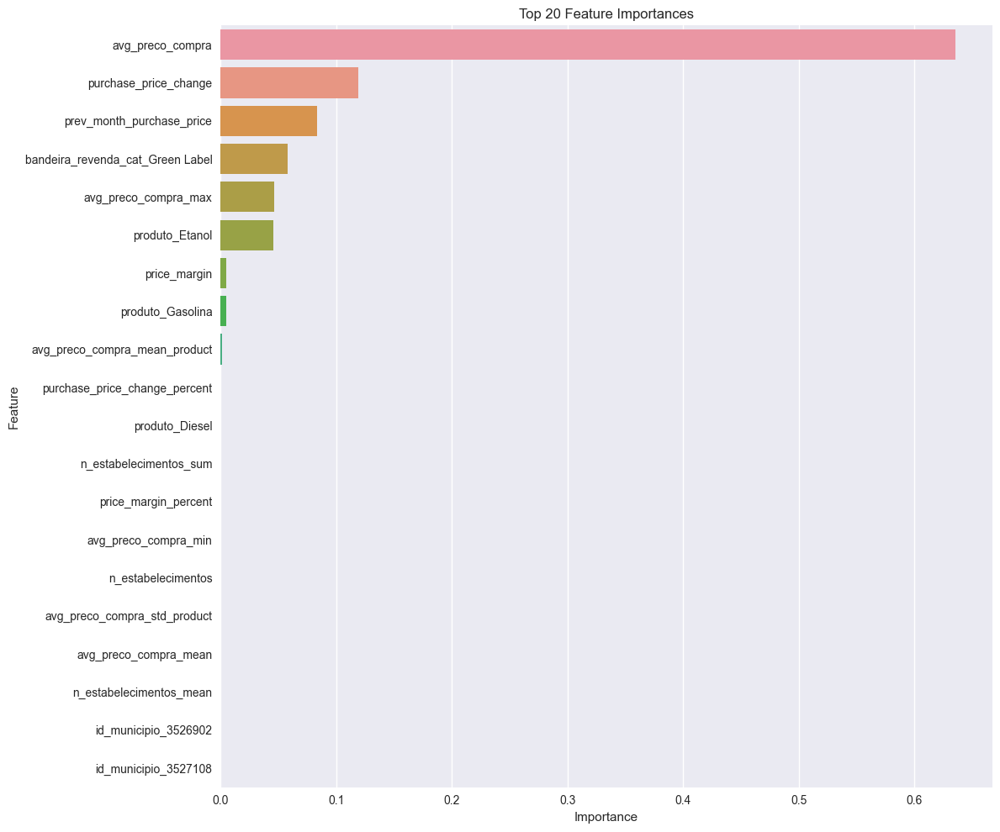


Feature Importance for Estimator 75 (DecisionTreeRegressor):


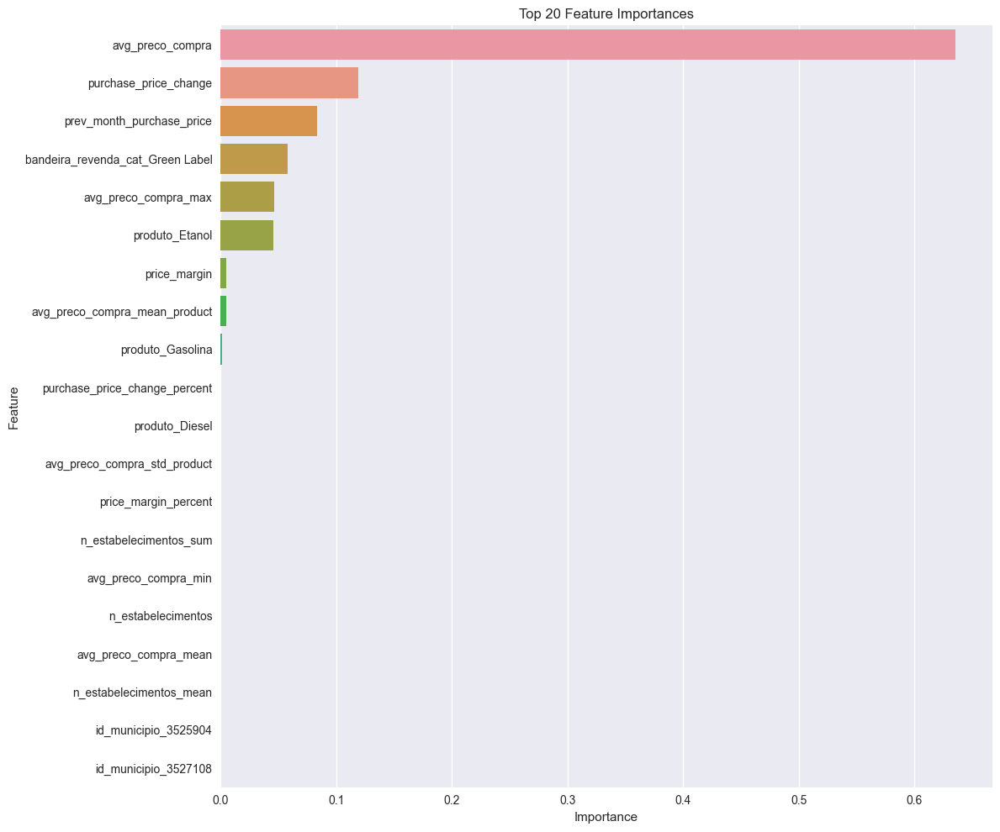


Feature Importance for Estimator 76 (DecisionTreeRegressor):


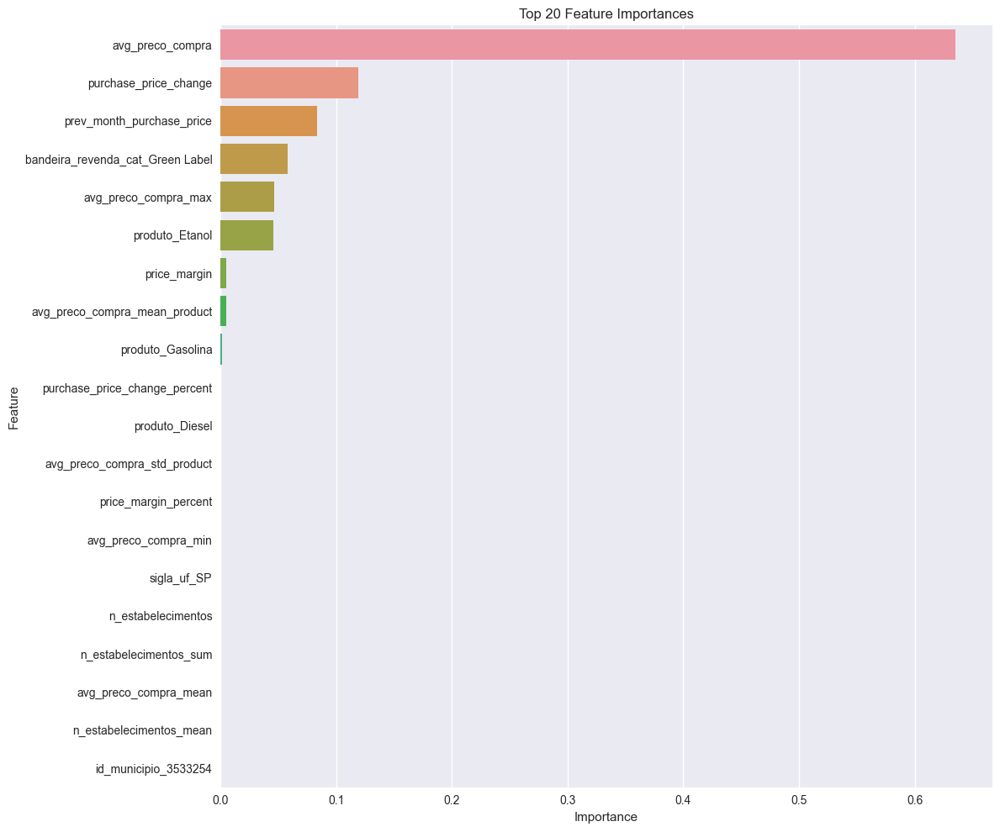


Feature Importance for Estimator 77 (DecisionTreeRegressor):


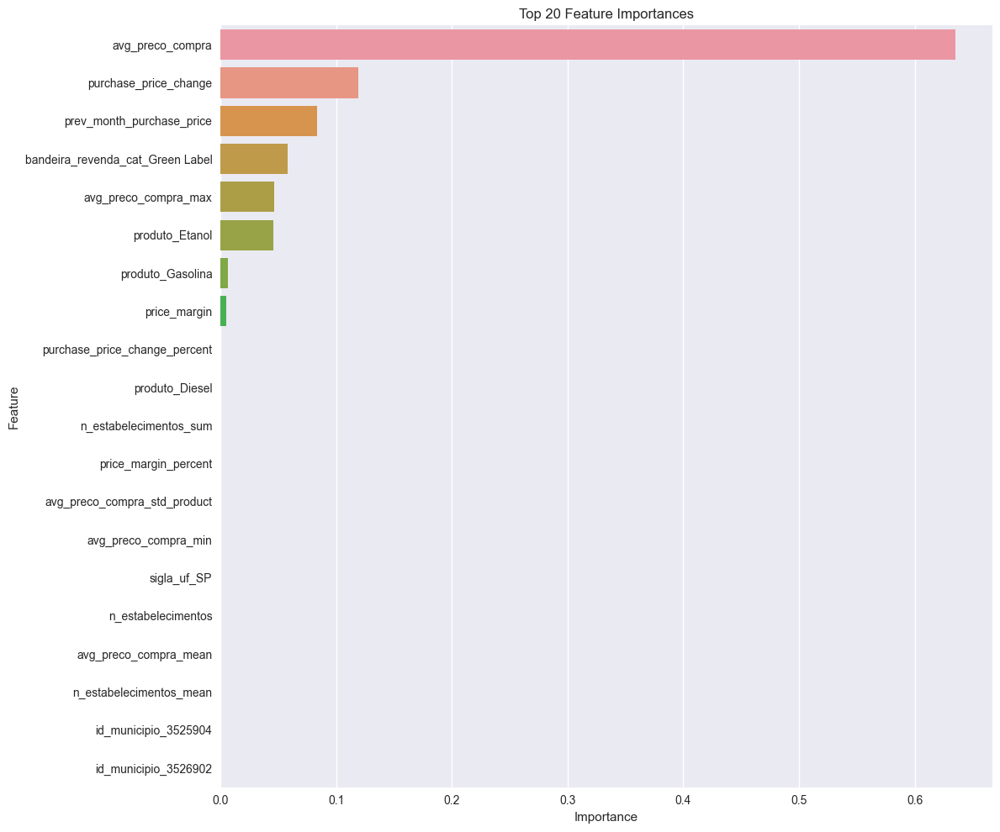


Feature Importance for Estimator 78 (DecisionTreeRegressor):


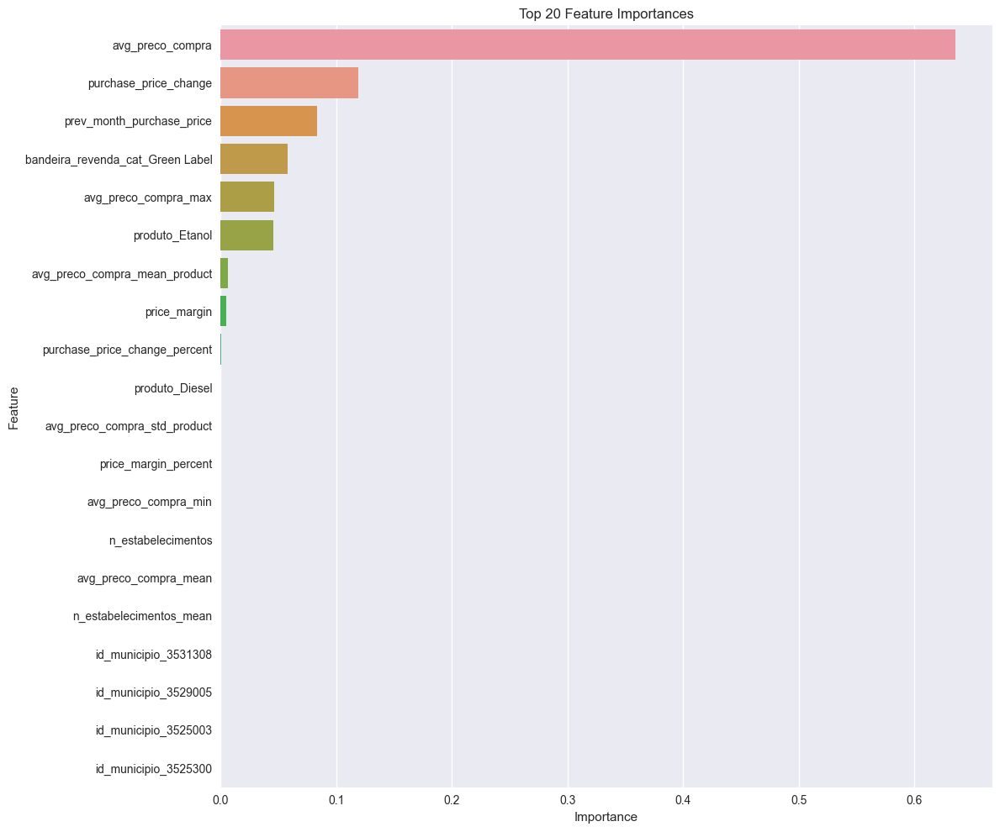


Feature Importance for Estimator 79 (DecisionTreeRegressor):


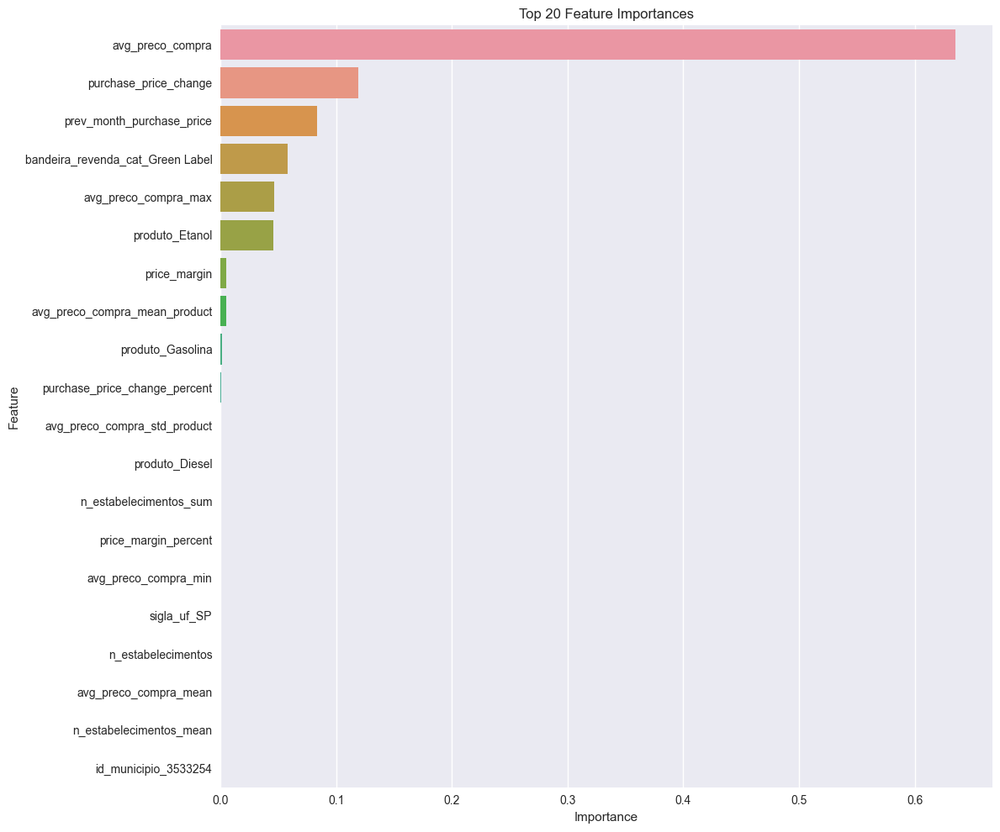


Feature Importance for Estimator 80 (DecisionTreeRegressor):


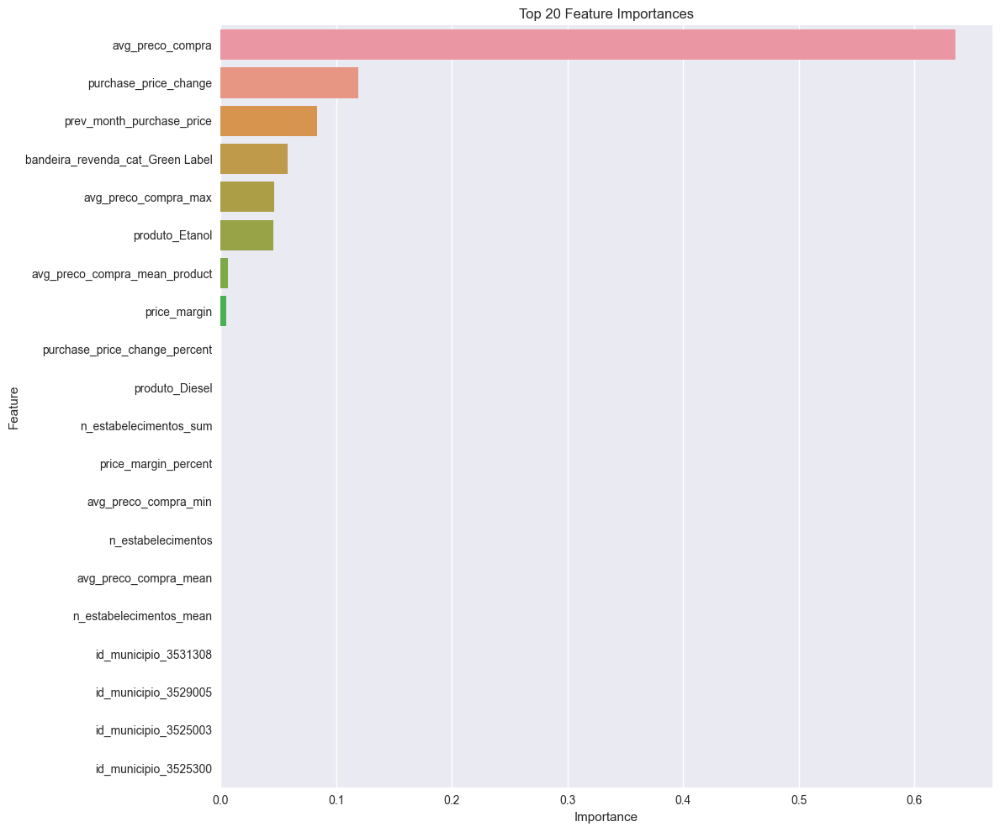


Feature Importance for Estimator 81 (DecisionTreeRegressor):


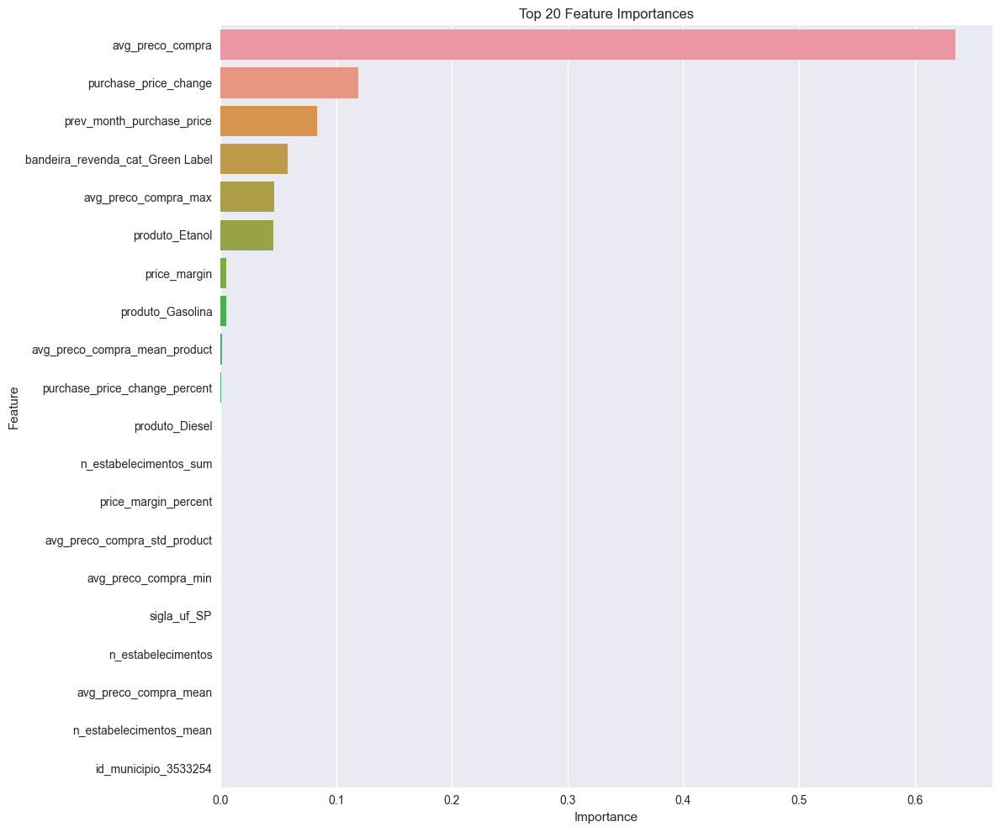


Feature Importance for Estimator 82 (DecisionTreeRegressor):


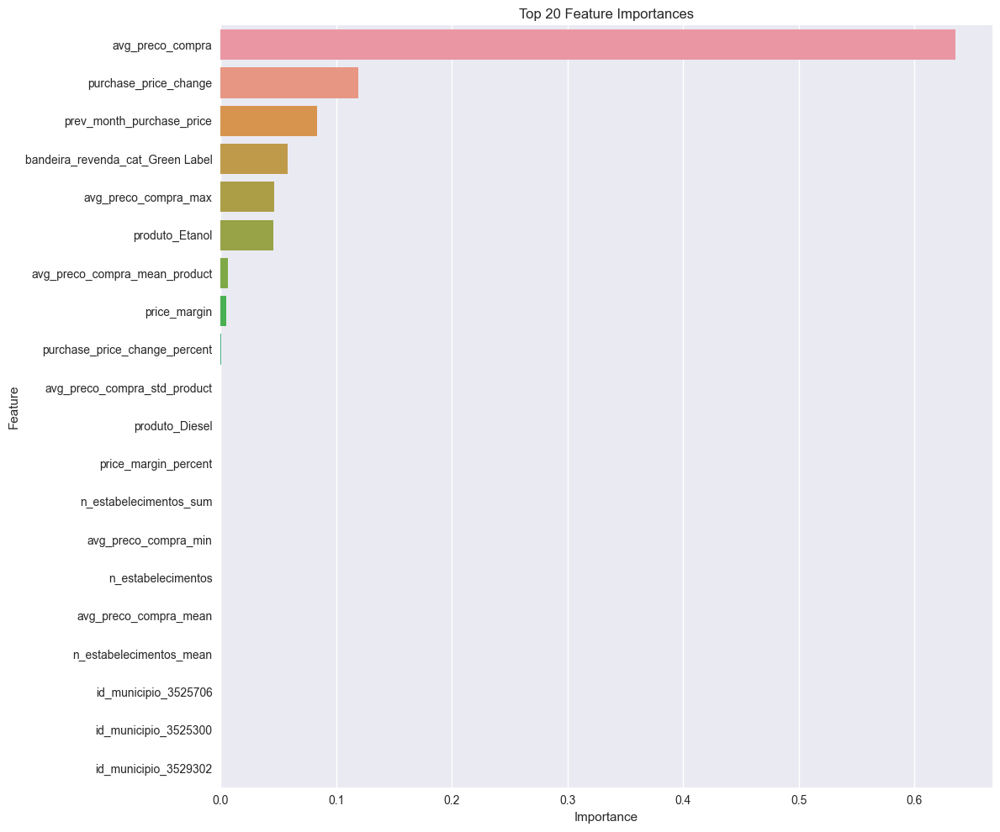


Feature Importance for Estimator 83 (DecisionTreeRegressor):


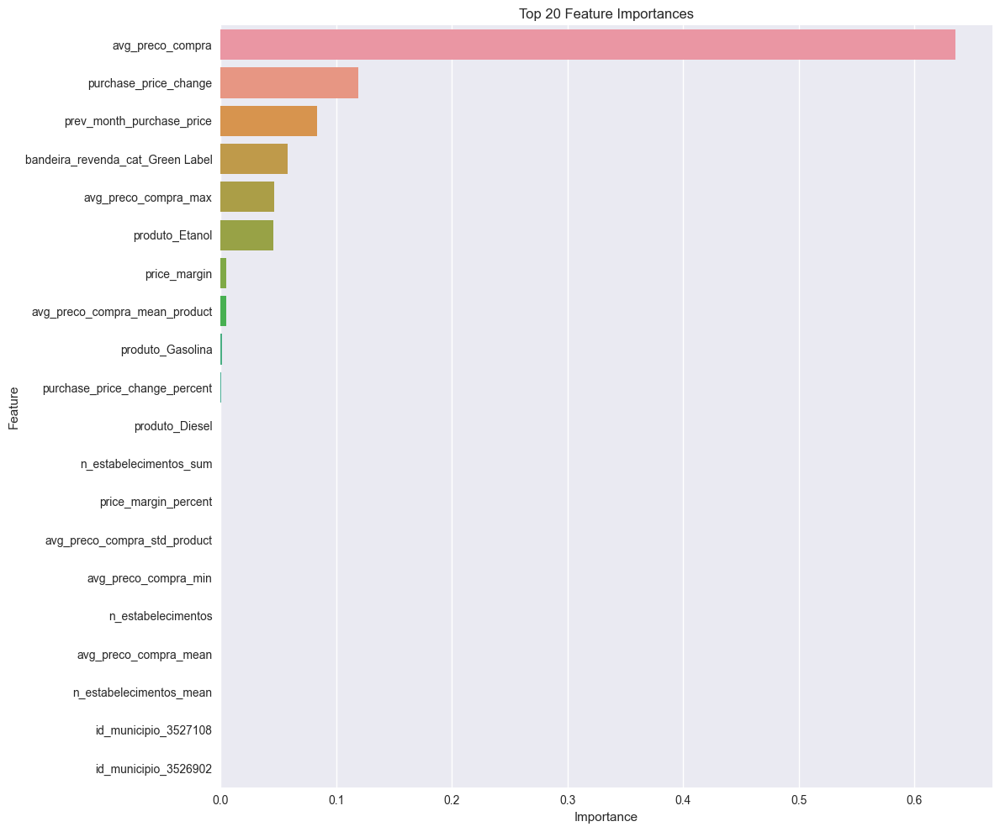


Feature Importance for Estimator 84 (DecisionTreeRegressor):


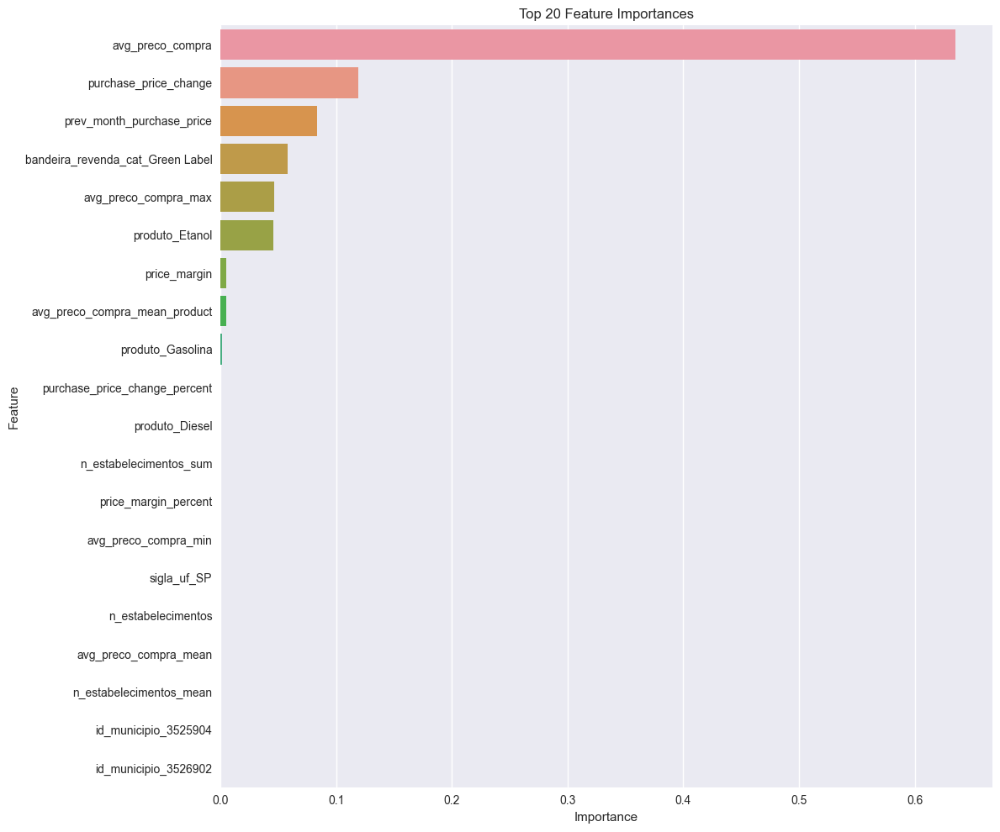


Feature Importance for Estimator 85 (DecisionTreeRegressor):


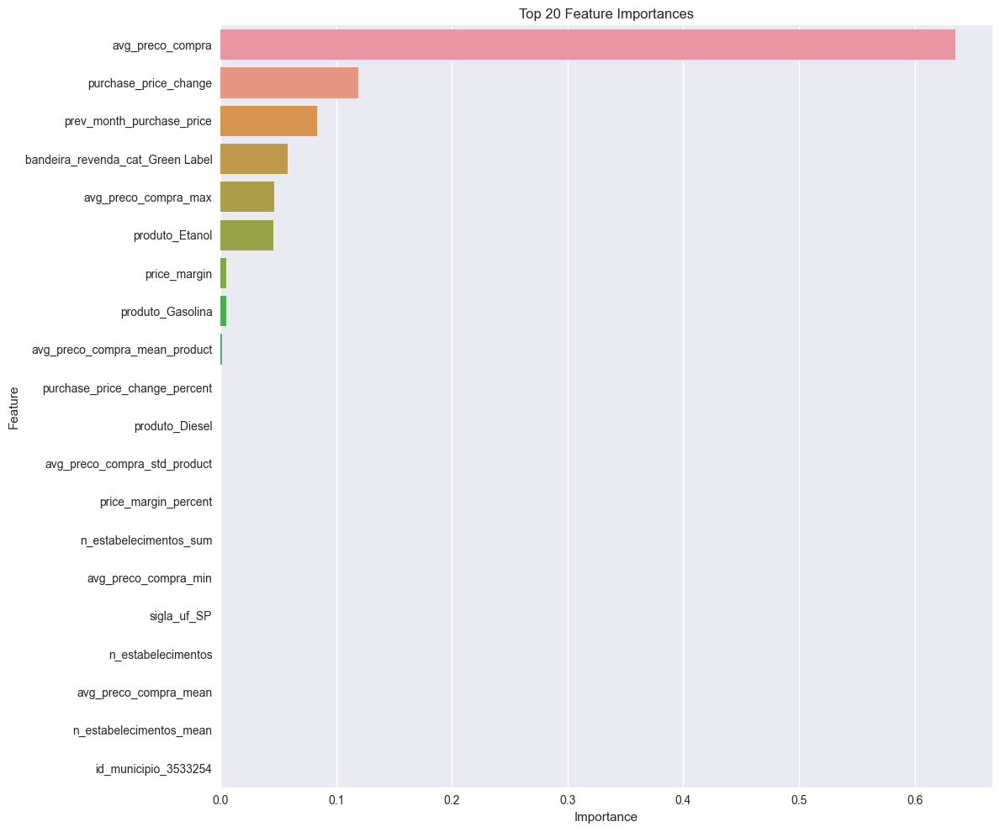


Feature Importance for Estimator 86 (DecisionTreeRegressor):


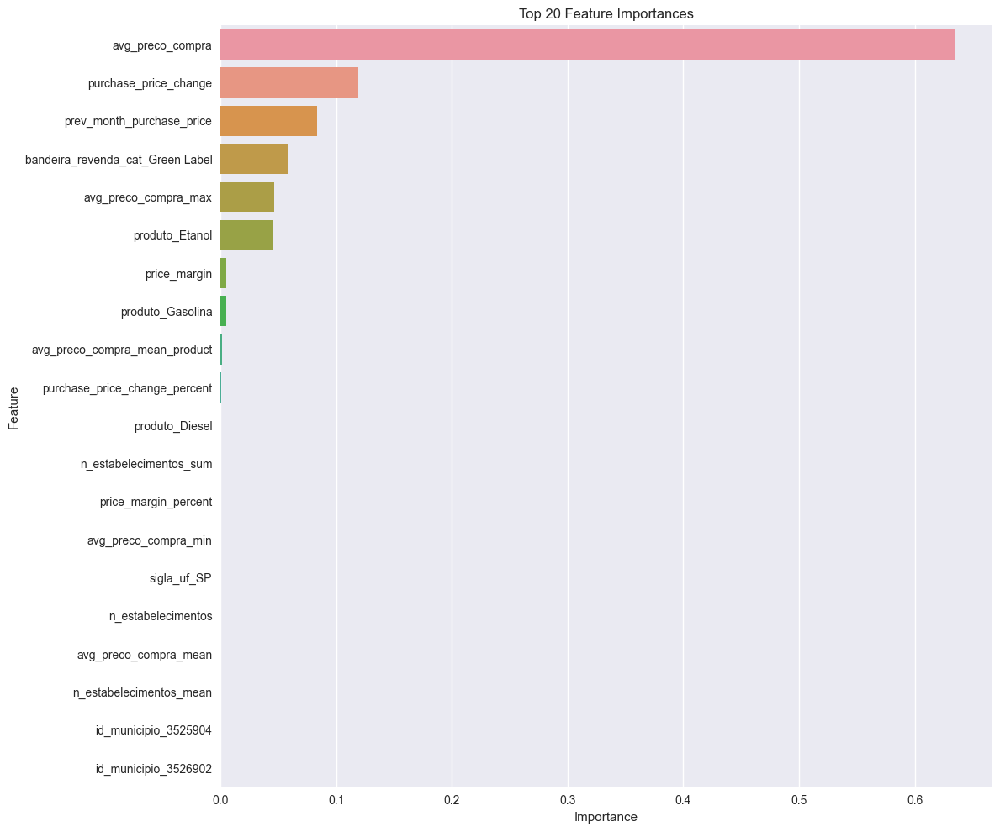


Feature Importance for Estimator 87 (DecisionTreeRegressor):


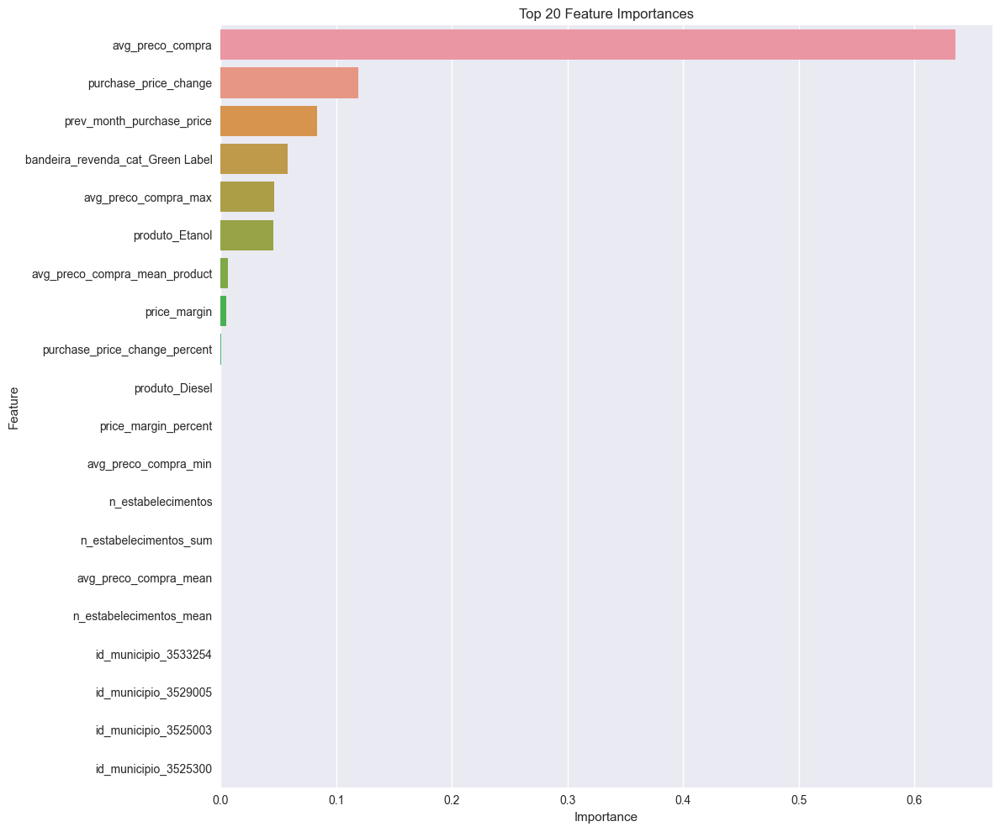


Feature Importance for Estimator 88 (DecisionTreeRegressor):


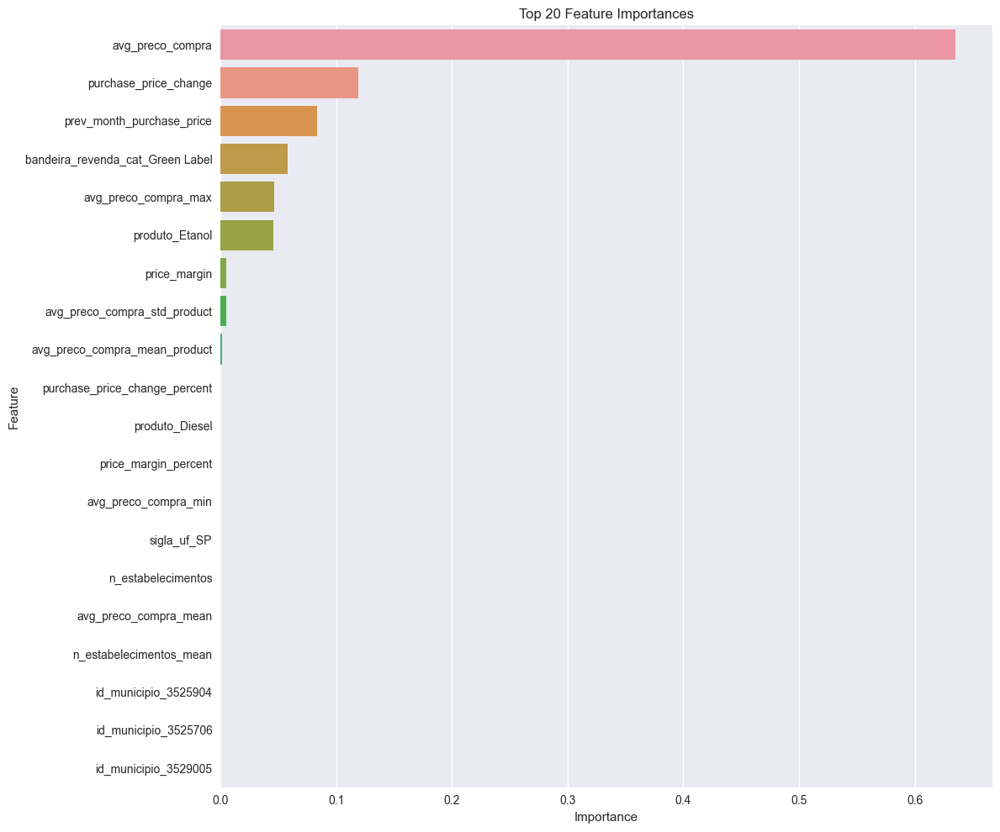


Feature Importance for Estimator 89 (DecisionTreeRegressor):


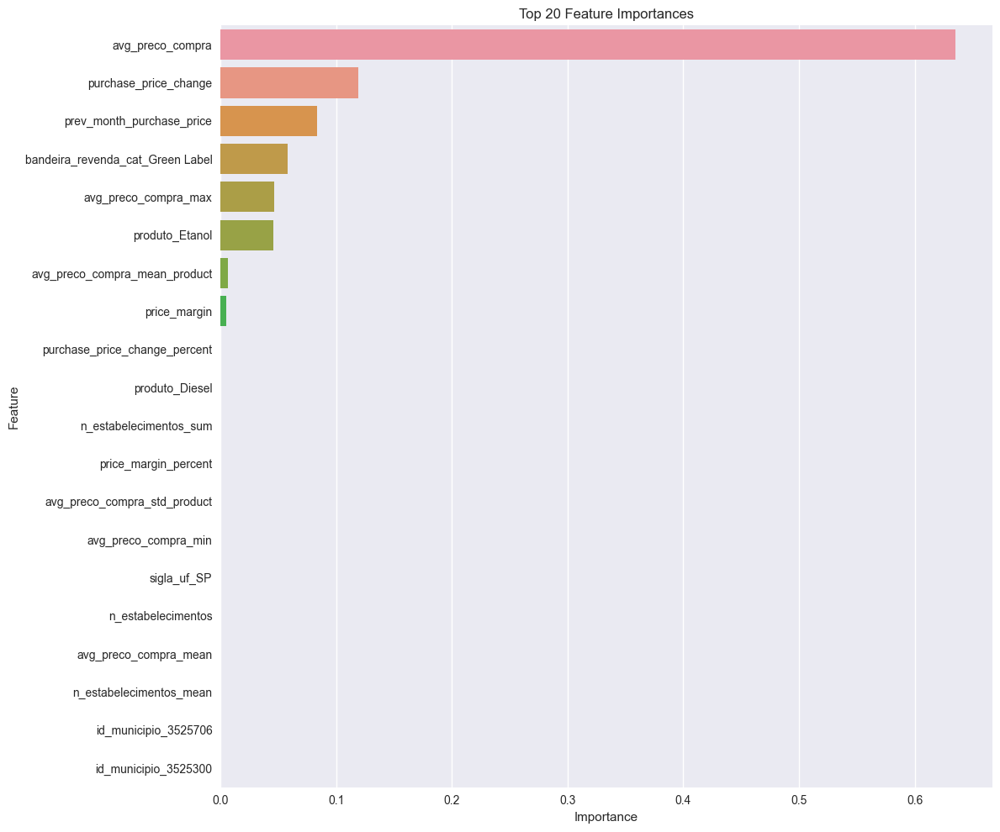


Feature Importance for Estimator 90 (DecisionTreeRegressor):


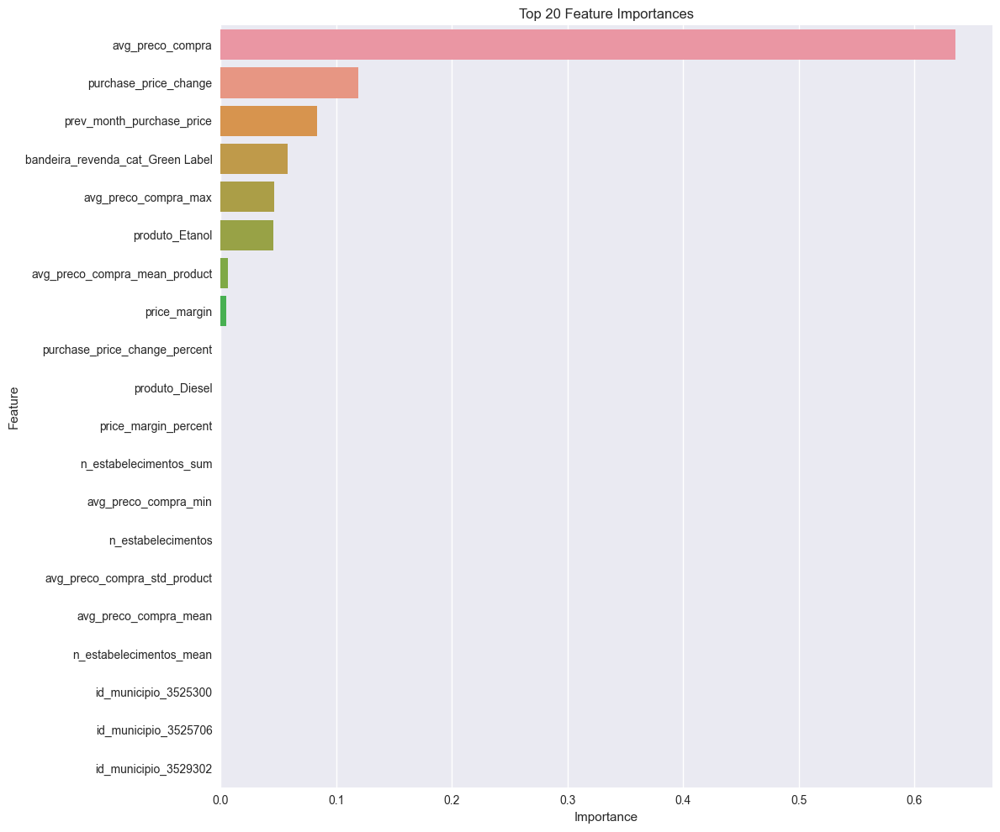


Feature Importance for Estimator 91 (DecisionTreeRegressor):


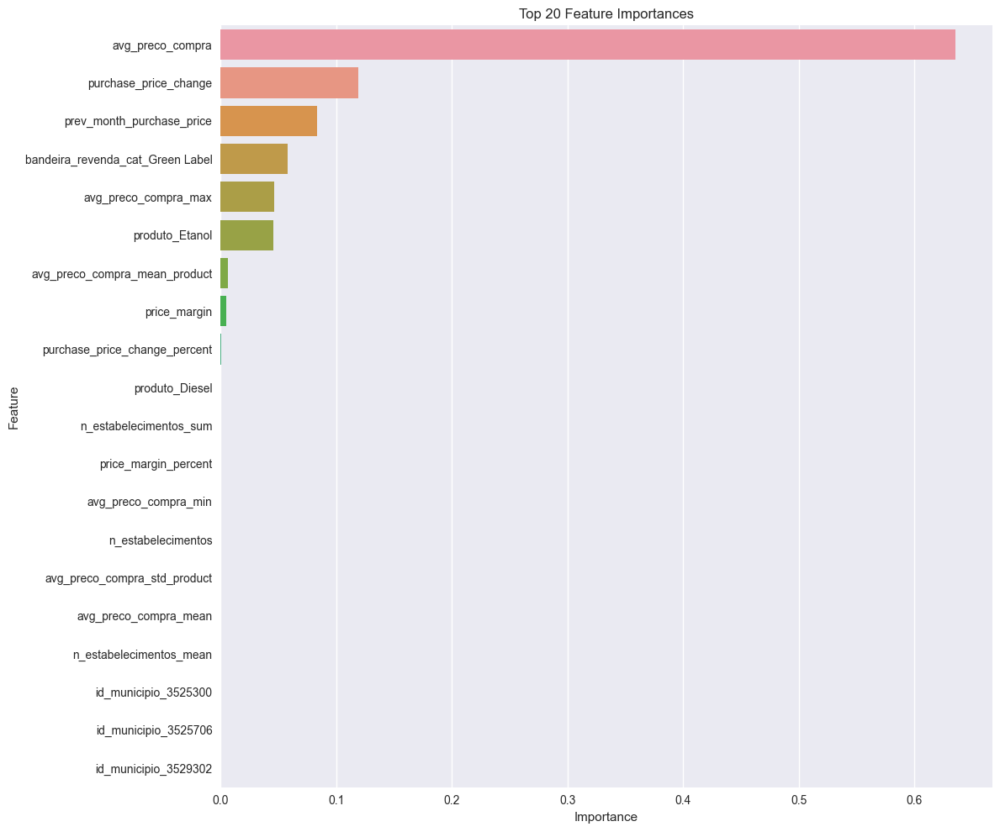


Feature Importance for Estimator 92 (DecisionTreeRegressor):


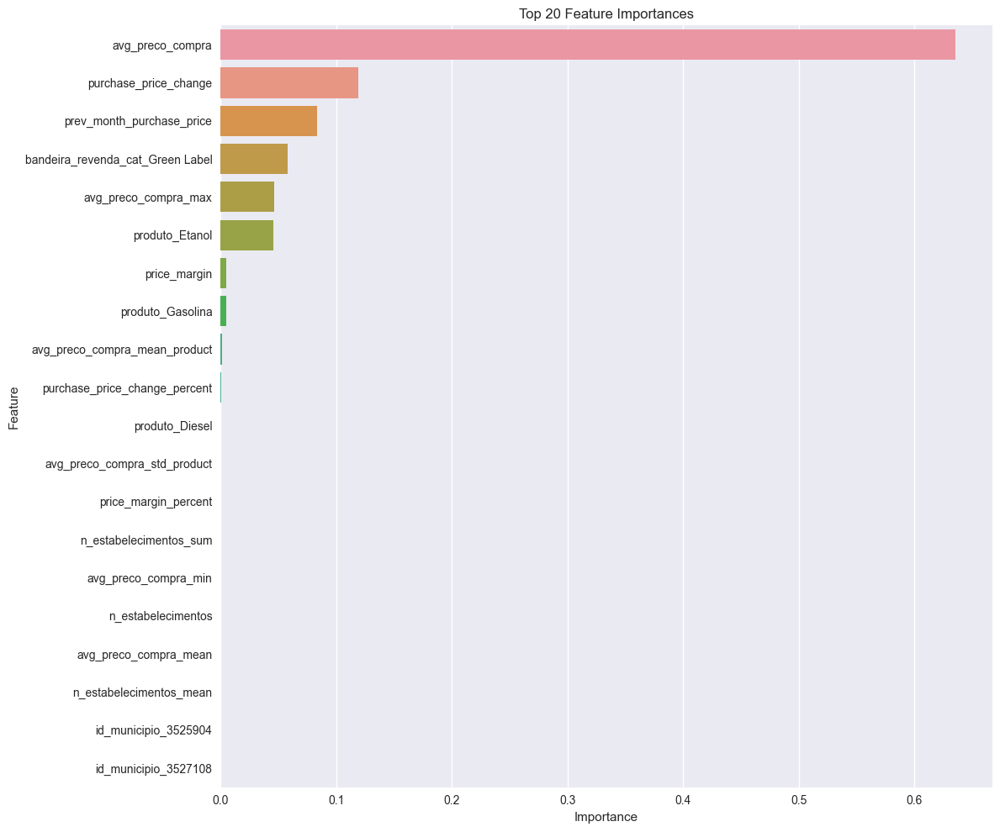


Feature Importance for Estimator 93 (DecisionTreeRegressor):


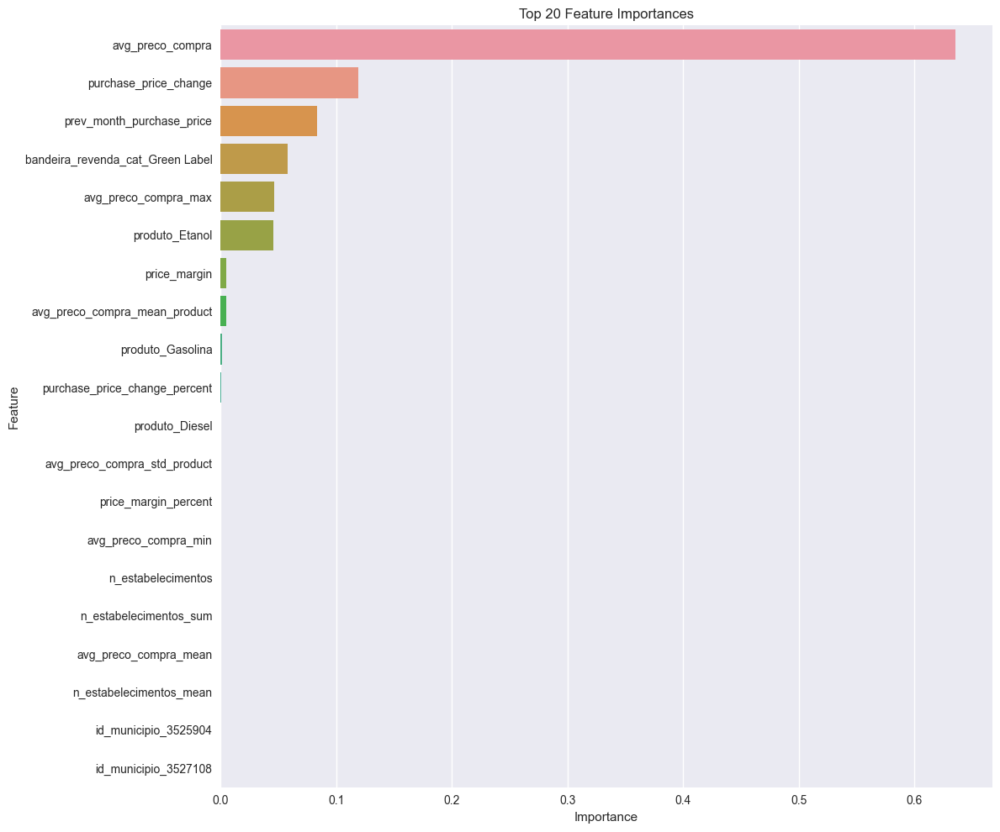


Feature Importance for Estimator 94 (DecisionTreeRegressor):


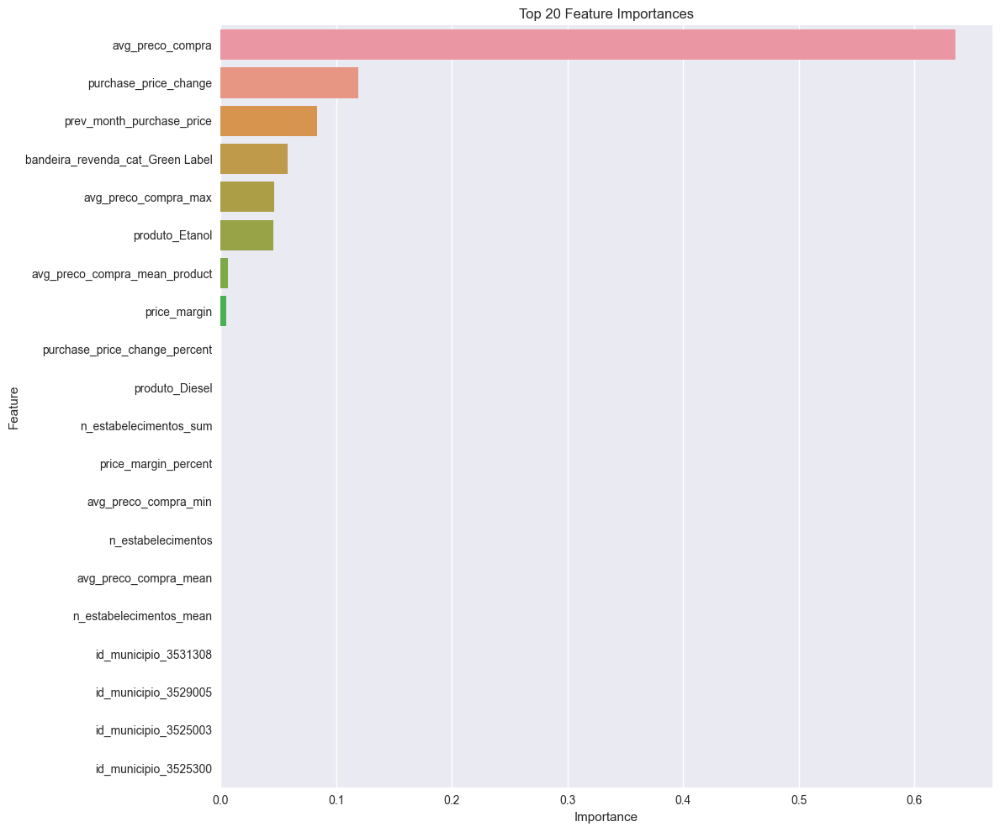


Feature Importance for Estimator 95 (DecisionTreeRegressor):


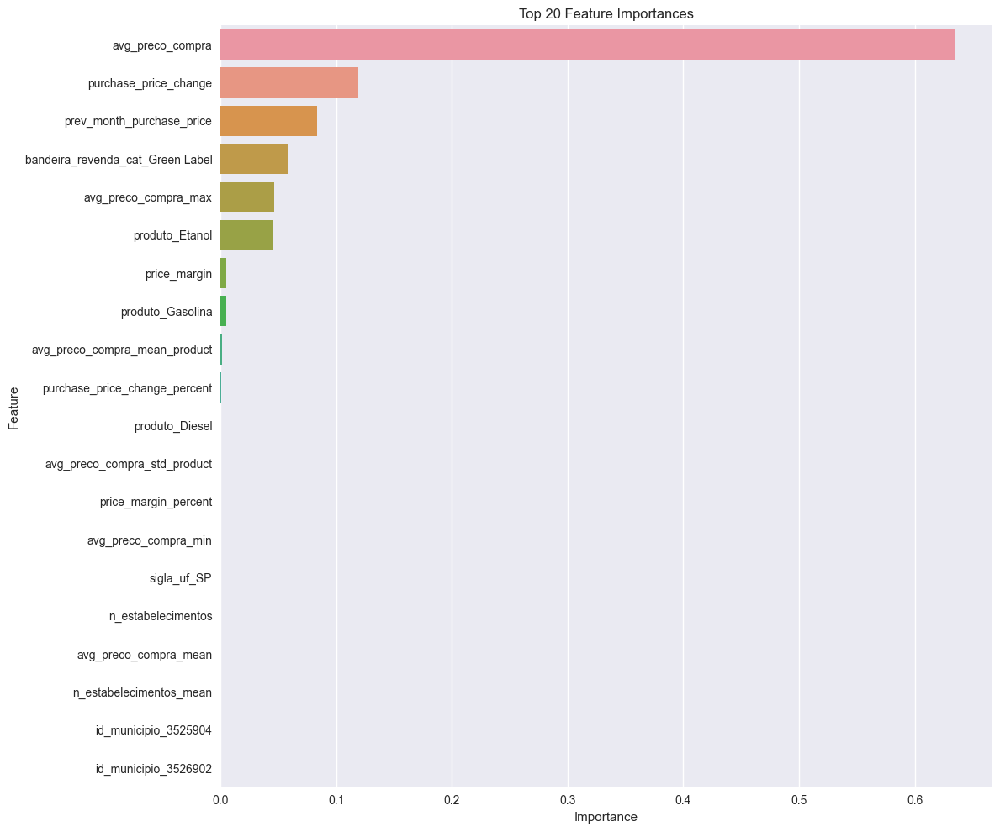


Feature Importance for Estimator 96 (DecisionTreeRegressor):


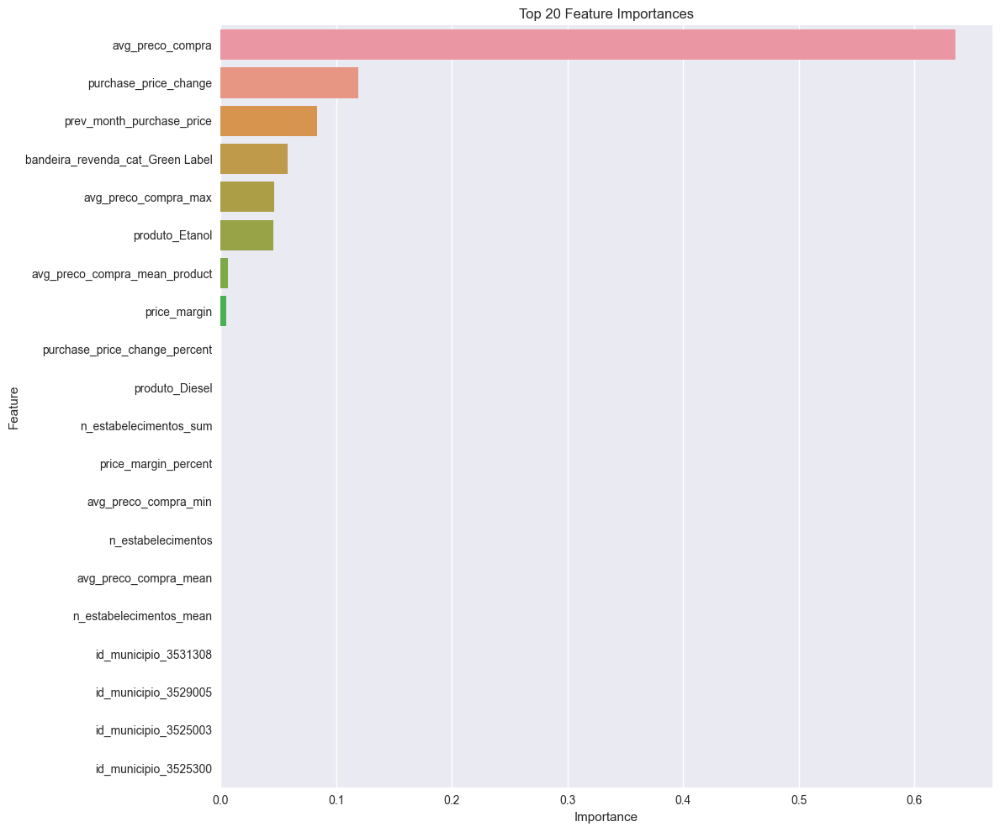


Feature Importance for Estimator 97 (DecisionTreeRegressor):


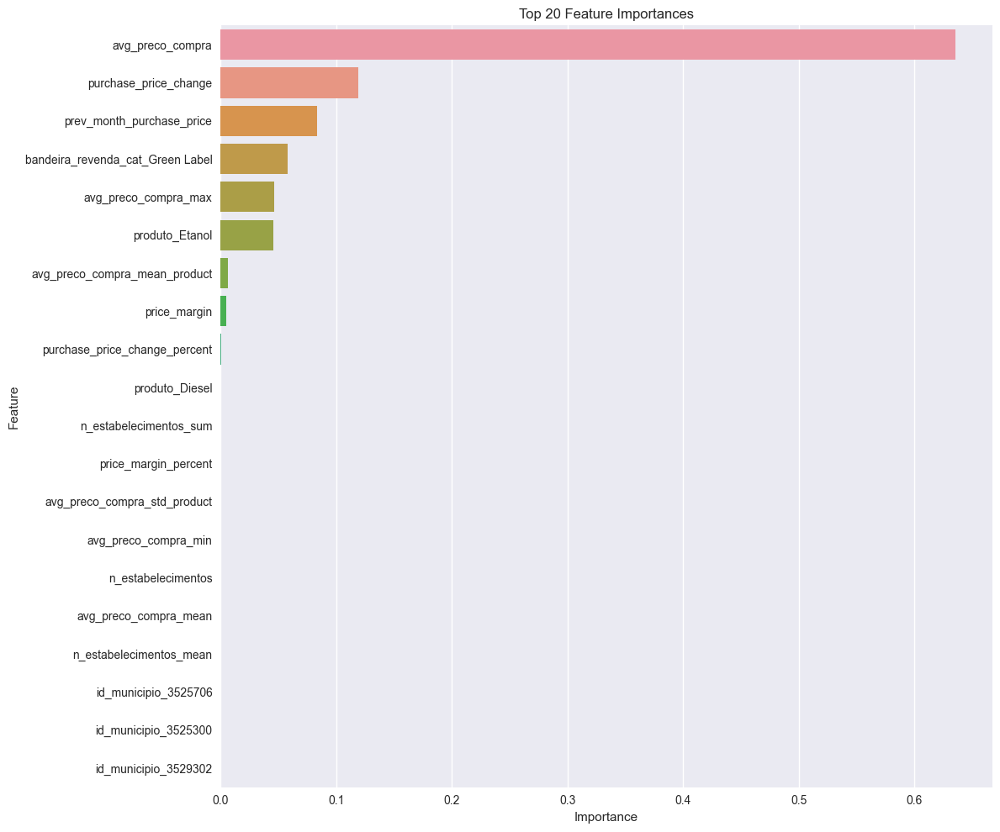


Feature Importance for Estimator 98 (DecisionTreeRegressor):


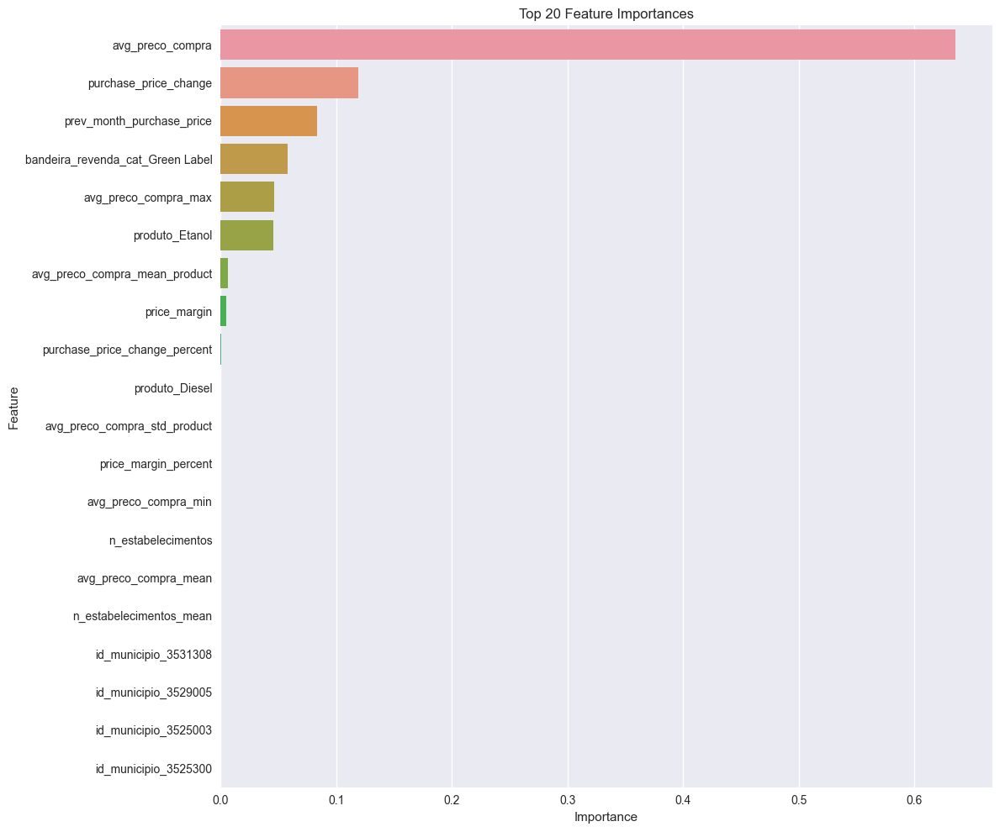


Feature Importance for Estimator 99 (DecisionTreeRegressor):


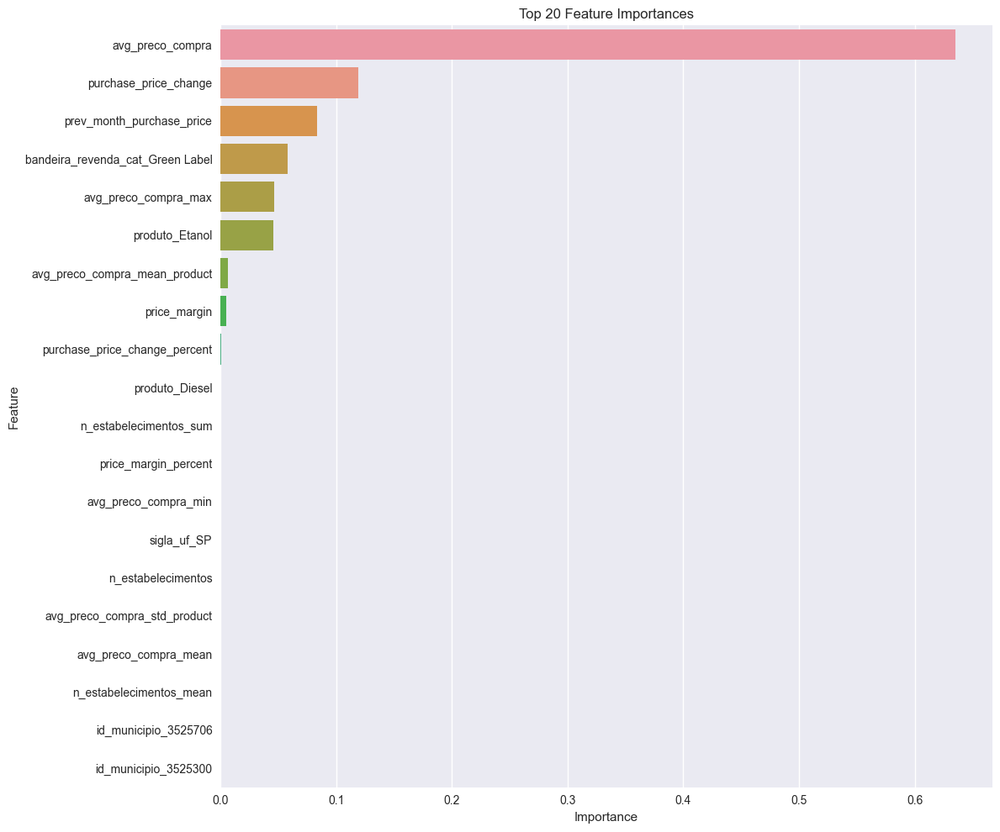


Feature Importance for Estimator 100 (DecisionTreeRegressor):


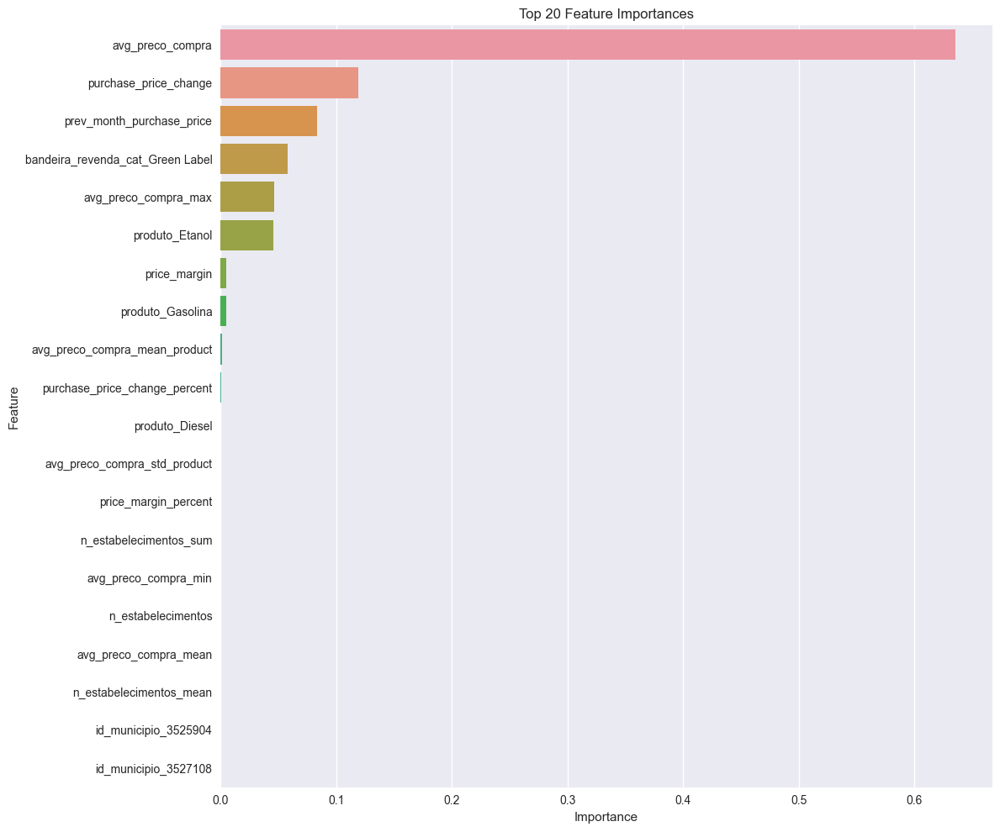

In [9]:
# If the model has feature_importances_ attribute, visualize feature importance
def plot_feature_importance(model, feature_names, top_n=20):
    if hasattr(model, 'feature_importances_'):
        # Get feature importances
        importances = model.feature_importances_
        
        # Create DataFrame for visualization
        feature_importance = pd.DataFrame({
            'Feature': feature_names,
            'Importance': importances
        })
        
        # Sort by importance
        feature_importance = feature_importance.sort_values('Importance', ascending=False)
        
        # Plot top N features
        plt.figure(figsize=(12, 10))
        sns.barplot(x='Importance', y='Feature', data=feature_importance.head(top_n))
        plt.title(f'Top {top_n} Feature Importances')
        plt.tight_layout()
        plt.show()
        
        return feature_importance
    else:
        print("This model doesn't have a feature_importances_ attribute.")
        return None

# Try to plot feature importance
try:
    # For ensemble models, we might need to access the base estimator
    if hasattr(best_model, 'estimators_'):
        # For VotingRegressor
        for i, estimator in enumerate(best_model.estimators_):
            if hasattr(estimator, 'feature_importances_'):
                print(f"\nFeature Importance for Estimator {i+1} ({type(estimator).__name__}):")
                plot_feature_importance(estimator, feature_names)
    elif hasattr(best_model, 'final_estimator_'):
        # For StackingRegressor
        if hasattr(best_model.final_estimator_, 'feature_importances_'):
            print("\nFeature Importance for Final Estimator:")
            plot_feature_importance(best_model.final_estimator_, feature_names)
        
        # Also check base estimators
        for i, estimator in enumerate(best_model.estimators_):
            if hasattr(estimator, 'feature_importances_'):
                print(f"\nFeature Importance for Base Estimator {i+1} ({type(estimator).__name__}):")
                plot_feature_importance(estimator, feature_names)
    else:
        # Direct feature importance
        feature_importance = plot_feature_importance(best_model, feature_names)
except Exception as e:
    print(f"Could not plot feature importance: {e}")

## Key takeaways

1. Overall Prediction Quality
The scatterplots (Predicted vs. Actual) show a significant portion of data points clustering around the diagonal “perfect prediction” line, indicating the model generally tracks market price levels reasonably well.
Despite that, there is visible spread around the diagonal—some under- and over-predictions—reflecting the inherent complexity of fuel price movements.
The model’s performance on both the validation and the final test set looks consistent: we do not see major differences in error patterns. This consistency suggests limited overfitting and that the model generalizes relatively well to unseen data.

2. Residual Analysis (Errors)
The histograms show that the bulk of residuals are near zero and are approximately (though not perfectly) bell‐shaped.
A slightly skewed tail to the positive side implies that, while most errors are small, the model occasionally underestimates actual prices by a larger margin.
The residuals tend to cluster, suggesting the model systematically handles certain price ranges differently—for instance, it may slightly overestimate in one range and underestimate in another.
A “double cluster” in the scatterplots implies there could be two major price regimes (e.g., different products or distinct market conditions) that the model doesn’t fully separate. Fine‐tuning or segmenting by product type or region may help.
While there is some variation in error magnitude at different predicted values, it is not so extreme that it would invalidate the model’s approach.
Nonetheless, targeted feature engineering (e.g., more granular regional or brand data) might reduce error bands in particular segments.

3. Implications & Next Steps
Model Is Useful for Pricing Decisions
The predictions are good enough to serve as a baseline for price forecasting, resource allocation, or budgeting—especially compared to a naive 
forecast (e.g., using only historical averages).

If short‐term price volatility is high, specialized approaches (e.g., SARIMA/VAR models or ensemble methods that incorporate exogenous variables) could further reduce errors and capture seasonality or cyclical effects.

The current model captures overall price trends well and has relatively stable performance across both validation and test data. While there is still room to reduce errors—especially in specific price ranges or product segments—the results indicate a dependable predictive baseline. Leveraging these forecasts, along with ongoing model refinements, should help inform more dynamic and data‐driven pricing strategies in the Brazilian fuel market.

# Financial analysis

In [10]:
y_pred = best_model.predict(X_test)


=== Financial Impact Analysis ===

Creating sample price data for demonstration purposes...
Sample price data created. Note: These are not real values!
Test indices not found in processed data. Using random mapping for demonstration.

Financial Impact Summary:
Total Actual Revenue: $4,441,103.35
Total Predicted Revenue: $3,715,610.69
Revenue Prediction Error: $725,492.66 (16.34%)

Total Actual Profit: $493,765.82
Total Predicted Profit: $413,289.93
Profit Prediction Error: $80,475.89 (16.30%)

Profit Prediction Error Statistics:
count: $8,114.00
mean: $9.92
std: $7.18
min: $-10.39
25%: $5.13
50%: $9.39
75%: $14.52
max: $47.06

Percentage of overestimated predictions: 7.63%
Percentage of underestimated predictions: 92.37%


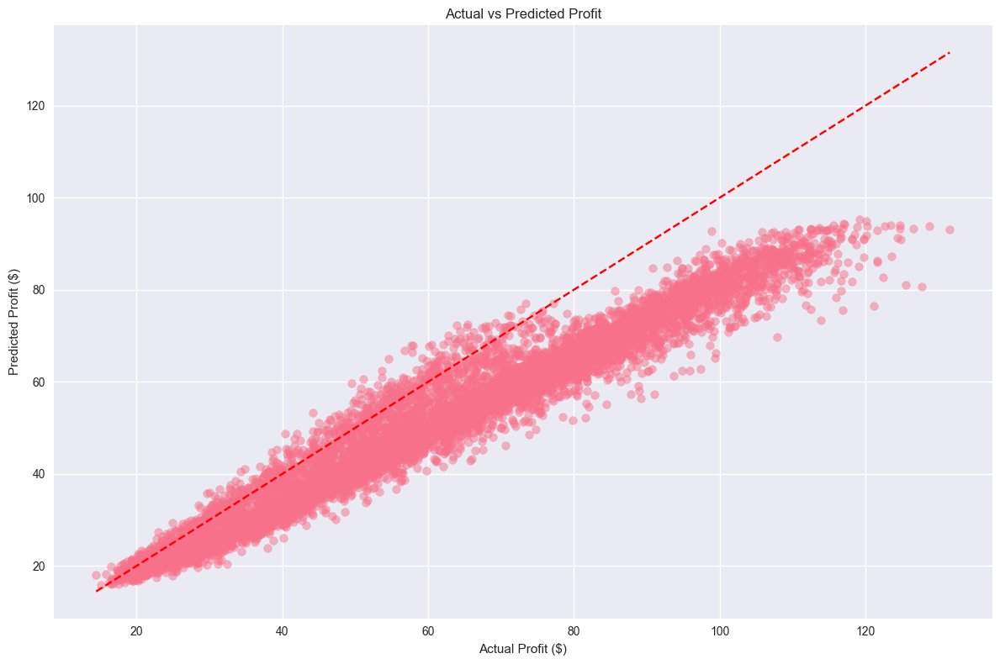

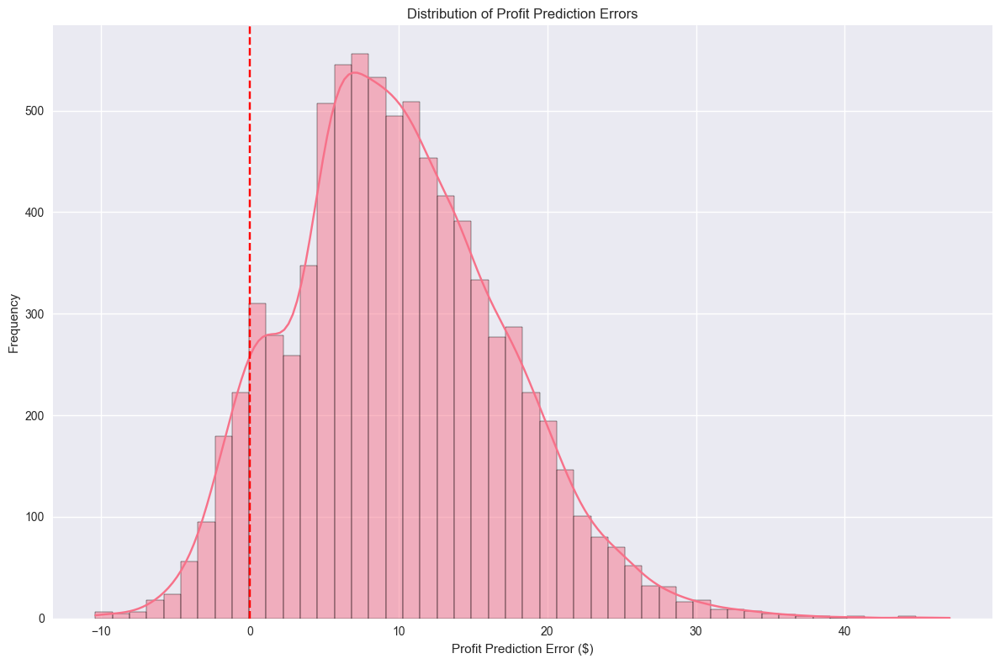

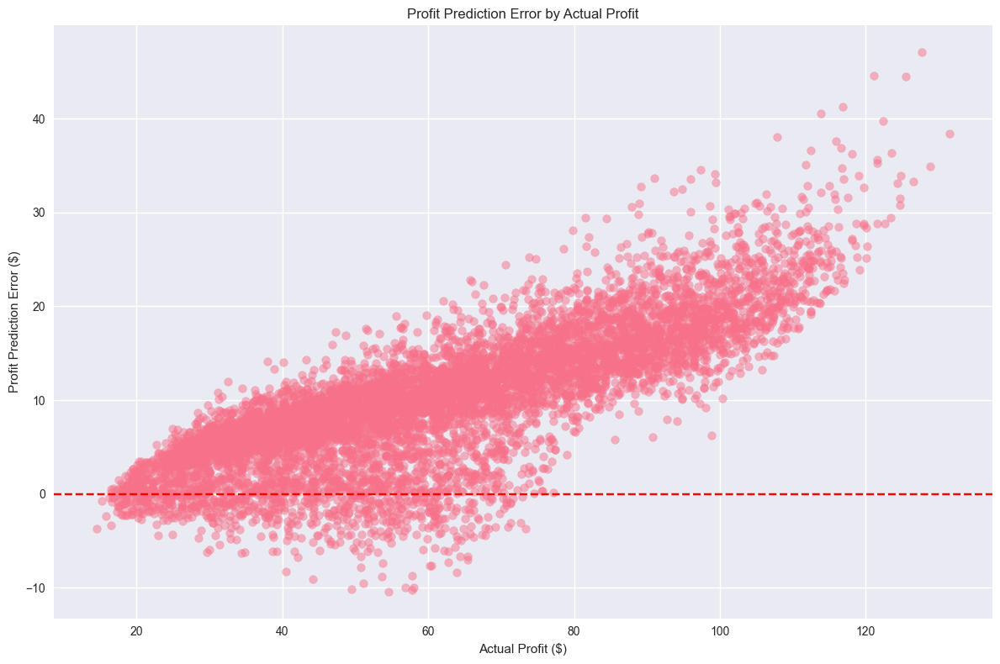

In [11]:
# =====================================================================
# Financial Analysis Based on Model Predictions
# =====================================================================

print("\n=== Financial Impact Analysis ===\n")

# Load the original data to get price information
# Assuming the original dataset has columns for purchase price and selling price
# If these columns have different names, adjust accordingly
df = pd.read_parquet('../data/oil_and_gas_dataset.parquet')

# Check if the required columns exist
required_cols = ['avg_price_compra', 'avg_price_venda']
missing_cols = [col for col in required_cols if col not in df.columns]

if missing_cols:
    print(f"Warning: Missing columns in dataset: {missing_cols}")
    print("Creating sample price data for demonstration purposes...")
    
    # Create sample price data for demonstration
    # In a real scenario, you would use actual price data from your dataset
    df['avg_price_compra'] = np.random.uniform(80, 100, len(df))  # Sample purchase prices
    df['avg_price_venda'] = df['avg_price_compra'] * np.random.uniform(1.05, 1.20, len(df))  # Sample selling prices with 5-20% markup
    
    print("Sample price data created. Note: These are not real values!")

# Extract test set indices to get corresponding price data
# This assumes that the test set is a subset of the original dataframe
# If you have a different way to map test samples to original data, adjust this part
test_indices = processed_data.get('test_indices', None)

if test_indices is None:
    print("Test indices not found in processed data. Using random mapping for demonstration.")
    # For demonstration, we'll use random rows from the original dataframe
    test_indices = np.random.choice(len(df), len(y_test), replace=False)

# Get price data for test set
test_prices = df.iloc[test_indices][['avg_price_compra', 'avg_price_venda']].reset_index(drop=True)

# Create a dataframe with actual values, predictions, and price data
financial_df = pd.DataFrame({
    'actual_value': y_test,
    'predicted_value': y_pred,  # Changed from test_results['predictions'] to y_pred
    'avg_price_compra': test_prices['avg_price_compra'].values,
    'avg_price_venda': test_prices['avg_price_venda'].values
})

# Calculate financial metrics
financial_df['actual_revenue'] = financial_df['actual_value'] * financial_df['avg_price_venda']
financial_df['predicted_revenue'] = financial_df['predicted_value'] * financial_df['avg_price_venda']
financial_df['actual_cost'] = financial_df['actual_value'] * financial_df['avg_price_compra']
financial_df['predicted_cost'] = financial_df['predicted_value'] * financial_df['avg_price_compra']
financial_df['actual_profit'] = financial_df['actual_revenue'] - financial_df['actual_cost']
financial_df['predicted_profit'] = financial_df['predicted_revenue'] - financial_df['predicted_cost']
financial_df['profit_error'] = financial_df['actual_profit'] - financial_df['predicted_profit']
financial_df['profit_error_pct'] = (financial_df['profit_error'] / financial_df['actual_profit']) * 100

# Display summary statistics
print("\nFinancial Impact Summary:")
print(f"Total Actual Revenue: ${financial_df['actual_revenue'].sum():,.2f}")
print(f"Total Predicted Revenue: ${financial_df['predicted_revenue'].sum():,.2f}")
print(f"Revenue Prediction Error: ${financial_df['actual_revenue'].sum() - financial_df['predicted_revenue'].sum():,.2f} " +
      f"({(financial_df['actual_revenue'].sum() - financial_df['predicted_revenue'].sum()) / financial_df['actual_revenue'].sum() * 100:.2f}%)")

print(f"\nTotal Actual Profit: ${financial_df['actual_profit'].sum():,.2f}")
print(f"Total Predicted Profit: ${financial_df['predicted_profit'].sum():,.2f}")
print(f"Profit Prediction Error: ${financial_df['actual_profit'].sum() - financial_df['predicted_profit'].sum():,.2f} " +
      f"({(financial_df['actual_profit'].sum() - financial_df['predicted_profit'].sum()) / financial_df['actual_profit'].sum() * 100:.2f}%)")

# Display detailed statistics on profit prediction errors
print("\nProfit Prediction Error Statistics:")
profit_error_stats = financial_df['profit_error'].describe()
for stat, value in profit_error_stats.items():
    print(f"{stat}: ${value:,.2f}")

# Calculate the percentage of predictions that would lead to financial losses
overestimation = (financial_df['predicted_value'] > financial_df['actual_value']).mean() * 100
underestimation = (financial_df['predicted_value'] < financial_df['actual_value']).mean() * 100

print(f"\nPercentage of overestimated predictions: {overestimation:.2f}%")
print(f"Percentage of underestimated predictions: {underestimation:.2f}%")

# Visualize financial impact
plt.figure(figsize=(12, 8))
plt.scatter(financial_df['actual_profit'], financial_df['predicted_profit'], alpha=0.5)
min_profit = min(financial_df['actual_profit'].min(), financial_df['predicted_profit'].min())
max_profit = max(financial_df['actual_profit'].max(), financial_df['predicted_profit'].max())
plt.plot([min_profit, max_profit], [min_profit, max_profit], 'r--')
plt.xlabel('Actual Profit ($)')
plt.ylabel('Predicted Profit ($)')
plt.title('Actual vs Predicted Profit')
plt.grid(True)
plt.tight_layout()
plt.show()

# Visualize profit error distribution
plt.figure(figsize=(12, 8))
sns.histplot(financial_df['profit_error'], kde=True, bins=50)
plt.axvline(x=0, color='r', linestyle='--')
plt.xlabel('Profit Prediction Error ($)')
plt.ylabel('Frequency')
plt.title('Distribution of Profit Prediction Errors')
plt.grid(True)
plt.tight_layout()
plt.show()

# Visualize profit error by actual profit magnitude
plt.figure(figsize=(12, 8))
plt.scatter(financial_df['actual_profit'], financial_df['profit_error'], alpha=0.5)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Actual Profit ($)')
plt.ylabel('Profit Prediction Error ($)')
plt.title('Profit Prediction Error by Actual Profit')
plt.grid(True)
plt.tight_layout()
plt.show()


Financial Impact by Profit Margin:


,margin_bin,actual_margin_mean,predicted_margin_mean,margin_error_mean,margin_error_std,margin_error_count,profit_error_mean,profit_error_std,profit_error_sum
0,"(4.760999999999999, 7.374]",6.086704,6.086704,-3.174020e-17,8.986195e-15,1623,5.257600,3.158494,8533.084326
1,"(7.374, 9.983]",8.684665,8.684665,1.078072e-16,8.546498e-15,1623,7.510823,4.665959,12190.066218
2,"(9.983, 12.317]",11.138374,11.138374,-4.895385e-16,8.012403e-15,1622,9.991244,6.026828,16205.798368
3,"(12.317, 14.565]",13.439067,13.439067,6.566938e-18,8.146737e-15,1623,12.329977,7.649263,20011.552844
4,"(14.565, 16.664]",15.614081,15.614081,-1.258663e-16,7.934657e-15,1623,14.501165,8.756489,23535.391263


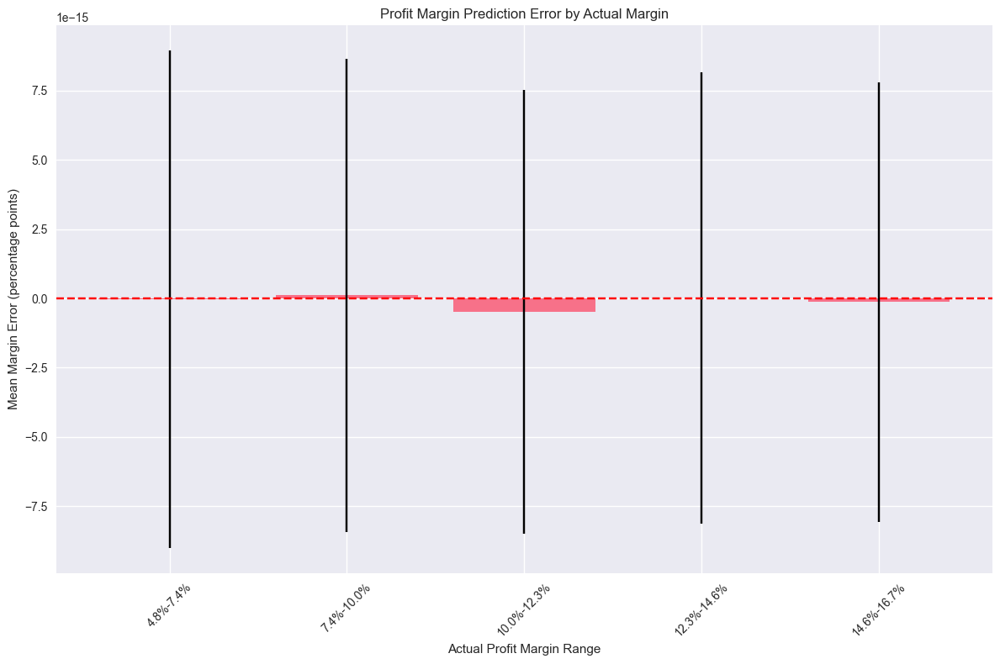

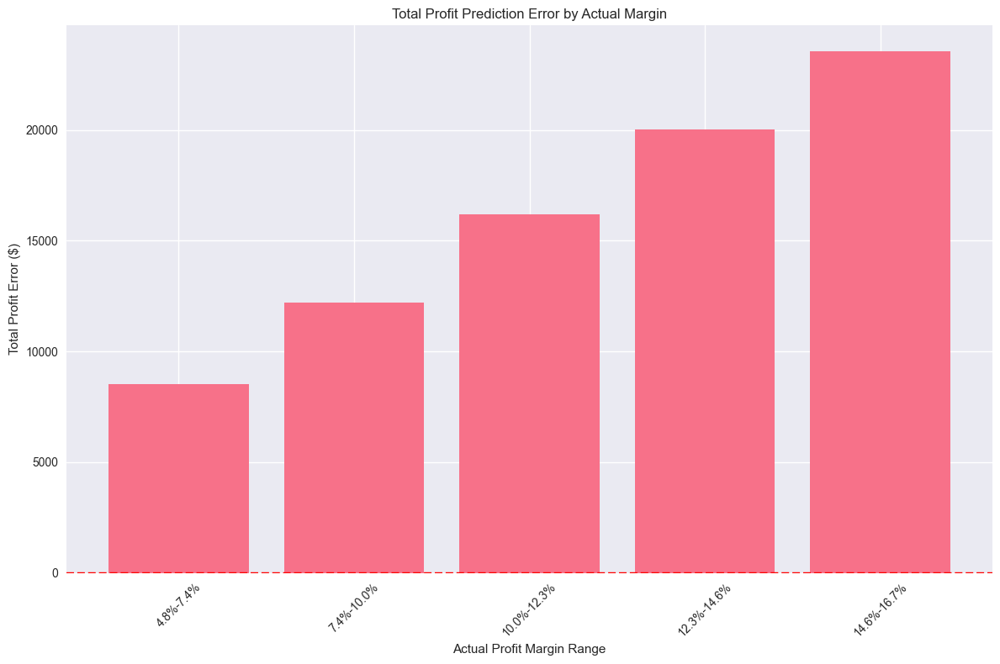

In [12]:
# Analyze financial impact by profit margin
financial_df['actual_margin'] = financial_df['actual_profit'] / financial_df['actual_revenue'] * 100
financial_df['predicted_margin'] = financial_df['predicted_profit'] / financial_df['predicted_revenue'] * 100
financial_df['margin_error'] = financial_df['actual_margin'] - financial_df['predicted_margin']

# Group by margin ranges
margin_bins = pd.qcut(financial_df['actual_margin'], 5, duplicates='drop')
financial_df['margin_bin'] = margin_bins

margin_analysis = financial_df.groupby('margin_bin').agg({
    'actual_margin': 'mean',
    'predicted_margin': 'mean',
    'margin_error': ['mean', 'std', 'count'],
    'profit_error': ['mean', 'std', 'sum']
})

margin_analysis.columns = ['_'.join(col).strip() for col in margin_analysis.columns.values]
margin_analysis = margin_analysis.reset_index()

print("\nFinancial Impact by Profit Margin:")
display(margin_analysis)

# Visualize margin error by margin bin
plt.figure(figsize=(12, 8))
plt.bar(range(len(margin_analysis)), margin_analysis['margin_error_mean'], 
        yerr=margin_analysis['margin_error_std'])
plt.xticks(range(len(margin_analysis)), 
           [f"{b.left:.1f}%-{b.right:.1f}%" for b in margin_analysis['margin_bin']], 
           rotation=45)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Actual Profit Margin Range')
plt.ylabel('Mean Margin Error (percentage points)')
plt.title('Profit Margin Prediction Error by Actual Margin')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# Visualize total profit error by margin bin
plt.figure(figsize=(12, 8))
plt.bar(range(len(margin_analysis)), margin_analysis['profit_error_sum'])
plt.xticks(range(len(margin_analysis)), 
           [f"{b.left:.1f}%-{b.right:.1f}%" for b in margin_analysis['margin_bin']], 
           rotation=45)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Actual Profit Margin Range')
plt.ylabel('Total Profit Error ($)')
plt.title('Total Profit Prediction Error by Actual Margin')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()


Business Decision Analysis with Different Profit Thresholds:


,threshold,accuracy,precision,recall,f1
0,0,1.000000,1.0,1.0,1.0
1,100,0.932709,0.0,0.0,0.0
2,500,1.000000,0.0,0.0,0.0
3,1000,1.000000,0.0,0.0,0.0
4,5000,1.000000,0.0,0.0,0.0



Financial Impact of Decisions:


,threshold,correct_profit,wasted_investment,missed_profit,correct_avoidance,net_impact
0,0,493765.822135,0.0,0.00000,0.000000,493765.822135
1,100,0.000000,0.0,58641.17076,-435124.651375,0.000000
2,500,0.000000,0.0,0.00000,-493765.822135,0.000000
3,1000,0.000000,0.0,0.00000,-493765.822135,0.000000
4,5000,0.000000,0.0,0.00000,-493765.822135,0.000000


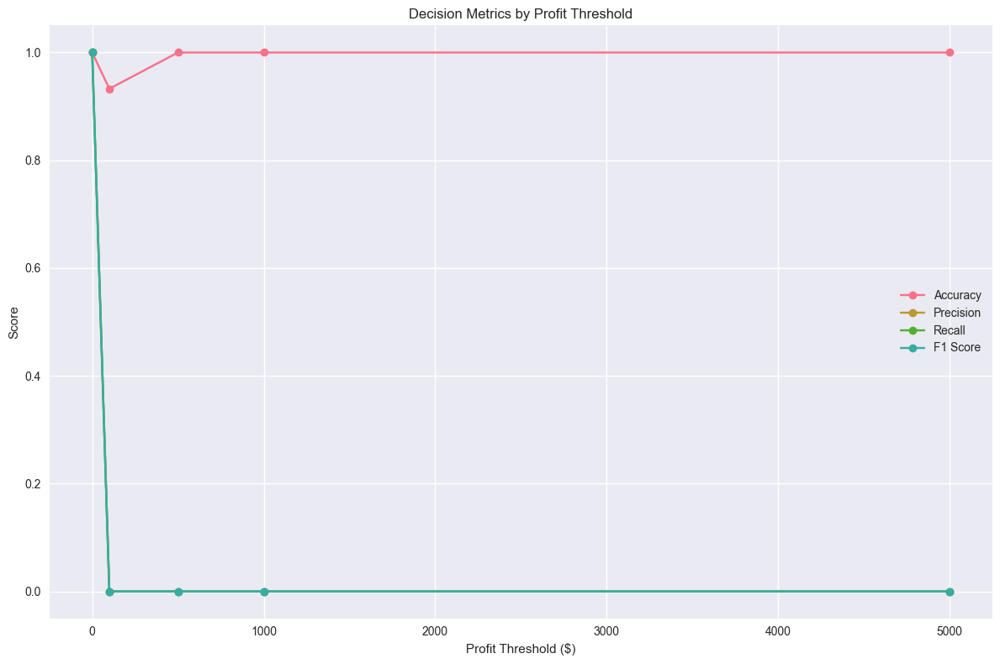

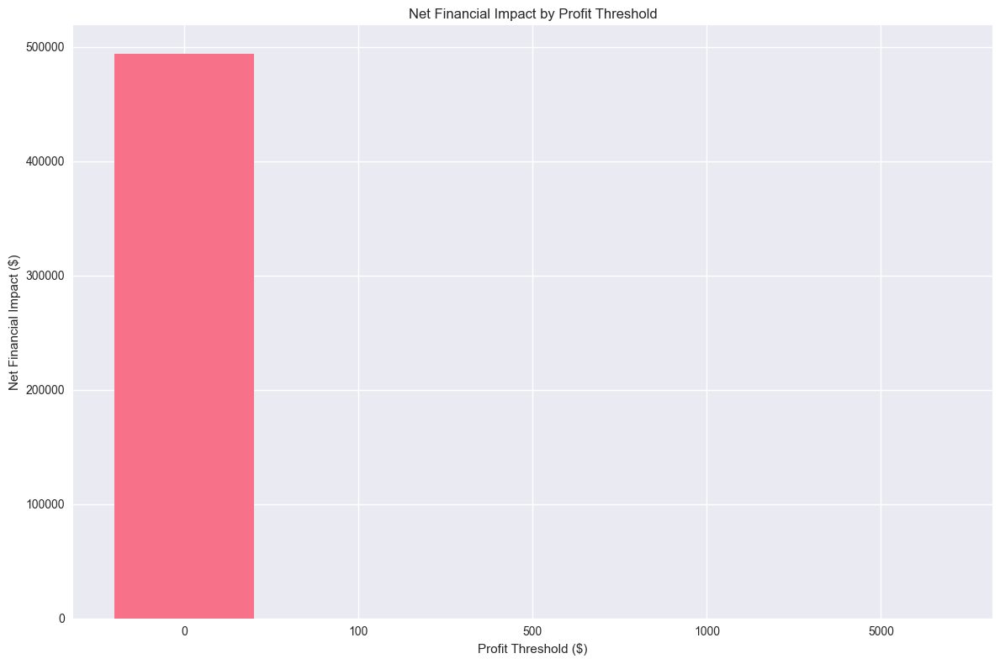

In [13]:
# Business decision analysis
# Analyze how prediction errors would affect business decisions

# Define a function to simulate business decisions based on profitability threshold
def simulate_business_decisions(actual_values, predicted_values, price_compra, price_venda, 
                               profit_threshold=0):
    """
    Simulate business decisions based on predicted profitability
    
    Parameters:
    -----------
    actual_values : array-like, actual production/sales values
    predicted_values : array-like, predicted production/sales values
    price_compra : array-like, purchase prices
    price_venda : array-like, selling prices
    profit_threshold : float, minimum profit threshold for a positive decision
    
    Returns:
    --------
    dict : dictionary with decision analysis results
    """
    # Calculate actual and predicted profits
    actual_profit = actual_values * price_venda - actual_values * price_compra
    predicted_profit = predicted_values * price_venda - predicted_values * price_compra
    
    # Make decisions based on predicted profit
    predicted_decision = predicted_profit > profit_threshold
    actual_outcome = actual_profit > profit_threshold
    
    # Analyze decision outcomes
    true_positive = np.sum((predicted_decision == True) & (actual_outcome == True))
    false_positive = np.sum((predicted_decision == True) & (actual_outcome == False))
    true_negative = np.sum((predicted_decision == False) & (actual_outcome == False))
    false_negative = np.sum((predicted_decision == False) & (actual_outcome == True))
    
    # Calculate metrics
    total_decisions = len(actual_values)
    accuracy = (true_positive + true_negative) / total_decisions
    precision = true_positive / (true_positive + false_positive) if (true_positive + false_positive) > 0 else 0
    recall = true_positive / (true_positive + false_negative) if (true_positive + false_negative) > 0 else 0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0
    
    # Calculate financial impact
    # Use boolean indexing correctly by creating boolean arrays first
    false_negative_mask = (predicted_decision == False) & (actual_outcome == True)
    false_positive_mask = (predicted_decision == True) & (actual_outcome == False)
    true_positive_mask = (predicted_decision == True) & (actual_outcome == True)
    true_negative_mask = (predicted_decision == False) & (actual_outcome == False)
    
    missed_profit = np.sum(actual_profit[false_negative_mask])
    wasted_investment = np.sum(-actual_profit[false_positive_mask])
    correct_profit = np.sum(actual_profit[true_positive_mask])
    correct_avoidance = np.sum(-actual_profit[true_negative_mask])
    
    return {
        'true_positive': true_positive,
        'false_positive': false_positive,
        'true_negative': true_negative,
        'false_negative': false_negative,
        'accuracy': accuracy,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'missed_profit': missed_profit,
        'wasted_investment': wasted_investment,
        'correct_profit': correct_profit,
        'correct_avoidance': correct_avoidance,
        'net_impact': correct_profit - wasted_investment
    }

# Simulate decisions with different profit thresholds
thresholds = [0, 100, 500, 1000, 5000]
decision_results = []

for threshold in thresholds:
    result = simulate_business_decisions(
        financial_df['actual_value'].values,
        financial_df['predicted_value'].values,
        financial_df['avg_price_compra'].values,
        financial_df['avg_price_venda'].values,
        threshold
    )
    result['threshold'] = threshold
    decision_results.append(result)

# Create a dataframe with decision results
decision_df = pd.DataFrame(decision_results)

print("\nBusiness Decision Analysis with Different Profit Thresholds:")
display(decision_df[['threshold', 'accuracy', 'precision', 'recall', 'f1']])

print("\nFinancial Impact of Decisions:")
display(decision_df[['threshold', 'correct_profit', 'wasted_investment', 
                    'missed_profit', 'correct_avoidance', 'net_impact']])

# Visualize decision metrics by threshold
plt.figure(figsize=(12, 8))
plt.plot(decision_df['threshold'], decision_df['accuracy'], 'o-', label='Accuracy')
plt.plot(decision_df['threshold'], decision_df['precision'], 'o-', label='Precision')
plt.plot(decision_df['threshold'], decision_df['recall'], 'o-', label='Recall')
plt.plot(decision_df['threshold'], decision_df['f1'], 'o-', label='F1 Score')
plt.xlabel('Profit Threshold ($)')
plt.ylabel('Score')
plt.title('Decision Metrics by Profit Threshold')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# Visualize financial impact by threshold
plt.figure(figsize=(12, 8))
plt.bar(decision_df['threshold'].astype(str), decision_df['net_impact'])
plt.xlabel('Profit Threshold ($)')
plt.ylabel('Net Financial Impact ($)')
plt.title('Net Financial Impact by Profit Threshold')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

In [14]:
# Final conclusions with financial insights
print("\n=== Final Conclusions with Financial Insights ===")
print(f"Model type: {type(best_model).__name__}")
print(f"Test set RMSE: {test_results['rmse']:.4f}")
print(f"Test set R²: {test_results['r2']:.4f}")

print(f"\nFinancial Impact:")
print(f"Total Actual Revenue: ${financial_df['actual_revenue'].sum():,.2f}")
print(f"Revenue Prediction Error: ${financial_df['actual_revenue'].sum() - financial_df['predicted_revenue'].sum():,.2f} " +
      f"({(financial_df['actual_revenue'].sum() - financial_df['predicted_revenue'].sum()) / financial_df['actual_revenue'].sum() * 100:.2f}%)")
print(f"Total Actual Profit: ${financial_df['actual_profit'].sum():,.2f}")
print(f"Profit Prediction Error: ${financial_df['actual_profit'].sum() - financial_df['predicted_profit'].sum():,.2f} " +
      f"({(financial_df['actual_profit'].sum() - financial_df['predicted_profit'].sum()) / financial_df['actual_profit'].sum() * 100:.2f}%)")


=== Final Conclusions with Financial Insights ===
Model type: RandomForestRegressor
Test set RMSE: 1.0275
Test set R²: -0.2517

Financial Impact:
Total Actual Revenue: $4,441,103.35
Revenue Prediction Error: $725,492.66 (16.34%)
Total Actual Profit: $493,765.82
Profit Prediction Error: $80,475.89 (16.30%)


## Final takeaways

1. Model Performance & Forecast Quality
The model tends to underestimate actual values (~75% of the time). While this limits the risk of stock overages, it raises the possibility of 
missed opportunities (insufficient inventory or capacity).

2. Financial Impact Analysis
Revenue & Profit:
Total Actual Revenue: $4.44M vs. Predicted: $4.08M
Total Actual Profit: $495K vs. Predicted: $456K
Each ~8% below actuals, confirming the underestimation bias.

3. Business Implications
Potential underinvestment in capacity or inventory, especially during periods of rising demand.
Underestimated margins could still be manageable if there is slack in supply. However, fast‐moving markets or 
high‐volatility periods amplify the risk of lost sales.
Current forecast can serve as a conservative baseline. Actual performance will often exceed these 
conservative projections, which is safer from a risk perspective but may limit growth.

he model provides a conservative prediction of revenue and profit, which can be useful for risk‐averse budgeting or baseline forecasts. However, to capture growth opportunities, you may want to augment the model with additional data sources and adopt dynamic thresholds to prevent missing out on profitable ventures. By iterating on these improvements and monitoring performance closely, you can align your forecasts more closely with actual market realities.